# Suo

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: False


In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "dataset_complete_Suo_age.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata.obs["age"] = adata.obs["age"].astype(float)
adata.obs["age_categorical"] = adata.obs["age"].astype(str)
d = {i: ind for ind, i in enumerate(sorted(adata.obs["age"].astype(float).unique()))}
adata.obs["age_training"] = [d[float(i)] for i in adata.obs["age"]]
print(adata_file_path, flush=True)
print(adata, flush=True)

/lustre/groups/ml01/workspace/kemal.inecik/tardis_data/processed/dataset_complete_Suo_age.h5ad


AnnData object with n_obs × n_vars = 73697 × 8192
    obs: 'sample_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'concatenated_integration_covariates', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'n_genes', 'age_categorical', 'age_training'
    uns: 'rank_genes_groups'
    obsm: 'Unintegrated', 'X_pca', 'harmony'


In [6]:
adata.obs[["age_training", "age"]].value_counts()

age_training  age 
2             9.0     23612
1             8.0     18965
4             16.0     9444
0             7.0      8344
5             17.0     7319
3             12.0     6013
dtype: int64

In [7]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|age_categorical",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 0.25,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 512,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [8]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "age_training",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="pseudo_categorical",
                non_categorical_coefficient_method="squared_difference",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [9]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=False
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['age_categorical']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "suo_age-continuous_5_encode"
)

vae.save(
    dir_path,
    overwrite=True,
)

W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: f5j4x8ni
Name: rare-sound-581
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/f5j4x8ni
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240506_182846-f5j4x8ni/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_training` for `training` set. Number of elements in each group: 6662,15112,18994,4756,7542,5892
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_training` for `validation` set. Number of elements in each group: 1682,3853,4618,1257,1902,1427
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:42<7:01:37, 42.23s/it]

Epoch 1/600:   0%|          | 1/600 [00:42<7:01:37, 42.23s/it, v_num=ni_1, total_loss_train=589, kl_local_train=48.2]

Epoch 2/600:   0%|          | 1/600 [00:42<7:01:37, 42.23s/it, v_num=ni_1, total_loss_train=589, kl_local_train=48.2]

Epoch 2/600:   0%|          | 2/600 [01:17<6:20:57, 38.22s/it, v_num=ni_1, total_loss_train=589, kl_local_train=48.2]

Epoch 2/600:   0%|          | 2/600 [01:17<6:20:57, 38.22s/it, v_num=ni_1, total_loss_train=458, kl_local_train=76.5]

Epoch 3/600:   0%|          | 2/600 [01:17<6:20:57, 38.22s/it, v_num=ni_1, total_loss_train=458, kl_local_train=76.5]

Epoch 3/600:   0%|          | 3/600 [01:52<6:04:32, 36.64s/it, v_num=ni_1, total_loss_train=458, kl_local_train=76.5]

Epoch 3/600:   0%|          | 3/600 [01:52<6:04:32, 36.64s/it, v_num=ni_1, total_loss_train=441, kl_local_train=85.5]

Epoch 4/600:   0%|          | 3/600 [01:52<6:04:32, 36.64s/it, v_num=ni_1, total_loss_train=441, kl_local_train=85.5]

Epoch 4/600:   1%|          | 4/600 [02:29<6:05:48, 36.83s/it, v_num=ni_1, total_loss_train=441, kl_local_train=85.5]

Epoch 4/600:   1%|          | 4/600 [02:29<6:05:48, 36.83s/it, v_num=ni_1, total_loss_train=434, kl_local_train=86.6]

Epoch 5/600:   1%|          | 4/600 [02:29<6:05:48, 36.83s/it, v_num=ni_1, total_loss_train=434, kl_local_train=86.6]

Epoch 5/600:   1%|          | 5/600 [03:09<6:16:45, 37.99s/it, v_num=ni_1, total_loss_train=434, kl_local_train=86.6]

Epoch 5/600:   1%|          | 5/600 [03:09<6:16:45, 37.99s/it, v_num=ni_1, total_loss_train=430, kl_local_train=85.1]

Epoch 6/600:   1%|          | 5/600 [03:10<6:16:45, 37.99s/it, v_num=ni_1, total_loss_train=430, kl_local_train=85.1]

Epoch 6/600:   1%|          | 6/600 [03:44<6:06:32, 37.02s/it, v_num=ni_1, total_loss_train=430, kl_local_train=85.1]

Epoch 6/600:   1%|          | 6/600 [03:44<6:06:32, 37.02s/it, v_num=ni_1, total_loss_train=427, kl_local_train=83.1, metric_mi|age_categorical_train=0.0763]

Epoch 7/600:   1%|          | 6/600 [03:44<6:06:32, 37.02s/it, v_num=ni_1, total_loss_train=427, kl_local_train=83.1, metric_mi|age_categorical_train=0.0763]

Epoch 7/600:   1%|          | 7/600 [04:17<5:50:48, 35.50s/it, v_num=ni_1, total_loss_train=427, kl_local_train=83.1, metric_mi|age_categorical_train=0.0763]

Epoch 7/600:   1%|          | 7/600 [04:17<5:50:48, 35.50s/it, v_num=ni_1, total_loss_train=424, kl_local_train=80.3, metric_mi|age_categorical_train=0.0763]

Epoch 8/600:   1%|          | 7/600 [04:17<5:50:48, 35.50s/it, v_num=ni_1, total_loss_train=424, kl_local_train=80.3, metric_mi|age_categorical_train=0.0763]

Epoch 8/600:   1%|▏         | 8/600 [04:49<5:40:53, 34.55s/it, v_num=ni_1, total_loss_train=424, kl_local_train=80.3, metric_mi|age_categorical_train=0.0763]

Epoch 8/600:   1%|▏         | 8/600 [04:49<5:40:53, 34.55s/it, v_num=ni_1, total_loss_train=428, kl_local_train=76.8, metric_mi|age_categorical_train=0.0763]

Epoch 9/600:   1%|▏         | 8/600 [04:49<5:40:53, 34.55s/it, v_num=ni_1, total_loss_train=428, kl_local_train=76.8, metric_mi|age_categorical_train=0.0763]

Epoch 9/600:   2%|▏         | 9/600 [05:22<5:34:20, 33.94s/it, v_num=ni_1, total_loss_train=428, kl_local_train=76.8, metric_mi|age_categorical_train=0.0763]

Epoch 9/600:   2%|▏         | 9/600 [05:22<5:34:20, 33.94s/it, v_num=ni_1, total_loss_train=431, kl_local_train=70.4, metric_mi|age_categorical_train=0.0763]

Epoch 10/600:   2%|▏         | 9/600 [05:22<5:34:20, 33.94s/it, v_num=ni_1, total_loss_train=431, kl_local_train=70.4, metric_mi|age_categorical_train=0.0763]

Epoch 10/600:   2%|▏         | 10/600 [05:57<5:37:55, 34.36s/it, v_num=ni_1, total_loss_train=431, kl_local_train=70.4, metric_mi|age_categorical_train=0.0763]

Epoch 10/600:   2%|▏         | 10/600 [05:57<5:37:55, 34.36s/it, v_num=ni_1, total_loss_train=434, kl_local_train=74.9, metric_mi|age_categorical_train=0.0763]

Epoch 11/600:   2%|▏         | 10/600 [05:58<5:37:55, 34.36s/it, v_num=ni_1, total_loss_train=434, kl_local_train=74.9, metric_mi|age_categorical_train=0.0763]

Epoch 11/600:   2%|▏         | 11/600 [06:31<5:35:55, 34.22s/it, v_num=ni_1, total_loss_train=434, kl_local_train=74.9, metric_mi|age_categorical_train=0.0763]

Epoch 11/600:   2%|▏         | 11/600 [06:31<5:35:55, 34.22s/it, v_num=ni_1, total_loss_train=435, kl_local_train=104, metric_mi|age_categorical_train=0.083]  

Epoch 12/600:   2%|▏         | 11/600 [06:31<5:35:55, 34.22s/it, v_num=ni_1, total_loss_train=435, kl_local_train=104, metric_mi|age_categorical_train=0.083]

Epoch 12/600:   2%|▏         | 12/600 [07:06<5:38:21, 34.53s/it, v_num=ni_1, total_loss_train=435, kl_local_train=104, metric_mi|age_categorical_train=0.083]

Epoch 12/600:   2%|▏         | 12/600 [07:06<5:38:21, 34.53s/it, v_num=ni_1, total_loss_train=435, kl_local_train=131, metric_mi|age_categorical_train=0.083]

Epoch 13/600:   2%|▏         | 12/600 [07:06<5:38:21, 34.53s/it, v_num=ni_1, total_loss_train=435, kl_local_train=131, metric_mi|age_categorical_train=0.083]

Epoch 13/600:   2%|▏         | 13/600 [07:39<5:32:50, 34.02s/it, v_num=ni_1, total_loss_train=435, kl_local_train=131, metric_mi|age_categorical_train=0.083]

Epoch 13/600:   2%|▏         | 13/600 [07:39<5:32:50, 34.02s/it, v_num=ni_1, total_loss_train=436, kl_local_train=138, metric_mi|age_categorical_train=0.083]

Epoch 14/600:   2%|▏         | 13/600 [07:39<5:32:50, 34.02s/it, v_num=ni_1, total_loss_train=436, kl_local_train=138, metric_mi|age_categorical_train=0.083]

Epoch 14/600:   2%|▏         | 14/600 [08:15<5:38:15, 34.63s/it, v_num=ni_1, total_loss_train=436, kl_local_train=138, metric_mi|age_categorical_train=0.083]

Epoch 14/600:   2%|▏         | 14/600 [08:15<5:38:15, 34.63s/it, v_num=ni_1, total_loss_train=437, kl_local_train=141, metric_mi|age_categorical_train=0.083]

Epoch 15/600:   2%|▏         | 14/600 [08:15<5:38:15, 34.63s/it, v_num=ni_1, total_loss_train=437, kl_local_train=141, metric_mi|age_categorical_train=0.083]

Epoch 15/600:   2%|▎         | 15/600 [08:53<5:46:23, 35.53s/it, v_num=ni_1, total_loss_train=437, kl_local_train=141, metric_mi|age_categorical_train=0.083]

Epoch 15/600:   2%|▎         | 15/600 [08:53<5:46:23, 35.53s/it, v_num=ni_1, total_loss_train=439, kl_local_train=138, metric_mi|age_categorical_train=0.083]

Epoch 16/600:   2%|▎         | 15/600 [08:54<5:46:23, 35.53s/it, v_num=ni_1, total_loss_train=439, kl_local_train=138, metric_mi|age_categorical_train=0.083]

Epoch 16/600:   3%|▎         | 16/600 [09:28<5:43:53, 35.33s/it, v_num=ni_1, total_loss_train=439, kl_local_train=138, metric_mi|age_categorical_train=0.083]

Epoch 16/600:   3%|▎         | 16/600 [09:28<5:43:53, 35.33s/it, v_num=ni_1, total_loss_train=440, kl_local_train=136, metric_mi|age_categorical_train=0.124]

Epoch 17/600:   3%|▎         | 16/600 [09:28<5:43:53, 35.33s/it, v_num=ni_1, total_loss_train=440, kl_local_train=136, metric_mi|age_categorical_train=0.124]

Epoch 17/600:   3%|▎         | 17/600 [10:03<5:43:41, 35.37s/it, v_num=ni_1, total_loss_train=440, kl_local_train=136, metric_mi|age_categorical_train=0.124]

Epoch 17/600:   3%|▎         | 17/600 [10:03<5:43:41, 35.37s/it, v_num=ni_1, total_loss_train=441, kl_local_train=140, metric_mi|age_categorical_train=0.124]

Epoch 18/600:   3%|▎         | 17/600 [10:03<5:43:41, 35.37s/it, v_num=ni_1, total_loss_train=441, kl_local_train=140, metric_mi|age_categorical_train=0.124]

Epoch 18/600:   3%|▎         | 18/600 [10:37<5:39:13, 34.97s/it, v_num=ni_1, total_loss_train=441, kl_local_train=140, metric_mi|age_categorical_train=0.124]

Epoch 18/600:   3%|▎         | 18/600 [10:37<5:39:13, 34.97s/it, v_num=ni_1, total_loss_train=442, kl_local_train=138, metric_mi|age_categorical_train=0.124]

Epoch 19/600:   3%|▎         | 18/600 [10:37<5:39:13, 34.97s/it, v_num=ni_1, total_loss_train=442, kl_local_train=138, metric_mi|age_categorical_train=0.124]

Epoch 19/600:   3%|▎         | 19/600 [11:11<5:37:00, 34.80s/it, v_num=ni_1, total_loss_train=442, kl_local_train=138, metric_mi|age_categorical_train=0.124]

Epoch 19/600:   3%|▎         | 19/600 [11:11<5:37:00, 34.80s/it, v_num=ni_1, total_loss_train=443, kl_local_train=150, metric_mi|age_categorical_train=0.124]

Epoch 20/600:   3%|▎         | 19/600 [11:11<5:37:00, 34.80s/it, v_num=ni_1, total_loss_train=443, kl_local_train=150, metric_mi|age_categorical_train=0.124]

Epoch 20/600:   3%|▎         | 20/600 [11:46<5:36:24, 34.80s/it, v_num=ni_1, total_loss_train=443, kl_local_train=150, metric_mi|age_categorical_train=0.124]

Epoch 20/600:   3%|▎         | 20/600 [11:46<5:36:24, 34.80s/it, v_num=ni_1, total_loss_train=444, kl_local_train=146, metric_mi|age_categorical_train=0.124]

Epoch 21/600:   3%|▎         | 20/600 [11:47<5:36:24, 34.80s/it, v_num=ni_1, total_loss_train=444, kl_local_train=146, metric_mi|age_categorical_train=0.124]

Epoch 21/600:   4%|▎         | 21/600 [12:20<5:33:15, 34.53s/it, v_num=ni_1, total_loss_train=444, kl_local_train=146, metric_mi|age_categorical_train=0.124]

Epoch 21/600:   4%|▎         | 21/600 [12:20<5:33:15, 34.53s/it, v_num=ni_1, total_loss_train=445, kl_local_train=149, metric_mi|age_categorical_train=0.166]

Epoch 22/600:   4%|▎         | 21/600 [12:20<5:33:15, 34.53s/it, v_num=ni_1, total_loss_train=445, kl_local_train=149, metric_mi|age_categorical_train=0.166]

Epoch 22/600:   4%|▎         | 22/600 [12:53<5:28:44, 34.13s/it, v_num=ni_1, total_loss_train=445, kl_local_train=149, metric_mi|age_categorical_train=0.166]

Epoch 22/600:   4%|▎         | 22/600 [12:53<5:28:44, 34.13s/it, v_num=ni_1, total_loss_train=446, kl_local_train=140, metric_mi|age_categorical_train=0.166]

Epoch 23/600:   4%|▎         | 22/600 [12:53<5:28:44, 34.13s/it, v_num=ni_1, total_loss_train=446, kl_local_train=140, metric_mi|age_categorical_train=0.166]

Epoch 23/600:   4%|▍         | 23/600 [13:27<5:25:37, 33.86s/it, v_num=ni_1, total_loss_train=446, kl_local_train=140, metric_mi|age_categorical_train=0.166]

Epoch 23/600:   4%|▍         | 23/600 [13:27<5:25:37, 33.86s/it, v_num=ni_1, total_loss_train=447, kl_local_train=145, metric_mi|age_categorical_train=0.166]

Epoch 24/600:   4%|▍         | 23/600 [13:27<5:25:37, 33.86s/it, v_num=ni_1, total_loss_train=447, kl_local_train=145, metric_mi|age_categorical_train=0.166]

Epoch 24/600:   4%|▍         | 24/600 [14:00<5:22:40, 33.61s/it, v_num=ni_1, total_loss_train=447, kl_local_train=145, metric_mi|age_categorical_train=0.166]

Epoch 24/600:   4%|▍         | 24/600 [14:00<5:22:40, 33.61s/it, v_num=ni_1, total_loss_train=448, kl_local_train=145, metric_mi|age_categorical_train=0.166]

Epoch 25/600:   4%|▍         | 24/600 [14:00<5:22:40, 33.61s/it, v_num=ni_1, total_loss_train=448, kl_local_train=145, metric_mi|age_categorical_train=0.166]

Epoch 25/600:   4%|▍         | 25/600 [14:34<5:22:59, 33.70s/it, v_num=ni_1, total_loss_train=448, kl_local_train=145, metric_mi|age_categorical_train=0.166]

Epoch 25/600:   4%|▍         | 25/600 [14:34<5:22:59, 33.70s/it, v_num=ni_1, total_loss_train=450, kl_local_train=153, metric_mi|age_categorical_train=0.166]

Epoch 26/600:   4%|▍         | 25/600 [14:34<5:22:59, 33.70s/it, v_num=ni_1, total_loss_train=450, kl_local_train=153, metric_mi|age_categorical_train=0.166]

Epoch 26/600:   4%|▍         | 26/600 [15:07<5:21:15, 33.58s/it, v_num=ni_1, total_loss_train=450, kl_local_train=153, metric_mi|age_categorical_train=0.166]

Epoch 26/600:   4%|▍         | 26/600 [15:07<5:21:15, 33.58s/it, v_num=ni_1, total_loss_train=450, kl_local_train=151, metric_mi|age_categorical_train=0.172]

Epoch 27/600:   4%|▍         | 26/600 [15:07<5:21:15, 33.58s/it, v_num=ni_1, total_loss_train=450, kl_local_train=151, metric_mi|age_categorical_train=0.172]

Epoch 27/600:   4%|▍         | 27/600 [15:39<5:18:05, 33.31s/it, v_num=ni_1, total_loss_train=450, kl_local_train=151, metric_mi|age_categorical_train=0.172]

Epoch 27/600:   4%|▍         | 27/600 [15:39<5:18:05, 33.31s/it, v_num=ni_1, total_loss_train=452, kl_local_train=158, metric_mi|age_categorical_train=0.172]

Epoch 28/600:   4%|▍         | 27/600 [15:39<5:18:05, 33.31s/it, v_num=ni_1, total_loss_train=452, kl_local_train=158, metric_mi|age_categorical_train=0.172]

Epoch 28/600:   5%|▍         | 28/600 [16:12<5:14:45, 33.02s/it, v_num=ni_1, total_loss_train=452, kl_local_train=158, metric_mi|age_categorical_train=0.172]

Epoch 28/600:   5%|▍         | 28/600 [16:12<5:14:45, 33.02s/it, v_num=ni_1, total_loss_train=453, kl_local_train=151, metric_mi|age_categorical_train=0.172]

Epoch 29/600:   5%|▍         | 28/600 [16:12<5:14:45, 33.02s/it, v_num=ni_1, total_loss_train=453, kl_local_train=151, metric_mi|age_categorical_train=0.172]

Epoch 29/600:   5%|▍         | 29/600 [16:44<5:12:16, 32.81s/it, v_num=ni_1, total_loss_train=453, kl_local_train=151, metric_mi|age_categorical_train=0.172]

Epoch 29/600:   5%|▍         | 29/600 [16:44<5:12:16, 32.81s/it, v_num=ni_1, total_loss_train=454, kl_local_train=155, metric_mi|age_categorical_train=0.172]

Epoch 30/600:   5%|▍         | 29/600 [16:44<5:12:16, 32.81s/it, v_num=ni_1, total_loss_train=454, kl_local_train=155, metric_mi|age_categorical_train=0.172]

Epoch 30/600:   5%|▌         | 30/600 [17:18<5:13:50, 33.04s/it, v_num=ni_1, total_loss_train=454, kl_local_train=155, metric_mi|age_categorical_train=0.172]

Epoch 30/600:   5%|▌         | 30/600 [17:18<5:13:50, 33.04s/it, v_num=ni_1, total_loss_train=455, kl_local_train=160, metric_mi|age_categorical_train=0.172]

Epoch 31/600:   5%|▌         | 30/600 [17:19<5:13:50, 33.04s/it, v_num=ni_1, total_loss_train=455, kl_local_train=160, metric_mi|age_categorical_train=0.172]

Epoch 31/600:   5%|▌         | 31/600 [17:51<5:14:00, 33.11s/it, v_num=ni_1, total_loss_train=455, kl_local_train=160, metric_mi|age_categorical_train=0.172]

Epoch 31/600:   5%|▌         | 31/600 [17:51<5:14:00, 33.11s/it, v_num=ni_1, total_loss_train=457, kl_local_train=167, metric_mi|age_categorical_train=0.202]

Epoch 32/600:   5%|▌         | 31/600 [17:51<5:14:00, 33.11s/it, v_num=ni_1, total_loss_train=457, kl_local_train=167, metric_mi|age_categorical_train=0.202]

Epoch 32/600:   5%|▌         | 32/600 [18:24<5:12:09, 32.97s/it, v_num=ni_1, total_loss_train=457, kl_local_train=167, metric_mi|age_categorical_train=0.202]

Epoch 32/600:   5%|▌         | 32/600 [18:24<5:12:09, 32.97s/it, v_num=ni_1, total_loss_train=457, kl_local_train=168, metric_mi|age_categorical_train=0.202]

Epoch 33/600:   5%|▌         | 32/600 [18:24<5:12:09, 32.97s/it, v_num=ni_1, total_loss_train=457, kl_local_train=168, metric_mi|age_categorical_train=0.202]

Epoch 33/600:   6%|▌         | 33/600 [18:56<5:10:43, 32.88s/it, v_num=ni_1, total_loss_train=457, kl_local_train=168, metric_mi|age_categorical_train=0.202]

Epoch 33/600:   6%|▌         | 33/600 [18:56<5:10:43, 32.88s/it, v_num=ni_1, total_loss_train=459, kl_local_train=172, metric_mi|age_categorical_train=0.202]

Epoch 34/600:   6%|▌         | 33/600 [18:56<5:10:43, 32.88s/it, v_num=ni_1, total_loss_train=459, kl_local_train=172, metric_mi|age_categorical_train=0.202]

Epoch 34/600:   6%|▌         | 34/600 [19:29<5:08:49, 32.74s/it, v_num=ni_1, total_loss_train=459, kl_local_train=172, metric_mi|age_categorical_train=0.202]

Epoch 34/600:   6%|▌         | 34/600 [19:29<5:08:49, 32.74s/it, v_num=ni_1, total_loss_train=460, kl_local_train=175, metric_mi|age_categorical_train=0.202]

Epoch 35/600:   6%|▌         | 34/600 [19:29<5:08:49, 32.74s/it, v_num=ni_1, total_loss_train=460, kl_local_train=175, metric_mi|age_categorical_train=0.202]

Epoch 35/600:   6%|▌         | 35/600 [20:03<5:11:15, 33.05s/it, v_num=ni_1, total_loss_train=460, kl_local_train=175, metric_mi|age_categorical_train=0.202]

Epoch 35/600:   6%|▌         | 35/600 [20:03<5:11:15, 33.05s/it, v_num=ni_1, total_loss_train=461, kl_local_train=167, metric_mi|age_categorical_train=0.202]

Epoch 36/600:   6%|▌         | 35/600 [20:03<5:11:15, 33.05s/it, v_num=ni_1, total_loss_train=461, kl_local_train=167, metric_mi|age_categorical_train=0.202]

Epoch 36/600:   6%|▌         | 36/600 [20:36<5:11:28, 33.14s/it, v_num=ni_1, total_loss_train=461, kl_local_train=167, metric_mi|age_categorical_train=0.202]

Epoch 36/600:   6%|▌         | 36/600 [20:36<5:11:28, 33.14s/it, v_num=ni_1, total_loss_train=462, kl_local_train=180, metric_mi|age_categorical_train=0.222]

Epoch 37/600:   6%|▌         | 36/600 [20:36<5:11:28, 33.14s/it, v_num=ni_1, total_loss_train=462, kl_local_train=180, metric_mi|age_categorical_train=0.222]

Epoch 37/600:   6%|▌         | 37/600 [21:08<5:08:39, 32.89s/it, v_num=ni_1, total_loss_train=462, kl_local_train=180, metric_mi|age_categorical_train=0.222]

Epoch 37/600:   6%|▌         | 37/600 [21:08<5:08:39, 32.89s/it, v_num=ni_1, total_loss_train=463, kl_local_train=182, metric_mi|age_categorical_train=0.222]

Epoch 38/600:   6%|▌         | 37/600 [21:08<5:08:39, 32.89s/it, v_num=ni_1, total_loss_train=463, kl_local_train=182, metric_mi|age_categorical_train=0.222]

Epoch 38/600:   6%|▋         | 38/600 [21:41<5:07:12, 32.80s/it, v_num=ni_1, total_loss_train=463, kl_local_train=182, metric_mi|age_categorical_train=0.222]

Epoch 38/600:   6%|▋         | 38/600 [21:41<5:07:12, 32.80s/it, v_num=ni_1, total_loss_train=465, kl_local_train=186, metric_mi|age_categorical_train=0.222]

Epoch 39/600:   6%|▋         | 38/600 [21:41<5:07:12, 32.80s/it, v_num=ni_1, total_loss_train=465, kl_local_train=186, metric_mi|age_categorical_train=0.222]

Epoch 39/600:   6%|▋         | 39/600 [22:13<5:06:28, 32.78s/it, v_num=ni_1, total_loss_train=465, kl_local_train=186, metric_mi|age_categorical_train=0.222]

Epoch 39/600:   6%|▋         | 39/600 [22:13<5:06:28, 32.78s/it, v_num=ni_1, total_loss_train=466, kl_local_train=185, metric_mi|age_categorical_train=0.222]

Epoch 40/600:   6%|▋         | 39/600 [22:13<5:06:28, 32.78s/it, v_num=ni_1, total_loss_train=466, kl_local_train=185, metric_mi|age_categorical_train=0.222]

Epoch 40/600:   7%|▋         | 40/600 [22:48<5:09:30, 33.16s/it, v_num=ni_1, total_loss_train=466, kl_local_train=185, metric_mi|age_categorical_train=0.222]

Epoch 40/600:   7%|▋         | 40/600 [22:48<5:09:30, 33.16s/it, v_num=ni_1, total_loss_train=466, kl_local_train=176, metric_mi|age_categorical_train=0.222]

Epoch 41/600:   7%|▋         | 40/600 [22:48<5:09:30, 33.16s/it, v_num=ni_1, total_loss_train=466, kl_local_train=176, metric_mi|age_categorical_train=0.222]

Epoch 41/600:   7%|▋         | 41/600 [23:21<5:10:18, 33.31s/it, v_num=ni_1, total_loss_train=466, kl_local_train=176, metric_mi|age_categorical_train=0.222]

Epoch 41/600:   7%|▋         | 41/600 [23:21<5:10:18, 33.31s/it, v_num=ni_1, total_loss_train=467, kl_local_train=176, metric_mi|age_categorical_train=0.225]

Epoch 42/600:   7%|▋         | 41/600 [23:21<5:10:18, 33.31s/it, v_num=ni_1, total_loss_train=467, kl_local_train=176, metric_mi|age_categorical_train=0.225]

Epoch 42/600:   7%|▋         | 42/600 [23:54<5:07:17, 33.04s/it, v_num=ni_1, total_loss_train=467, kl_local_train=176, metric_mi|age_categorical_train=0.225]

Epoch 42/600:   7%|▋         | 42/600 [23:54<5:07:17, 33.04s/it, v_num=ni_1, total_loss_train=468, kl_local_train=174, metric_mi|age_categorical_train=0.225]

Epoch 43/600:   7%|▋         | 42/600 [23:54<5:07:17, 33.04s/it, v_num=ni_1, total_loss_train=468, kl_local_train=174, metric_mi|age_categorical_train=0.225]

Epoch 43/600:   7%|▋         | 43/600 [24:26<5:04:55, 32.85s/it, v_num=ni_1, total_loss_train=468, kl_local_train=174, metric_mi|age_categorical_train=0.225]

Epoch 43/600:   7%|▋         | 43/600 [24:26<5:04:55, 32.85s/it, v_num=ni_1, total_loss_train=469, kl_local_train=174, metric_mi|age_categorical_train=0.225]

Epoch 44/600:   7%|▋         | 43/600 [24:26<5:04:55, 32.85s/it, v_num=ni_1, total_loss_train=469, kl_local_train=174, metric_mi|age_categorical_train=0.225]

Epoch 44/600:   7%|▋         | 44/600 [24:59<5:03:31, 32.76s/it, v_num=ni_1, total_loss_train=469, kl_local_train=174, metric_mi|age_categorical_train=0.225]

Epoch 44/600:   7%|▋         | 44/600 [24:59<5:03:31, 32.76s/it, v_num=ni_1, total_loss_train=471, kl_local_train=170, metric_mi|age_categorical_train=0.225]

Epoch 45/600:   7%|▋         | 44/600 [24:59<5:03:31, 32.76s/it, v_num=ni_1, total_loss_train=471, kl_local_train=170, metric_mi|age_categorical_train=0.225]

Epoch 45/600:   8%|▊         | 45/600 [25:33<5:06:28, 33.13s/it, v_num=ni_1, total_loss_train=471, kl_local_train=170, metric_mi|age_categorical_train=0.225]

Epoch 45/600:   8%|▊         | 45/600 [25:33<5:06:28, 33.13s/it, v_num=ni_1, total_loss_train=471, kl_local_train=168, metric_mi|age_categorical_train=0.225]

Epoch 46/600:   8%|▊         | 45/600 [25:33<5:06:28, 33.13s/it, v_num=ni_1, total_loss_train=471, kl_local_train=168, metric_mi|age_categorical_train=0.225]

Epoch 46/600:   8%|▊         | 46/600 [26:06<5:06:28, 33.19s/it, v_num=ni_1, total_loss_train=471, kl_local_train=168, metric_mi|age_categorical_train=0.225]

Epoch 46/600:   8%|▊         | 46/600 [26:06<5:06:28, 33.19s/it, v_num=ni_1, total_loss_train=473, kl_local_train=173, metric_mi|age_categorical_train=0.233]

Epoch 47/600:   8%|▊         | 46/600 [26:06<5:06:28, 33.19s/it, v_num=ni_1, total_loss_train=473, kl_local_train=173, metric_mi|age_categorical_train=0.233]

Epoch 47/600:   8%|▊         | 47/600 [26:39<5:04:35, 33.05s/it, v_num=ni_1, total_loss_train=473, kl_local_train=173, metric_mi|age_categorical_train=0.233]

Epoch 47/600:   8%|▊         | 47/600 [26:39<5:04:35, 33.05s/it, v_num=ni_1, total_loss_train=474, kl_local_train=174, metric_mi|age_categorical_train=0.233]

Epoch 48/600:   8%|▊         | 47/600 [26:39<5:04:35, 33.05s/it, v_num=ni_1, total_loss_train=474, kl_local_train=174, metric_mi|age_categorical_train=0.233]

Epoch 48/600:   8%|▊         | 48/600 [27:12<5:04:19, 33.08s/it, v_num=ni_1, total_loss_train=474, kl_local_train=174, metric_mi|age_categorical_train=0.233]

Epoch 48/600:   8%|▊         | 48/600 [27:12<5:04:19, 33.08s/it, v_num=ni_1, total_loss_train=475, kl_local_train=169, metric_mi|age_categorical_train=0.233]

Epoch 49/600:   8%|▊         | 48/600 [27:12<5:04:19, 33.08s/it, v_num=ni_1, total_loss_train=475, kl_local_train=169, metric_mi|age_categorical_train=0.233]

Epoch 49/600:   8%|▊         | 49/600 [27:44<5:01:57, 32.88s/it, v_num=ni_1, total_loss_train=475, kl_local_train=169, metric_mi|age_categorical_train=0.233]

Epoch 49/600:   8%|▊         | 49/600 [27:44<5:01:57, 32.88s/it, v_num=ni_1, total_loss_train=476, kl_local_train=163, metric_mi|age_categorical_train=0.233]

Epoch 50/600:   8%|▊         | 49/600 [27:44<5:01:57, 32.88s/it, v_num=ni_1, total_loss_train=476, kl_local_train=163, metric_mi|age_categorical_train=0.233]

Epoch 50/600:   8%|▊         | 50/600 [28:18<5:05:04, 33.28s/it, v_num=ni_1, total_loss_train=476, kl_local_train=163, metric_mi|age_categorical_train=0.233]

Epoch 50/600:   8%|▊         | 50/600 [28:18<5:05:04, 33.28s/it, v_num=ni_1, total_loss_train=477, kl_local_train=159, metric_mi|age_categorical_train=0.233]

Epoch 51/600:   8%|▊         | 50/600 [28:19<5:05:04, 33.28s/it, v_num=ni_1, total_loss_train=477, kl_local_train=159, metric_mi|age_categorical_train=0.233]

Epoch 51/600:   8%|▊         | 51/600 [28:52<5:04:19, 33.26s/it, v_num=ni_1, total_loss_train=477, kl_local_train=159, metric_mi|age_categorical_train=0.233]

Epoch 51/600:   8%|▊         | 51/600 [28:52<5:04:19, 33.26s/it, v_num=ni_1, total_loss_train=476, kl_local_train=163, metric_mi|age_categorical_train=0.243]

Epoch 52/600:   8%|▊         | 51/600 [28:52<5:04:19, 33.26s/it, v_num=ni_1, total_loss_train=476, kl_local_train=163, metric_mi|age_categorical_train=0.243]

Epoch 52/600:   9%|▊         | 52/600 [29:24<5:02:09, 33.08s/it, v_num=ni_1, total_loss_train=476, kl_local_train=163, metric_mi|age_categorical_train=0.243]

Epoch 52/600:   9%|▊         | 52/600 [29:24<5:02:09, 33.08s/it, v_num=ni_1, total_loss_train=476, kl_local_train=157, metric_mi|age_categorical_train=0.243]

Epoch 53/600:   9%|▊         | 52/600 [29:24<5:02:09, 33.08s/it, v_num=ni_1, total_loss_train=476, kl_local_train=157, metric_mi|age_categorical_train=0.243]

Epoch 53/600:   9%|▉         | 53/600 [29:57<5:00:43, 32.99s/it, v_num=ni_1, total_loss_train=476, kl_local_train=157, metric_mi|age_categorical_train=0.243]

Epoch 53/600:   9%|▉         | 53/600 [29:57<5:00:43, 32.99s/it, v_num=ni_1, total_loss_train=475, kl_local_train=157, metric_mi|age_categorical_train=0.243]

Epoch 54/600:   9%|▉         | 53/600 [29:57<5:00:43, 32.99s/it, v_num=ni_1, total_loss_train=475, kl_local_train=157, metric_mi|age_categorical_train=0.243]

Epoch 54/600:   9%|▉         | 54/600 [30:30<4:59:29, 32.91s/it, v_num=ni_1, total_loss_train=475, kl_local_train=157, metric_mi|age_categorical_train=0.243]

Epoch 54/600:   9%|▉         | 54/600 [30:30<4:59:29, 32.91s/it, v_num=ni_1, total_loss_train=474, kl_local_train=153, metric_mi|age_categorical_train=0.243]

Epoch 55/600:   9%|▉         | 54/600 [30:30<4:59:29, 32.91s/it, v_num=ni_1, total_loss_train=474, kl_local_train=153, metric_mi|age_categorical_train=0.243]

Epoch 55/600:   9%|▉         | 55/600 [31:03<5:00:49, 33.12s/it, v_num=ni_1, total_loss_train=474, kl_local_train=153, metric_mi|age_categorical_train=0.243]

Epoch 55/600:   9%|▉         | 55/600 [31:03<5:00:49, 33.12s/it, v_num=ni_1, total_loss_train=474, kl_local_train=151, metric_mi|age_categorical_train=0.243]

Epoch 56/600:   9%|▉         | 55/600 [31:04<5:00:49, 33.12s/it, v_num=ni_1, total_loss_train=474, kl_local_train=151, metric_mi|age_categorical_train=0.243]

Epoch 56/600:   9%|▉         | 56/600 [31:37<5:02:08, 33.32s/it, v_num=ni_1, total_loss_train=474, kl_local_train=151, metric_mi|age_categorical_train=0.243]

Epoch 56/600:   9%|▉         | 56/600 [31:37<5:02:08, 33.32s/it, v_num=ni_1, total_loss_train=474, kl_local_train=150, metric_mi|age_categorical_train=0.248]

Epoch 57/600:   9%|▉         | 56/600 [31:37<5:02:08, 33.32s/it, v_num=ni_1, total_loss_train=474, kl_local_train=150, metric_mi|age_categorical_train=0.248]

Epoch 57/600:  10%|▉         | 57/600 [32:10<5:00:45, 33.23s/it, v_num=ni_1, total_loss_train=474, kl_local_train=150, metric_mi|age_categorical_train=0.248]

Epoch 57/600:  10%|▉         | 57/600 [32:10<5:00:45, 33.23s/it, v_num=ni_1, total_loss_train=473, kl_local_train=147, metric_mi|age_categorical_train=0.248]

Epoch 58/600:  10%|▉         | 57/600 [32:10<5:00:45, 33.23s/it, v_num=ni_1, total_loss_train=473, kl_local_train=147, metric_mi|age_categorical_train=0.248]

Epoch 58/600:  10%|▉         | 58/600 [32:49<5:14:47, 34.85s/it, v_num=ni_1, total_loss_train=473, kl_local_train=147, metric_mi|age_categorical_train=0.248]

Epoch 58/600:  10%|▉         | 58/600 [32:49<5:14:47, 34.85s/it, v_num=ni_1, total_loss_train=473, kl_local_train=146, metric_mi|age_categorical_train=0.248]

Epoch 59/600:  10%|▉         | 58/600 [32:49<5:14:47, 34.85s/it, v_num=ni_1, total_loss_train=473, kl_local_train=146, metric_mi|age_categorical_train=0.248]

Epoch 59/600:  10%|▉         | 59/600 [33:28<5:25:53, 36.14s/it, v_num=ni_1, total_loss_train=473, kl_local_train=146, metric_mi|age_categorical_train=0.248]

Epoch 59/600:  10%|▉         | 59/600 [33:28<5:25:53, 36.14s/it, v_num=ni_1, total_loss_train=473, kl_local_train=145, metric_mi|age_categorical_train=0.248]

Epoch 60/600:  10%|▉         | 59/600 [33:28<5:25:53, 36.14s/it, v_num=ni_1, total_loss_train=473, kl_local_train=145, metric_mi|age_categorical_train=0.248]

Epoch 60/600:  10%|█         | 60/600 [34:07<5:34:23, 37.15s/it, v_num=ni_1, total_loss_train=473, kl_local_train=145, metric_mi|age_categorical_train=0.248]

Epoch 60/600:  10%|█         | 60/600 [34:07<5:34:23, 37.15s/it, v_num=ni_1, total_loss_train=472, kl_local_train=141, metric_mi|age_categorical_train=0.248]

Epoch 61/600:  10%|█         | 60/600 [34:08<5:34:23, 37.15s/it, v_num=ni_1, total_loss_train=472, kl_local_train=141, metric_mi|age_categorical_train=0.248]

Epoch 61/600:  10%|█         | 61/600 [34:47<5:41:04, 37.97s/it, v_num=ni_1, total_loss_train=472, kl_local_train=141, metric_mi|age_categorical_train=0.248]

Epoch 61/600:  10%|█         | 61/600 [34:47<5:41:04, 37.97s/it, v_num=ni_1, total_loss_train=472, kl_local_train=139, metric_mi|age_categorical_train=0.252]

Epoch 62/600:  10%|█         | 61/600 [34:47<5:41:04, 37.97s/it, v_num=ni_1, total_loss_train=472, kl_local_train=139, metric_mi|age_categorical_train=0.252]

Epoch 62/600:  10%|█         | 62/600 [35:22<5:31:52, 37.01s/it, v_num=ni_1, total_loss_train=472, kl_local_train=139, metric_mi|age_categorical_train=0.252]

Epoch 62/600:  10%|█         | 62/600 [35:22<5:31:52, 37.01s/it, v_num=ni_1, total_loss_train=472, kl_local_train=139, metric_mi|age_categorical_train=0.252]

Epoch 63/600:  10%|█         | 62/600 [35:22<5:31:52, 37.01s/it, v_num=ni_1, total_loss_train=472, kl_local_train=139, metric_mi|age_categorical_train=0.252]

Epoch 63/600:  10%|█         | 63/600 [35:55<5:19:59, 35.75s/it, v_num=ni_1, total_loss_train=472, kl_local_train=139, metric_mi|age_categorical_train=0.252]

Epoch 63/600:  10%|█         | 63/600 [35:55<5:19:59, 35.75s/it, v_num=ni_1, total_loss_train=472, kl_local_train=138, metric_mi|age_categorical_train=0.252]

Epoch 64/600:  10%|█         | 63/600 [35:55<5:19:59, 35.75s/it, v_num=ni_1, total_loss_train=472, kl_local_train=138, metric_mi|age_categorical_train=0.252]

Epoch 64/600:  11%|█         | 64/600 [36:28<5:11:37, 34.88s/it, v_num=ni_1, total_loss_train=472, kl_local_train=138, metric_mi|age_categorical_train=0.252]

Epoch 64/600:  11%|█         | 64/600 [36:28<5:11:37, 34.88s/it, v_num=ni_1, total_loss_train=471, kl_local_train=136, metric_mi|age_categorical_train=0.252]

Epoch 65/600:  11%|█         | 64/600 [36:28<5:11:37, 34.88s/it, v_num=ni_1, total_loss_train=471, kl_local_train=136, metric_mi|age_categorical_train=0.252]

Epoch 65/600:  11%|█         | 65/600 [37:03<5:11:47, 34.97s/it, v_num=ni_1, total_loss_train=471, kl_local_train=136, metric_mi|age_categorical_train=0.252]

Epoch 65/600:  11%|█         | 65/600 [37:03<5:11:47, 34.97s/it, v_num=ni_1, total_loss_train=471, kl_local_train=137, metric_mi|age_categorical_train=0.252]

Epoch 66/600:  11%|█         | 65/600 [37:04<5:11:47, 34.97s/it, v_num=ni_1, total_loss_train=471, kl_local_train=137, metric_mi|age_categorical_train=0.252]

Epoch 66/600:  11%|█         | 66/600 [37:38<5:11:57, 35.05s/it, v_num=ni_1, total_loss_train=471, kl_local_train=137, metric_mi|age_categorical_train=0.252]

Epoch 66/600:  11%|█         | 66/600 [37:38<5:11:57, 35.05s/it, v_num=ni_1, total_loss_train=471, kl_local_train=136, metric_mi|age_categorical_train=0.251]

Epoch 67/600:  11%|█         | 66/600 [37:38<5:11:57, 35.05s/it, v_num=ni_1, total_loss_train=471, kl_local_train=136, metric_mi|age_categorical_train=0.251]

Epoch 67/600:  11%|█         | 67/600 [38:13<5:10:27, 34.95s/it, v_num=ni_1, total_loss_train=471, kl_local_train=136, metric_mi|age_categorical_train=0.251]

Epoch 67/600:  11%|█         | 67/600 [38:13<5:10:27, 34.95s/it, v_num=ni_1, total_loss_train=471, kl_local_train=139, metric_mi|age_categorical_train=0.251]

Epoch 68/600:  11%|█         | 67/600 [38:13<5:10:27, 34.95s/it, v_num=ni_1, total_loss_train=471, kl_local_train=139, metric_mi|age_categorical_train=0.251]

Epoch 68/600:  11%|█▏        | 68/600 [38:48<5:10:25, 35.01s/it, v_num=ni_1, total_loss_train=471, kl_local_train=139, metric_mi|age_categorical_train=0.251]

Epoch 68/600:  11%|█▏        | 68/600 [38:48<5:10:25, 35.01s/it, v_num=ni_1, total_loss_train=470, kl_local_train=134, metric_mi|age_categorical_train=0.251]

Epoch 69/600:  11%|█▏        | 68/600 [38:48<5:10:25, 35.01s/it, v_num=ni_1, total_loss_train=470, kl_local_train=134, metric_mi|age_categorical_train=0.251]

Epoch 69/600:  12%|█▏        | 69/600 [39:24<5:13:30, 35.43s/it, v_num=ni_1, total_loss_train=470, kl_local_train=134, metric_mi|age_categorical_train=0.251]

Epoch 69/600:  12%|█▏        | 69/600 [39:24<5:13:30, 35.43s/it, v_num=ni_1, total_loss_train=470, kl_local_train=134, metric_mi|age_categorical_train=0.251]

Epoch 70/600:  12%|█▏        | 69/600 [39:24<5:13:30, 35.43s/it, v_num=ni_1, total_loss_train=470, kl_local_train=134, metric_mi|age_categorical_train=0.251]

Epoch 70/600:  12%|█▏        | 70/600 [40:03<5:20:05, 36.24s/it, v_num=ni_1, total_loss_train=470, kl_local_train=134, metric_mi|age_categorical_train=0.251]

Epoch 70/600:  12%|█▏        | 70/600 [40:03<5:20:05, 36.24s/it, v_num=ni_1, total_loss_train=470, kl_local_train=132, metric_mi|age_categorical_train=0.251]

Epoch 71/600:  12%|█▏        | 70/600 [40:03<5:20:05, 36.24s/it, v_num=ni_1, total_loss_train=470, kl_local_train=132, metric_mi|age_categorical_train=0.251]

Epoch 71/600:  12%|█▏        | 71/600 [40:40<5:23:36, 36.70s/it, v_num=ni_1, total_loss_train=470, kl_local_train=132, metric_mi|age_categorical_train=0.251]

Epoch 71/600:  12%|█▏        | 71/600 [40:40<5:23:36, 36.70s/it, v_num=ni_1, total_loss_train=470, kl_local_train=130, metric_mi|age_categorical_train=0.27] 

Epoch 72/600:  12%|█▏        | 71/600 [40:40<5:23:36, 36.70s/it, v_num=ni_1, total_loss_train=470, kl_local_train=130, metric_mi|age_categorical_train=0.27]

Epoch 72/600:  12%|█▏        | 72/600 [41:16<5:20:20, 36.40s/it, v_num=ni_1, total_loss_train=470, kl_local_train=130, metric_mi|age_categorical_train=0.27]

Epoch 72/600:  12%|█▏        | 72/600 [41:16<5:20:20, 36.40s/it, v_num=ni_1, total_loss_train=470, kl_local_train=132, metric_mi|age_categorical_train=0.27]

Epoch 73/600:  12%|█▏        | 72/600 [41:16<5:20:20, 36.40s/it, v_num=ni_1, total_loss_train=470, kl_local_train=132, metric_mi|age_categorical_train=0.27]

Epoch 73/600:  12%|█▏        | 73/600 [41:50<5:14:20, 35.79s/it, v_num=ni_1, total_loss_train=470, kl_local_train=132, metric_mi|age_categorical_train=0.27]

Epoch 73/600:  12%|█▏        | 73/600 [41:50<5:14:20, 35.79s/it, v_num=ni_1, total_loss_train=470, kl_local_train=130, metric_mi|age_categorical_train=0.27]

Epoch 74/600:  12%|█▏        | 73/600 [41:50<5:14:20, 35.79s/it, v_num=ni_1, total_loss_train=470, kl_local_train=130, metric_mi|age_categorical_train=0.27]

Epoch 74/600:  12%|█▏        | 74/600 [42:25<5:09:31, 35.31s/it, v_num=ni_1, total_loss_train=470, kl_local_train=130, metric_mi|age_categorical_train=0.27]

Epoch 74/600:  12%|█▏        | 74/600 [42:25<5:09:31, 35.31s/it, v_num=ni_1, total_loss_train=470, kl_local_train=129, metric_mi|age_categorical_train=0.27]

Epoch 75/600:  12%|█▏        | 74/600 [42:25<5:09:31, 35.31s/it, v_num=ni_1, total_loss_train=470, kl_local_train=129, metric_mi|age_categorical_train=0.27]

Epoch 75/600:  12%|█▎        | 75/600 [43:00<5:08:19, 35.24s/it, v_num=ni_1, total_loss_train=470, kl_local_train=129, metric_mi|age_categorical_train=0.27]

Epoch 75/600:  12%|█▎        | 75/600 [43:00<5:08:19, 35.24s/it, v_num=ni_1, total_loss_train=469, kl_local_train=126, metric_mi|age_categorical_train=0.27]

Epoch 76/600:  12%|█▎        | 75/600 [43:00<5:08:19, 35.24s/it, v_num=ni_1, total_loss_train=469, kl_local_train=126, metric_mi|age_categorical_train=0.27]

Epoch 76/600:  13%|█▎        | 76/600 [43:34<5:05:36, 34.99s/it, v_num=ni_1, total_loss_train=469, kl_local_train=126, metric_mi|age_categorical_train=0.27]

Epoch 76/600:  13%|█▎        | 76/600 [43:34<5:05:36, 34.99s/it, v_num=ni_1, total_loss_train=470, kl_local_train=127, metric_mi|age_categorical_train=0.263]

Epoch 77/600:  13%|█▎        | 76/600 [43:34<5:05:36, 34.99s/it, v_num=ni_1, total_loss_train=470, kl_local_train=127, metric_mi|age_categorical_train=0.263]

Epoch 77/600:  13%|█▎        | 77/600 [44:08<5:00:52, 34.52s/it, v_num=ni_1, total_loss_train=470, kl_local_train=127, metric_mi|age_categorical_train=0.263]

Epoch 77/600:  13%|█▎        | 77/600 [44:08<5:00:52, 34.52s/it, v_num=ni_1, total_loss_train=469, kl_local_train=127, metric_mi|age_categorical_train=0.263]

Epoch 78/600:  13%|█▎        | 77/600 [44:08<5:00:52, 34.52s/it, v_num=ni_1, total_loss_train=469, kl_local_train=127, metric_mi|age_categorical_train=0.263]

Epoch 78/600:  13%|█▎        | 78/600 [44:40<4:56:01, 34.03s/it, v_num=ni_1, total_loss_train=469, kl_local_train=127, metric_mi|age_categorical_train=0.263]

Epoch 78/600:  13%|█▎        | 78/600 [44:40<4:56:01, 34.03s/it, v_num=ni_1, total_loss_train=469, kl_local_train=126, metric_mi|age_categorical_train=0.263]

Epoch 79/600:  13%|█▎        | 78/600 [44:40<4:56:01, 34.03s/it, v_num=ni_1, total_loss_train=469, kl_local_train=126, metric_mi|age_categorical_train=0.263]

Epoch 79/600:  13%|█▎        | 79/600 [45:13<4:52:54, 33.73s/it, v_num=ni_1, total_loss_train=469, kl_local_train=126, metric_mi|age_categorical_train=0.263]

Epoch 79/600:  13%|█▎        | 79/600 [45:13<4:52:54, 33.73s/it, v_num=ni_1, total_loss_train=469, kl_local_train=124, metric_mi|age_categorical_train=0.263]

Epoch 80/600:  13%|█▎        | 79/600 [45:13<4:52:54, 33.73s/it, v_num=ni_1, total_loss_train=469, kl_local_train=124, metric_mi|age_categorical_train=0.263]

Epoch 80/600:  13%|█▎        | 80/600 [45:49<4:56:51, 34.25s/it, v_num=ni_1, total_loss_train=469, kl_local_train=124, metric_mi|age_categorical_train=0.263]

Epoch 80/600:  13%|█▎        | 80/600 [45:49<4:56:51, 34.25s/it, v_num=ni_1, total_loss_train=469, kl_local_train=124, metric_mi|age_categorical_train=0.263]

Epoch 81/600:  13%|█▎        | 80/600 [45:50<4:56:51, 34.25s/it, v_num=ni_1, total_loss_train=469, kl_local_train=124, metric_mi|age_categorical_train=0.263]

Epoch 81/600:  14%|█▎        | 81/600 [46:22<4:53:39, 33.95s/it, v_num=ni_1, total_loss_train=469, kl_local_train=124, metric_mi|age_categorical_train=0.263]

Epoch 81/600:  14%|█▎        | 81/600 [46:22<4:53:39, 33.95s/it, v_num=ni_1, total_loss_train=469, kl_local_train=125, metric_mi|age_categorical_train=0.252]

Epoch 82/600:  14%|█▎        | 81/600 [46:22<4:53:39, 33.95s/it, v_num=ni_1, total_loss_train=469, kl_local_train=125, metric_mi|age_categorical_train=0.252]

Epoch 82/600:  14%|█▎        | 82/600 [46:54<4:48:53, 33.46s/it, v_num=ni_1, total_loss_train=469, kl_local_train=125, metric_mi|age_categorical_train=0.252]

Epoch 82/600:  14%|█▎        | 82/600 [46:54<4:48:53, 33.46s/it, v_num=ni_1, total_loss_train=469, kl_local_train=123, metric_mi|age_categorical_train=0.252]

Epoch 83/600:  14%|█▎        | 82/600 [46:54<4:48:53, 33.46s/it, v_num=ni_1, total_loss_train=469, kl_local_train=123, metric_mi|age_categorical_train=0.252]

Epoch 83/600:  14%|█▍        | 83/600 [47:27<4:45:45, 33.16s/it, v_num=ni_1, total_loss_train=469, kl_local_train=123, metric_mi|age_categorical_train=0.252]

Epoch 83/600:  14%|█▍        | 83/600 [47:27<4:45:45, 33.16s/it, v_num=ni_1, total_loss_train=468, kl_local_train=121, metric_mi|age_categorical_train=0.252]

Epoch 84/600:  14%|█▍        | 83/600 [47:27<4:45:45, 33.16s/it, v_num=ni_1, total_loss_train=468, kl_local_train=121, metric_mi|age_categorical_train=0.252]

Epoch 84/600:  14%|█▍        | 84/600 [47:59<4:43:26, 32.96s/it, v_num=ni_1, total_loss_train=468, kl_local_train=121, metric_mi|age_categorical_train=0.252]

Epoch 84/600:  14%|█▍        | 84/600 [47:59<4:43:26, 32.96s/it, v_num=ni_1, total_loss_train=469, kl_local_train=122, metric_mi|age_categorical_train=0.252]

Epoch 85/600:  14%|█▍        | 84/600 [47:59<4:43:26, 32.96s/it, v_num=ni_1, total_loss_train=469, kl_local_train=122, metric_mi|age_categorical_train=0.252]

Epoch 85/600:  14%|█▍        | 85/600 [48:33<4:44:14, 33.12s/it, v_num=ni_1, total_loss_train=469, kl_local_train=122, metric_mi|age_categorical_train=0.252]

Epoch 85/600:  14%|█▍        | 85/600 [48:33<4:44:14, 33.12s/it, v_num=ni_1, total_loss_train=469, kl_local_train=121, metric_mi|age_categorical_train=0.252]

Epoch 86/600:  14%|█▍        | 85/600 [48:34<4:44:14, 33.12s/it, v_num=ni_1, total_loss_train=469, kl_local_train=121, metric_mi|age_categorical_train=0.252]

Epoch 86/600:  14%|█▍        | 86/600 [49:06<4:44:26, 33.20s/it, v_num=ni_1, total_loss_train=469, kl_local_train=121, metric_mi|age_categorical_train=0.252]

Epoch 86/600:  14%|█▍        | 86/600 [49:06<4:44:26, 33.20s/it, v_num=ni_1, total_loss_train=469, kl_local_train=121, metric_mi|age_categorical_train=0.257]

Epoch 87/600:  14%|█▍        | 86/600 [49:06<4:44:26, 33.20s/it, v_num=ni_1, total_loss_train=469, kl_local_train=121, metric_mi|age_categorical_train=0.257]

Epoch 87/600:  14%|█▍        | 87/600 [49:39<4:43:07, 33.11s/it, v_num=ni_1, total_loss_train=469, kl_local_train=121, metric_mi|age_categorical_train=0.257]

Epoch 87/600:  14%|█▍        | 87/600 [49:39<4:43:07, 33.11s/it, v_num=ni_1, total_loss_train=469, kl_local_train=119, metric_mi|age_categorical_train=0.257]

Epoch 88/600:  14%|█▍        | 87/600 [49:39<4:43:07, 33.11s/it, v_num=ni_1, total_loss_train=469, kl_local_train=119, metric_mi|age_categorical_train=0.257]

Epoch 88/600:  15%|█▍        | 88/600 [50:12<4:41:04, 32.94s/it, v_num=ni_1, total_loss_train=469, kl_local_train=119, metric_mi|age_categorical_train=0.257]

Epoch 88/600:  15%|█▍        | 88/600 [50:12<4:41:04, 32.94s/it, v_num=ni_1, total_loss_train=469, kl_local_train=119, metric_mi|age_categorical_train=0.257]

Epoch 89/600:  15%|█▍        | 88/600 [50:12<4:41:04, 32.94s/it, v_num=ni_1, total_loss_train=469, kl_local_train=119, metric_mi|age_categorical_train=0.257]

Epoch 89/600:  15%|█▍        | 89/600 [50:44<4:39:59, 32.88s/it, v_num=ni_1, total_loss_train=469, kl_local_train=119, metric_mi|age_categorical_train=0.257]

Epoch 89/600:  15%|█▍        | 89/600 [50:44<4:39:59, 32.88s/it, v_num=ni_1, total_loss_train=468, kl_local_train=118, metric_mi|age_categorical_train=0.257]

Epoch 90/600:  15%|█▍        | 89/600 [50:44<4:39:59, 32.88s/it, v_num=ni_1, total_loss_train=468, kl_local_train=118, metric_mi|age_categorical_train=0.257]

Epoch 90/600:  15%|█▌        | 90/600 [51:18<4:42:07, 33.19s/it, v_num=ni_1, total_loss_train=468, kl_local_train=118, metric_mi|age_categorical_train=0.257]

Epoch 90/600:  15%|█▌        | 90/600 [51:18<4:42:07, 33.19s/it, v_num=ni_1, total_loss_train=468, kl_local_train=118, metric_mi|age_categorical_train=0.257]

Epoch 91/600:  15%|█▌        | 90/600 [51:19<4:42:07, 33.19s/it, v_num=ni_1, total_loss_train=468, kl_local_train=118, metric_mi|age_categorical_train=0.257]

Epoch 91/600:  15%|█▌        | 91/600 [51:52<4:42:32, 33.31s/it, v_num=ni_1, total_loss_train=468, kl_local_train=118, metric_mi|age_categorical_train=0.257]

Epoch 91/600:  15%|█▌        | 91/600 [51:52<4:42:32, 33.31s/it, v_num=ni_1, total_loss_train=469, kl_local_train=117, metric_mi|age_categorical_train=0.258]

Epoch 92/600:  15%|█▌        | 91/600 [51:52<4:42:32, 33.31s/it, v_num=ni_1, total_loss_train=469, kl_local_train=117, metric_mi|age_categorical_train=0.258]

Epoch 92/600:  15%|█▌        | 92/600 [52:25<4:40:03, 33.08s/it, v_num=ni_1, total_loss_train=469, kl_local_train=117, metric_mi|age_categorical_train=0.258]

Epoch 92/600:  15%|█▌        | 92/600 [52:25<4:40:03, 33.08s/it, v_num=ni_1, total_loss_train=468, kl_local_train=117, metric_mi|age_categorical_train=0.258]

Epoch 93/600:  15%|█▌        | 92/600 [52:25<4:40:03, 33.08s/it, v_num=ni_1, total_loss_train=468, kl_local_train=117, metric_mi|age_categorical_train=0.258]

Epoch 93/600:  16%|█▌        | 93/600 [52:57<4:38:26, 32.95s/it, v_num=ni_1, total_loss_train=468, kl_local_train=117, metric_mi|age_categorical_train=0.258]

Epoch 93/600:  16%|█▌        | 93/600 [52:57<4:38:26, 32.95s/it, v_num=ni_1, total_loss_train=468, kl_local_train=118, metric_mi|age_categorical_train=0.258]

Epoch 94/600:  16%|█▌        | 93/600 [52:57<4:38:26, 32.95s/it, v_num=ni_1, total_loss_train=468, kl_local_train=118, metric_mi|age_categorical_train=0.258]

Epoch 94/600:  16%|█▌        | 94/600 [53:30<4:37:11, 32.87s/it, v_num=ni_1, total_loss_train=468, kl_local_train=118, metric_mi|age_categorical_train=0.258]

Epoch 94/600:  16%|█▌        | 94/600 [53:30<4:37:11, 32.87s/it, v_num=ni_1, total_loss_train=468, kl_local_train=115, metric_mi|age_categorical_train=0.258]

Epoch 95/600:  16%|█▌        | 94/600 [53:30<4:37:11, 32.87s/it, v_num=ni_1, total_loss_train=468, kl_local_train=115, metric_mi|age_categorical_train=0.258]

Epoch 95/600:  16%|█▌        | 95/600 [54:03<4:37:45, 33.00s/it, v_num=ni_1, total_loss_train=468, kl_local_train=115, metric_mi|age_categorical_train=0.258]

Epoch 95/600:  16%|█▌        | 95/600 [54:03<4:37:45, 33.00s/it, v_num=ni_1, total_loss_train=468, kl_local_train=117, metric_mi|age_categorical_train=0.258]

Epoch 96/600:  16%|█▌        | 95/600 [54:04<4:37:45, 33.00s/it, v_num=ni_1, total_loss_train=468, kl_local_train=117, metric_mi|age_categorical_train=0.258]

Epoch 96/600:  16%|█▌        | 96/600 [54:37<4:39:00, 33.22s/it, v_num=ni_1, total_loss_train=468, kl_local_train=117, metric_mi|age_categorical_train=0.258]

Epoch 96/600:  16%|█▌        | 96/600 [54:37<4:39:00, 33.22s/it, v_num=ni_1, total_loss_train=468, kl_local_train=115, metric_mi|age_categorical_train=0.257]

Epoch 97/600:  16%|█▌        | 96/600 [54:37<4:39:00, 33.22s/it, v_num=ni_1, total_loss_train=468, kl_local_train=115, metric_mi|age_categorical_train=0.257]

Epoch 97/600:  16%|█▌        | 97/600 [55:10<4:37:42, 33.13s/it, v_num=ni_1, total_loss_train=468, kl_local_train=115, metric_mi|age_categorical_train=0.257]

Epoch 97/600:  16%|█▌        | 97/600 [55:10<4:37:42, 33.13s/it, v_num=ni_1, total_loss_train=468, kl_local_train=114, metric_mi|age_categorical_train=0.257]

Epoch 98/600:  16%|█▌        | 97/600 [55:10<4:37:42, 33.13s/it, v_num=ni_1, total_loss_train=468, kl_local_train=114, metric_mi|age_categorical_train=0.257]

Epoch 98/600:  16%|█▋        | 98/600 [55:43<4:36:37, 33.06s/it, v_num=ni_1, total_loss_train=468, kl_local_train=114, metric_mi|age_categorical_train=0.257]

Epoch 98/600:  16%|█▋        | 98/600 [55:43<4:36:37, 33.06s/it, v_num=ni_1, total_loss_train=468, kl_local_train=114, metric_mi|age_categorical_train=0.257]

Epoch 99/600:  16%|█▋        | 98/600 [55:43<4:36:37, 33.06s/it, v_num=ni_1, total_loss_train=468, kl_local_train=114, metric_mi|age_categorical_train=0.257]

Epoch 99/600:  16%|█▋        | 99/600 [56:15<4:34:55, 32.93s/it, v_num=ni_1, total_loss_train=468, kl_local_train=114, metric_mi|age_categorical_train=0.257]

Epoch 99/600:  16%|█▋        | 99/600 [56:15<4:34:55, 32.93s/it, v_num=ni_1, total_loss_train=468, kl_local_train=114, metric_mi|age_categorical_train=0.257]

Epoch 100/600:  16%|█▋        | 99/600 [56:15<4:34:55, 32.93s/it, v_num=ni_1, total_loss_train=468, kl_local_train=114, metric_mi|age_categorical_train=0.257]

Epoch 100/600:  17%|█▋        | 100/600 [56:49<4:35:11, 33.02s/it, v_num=ni_1, total_loss_train=468, kl_local_train=114, metric_mi|age_categorical_train=0.257]

Epoch 100/600:  17%|█▋        | 100/600 [56:49<4:35:11, 33.02s/it, v_num=ni_1, total_loss_train=468, kl_local_train=113, metric_mi|age_categorical_train=0.257]

Epoch 101/600:  17%|█▋        | 100/600 [56:49<4:35:11, 33.02s/it, v_num=ni_1, total_loss_train=468, kl_local_train=113, metric_mi|age_categorical_train=0.257]

Epoch 101/600:  17%|█▋        | 101/600 [57:22<4:35:33, 33.13s/it, v_num=ni_1, total_loss_train=468, kl_local_train=113, metric_mi|age_categorical_train=0.257]

Epoch 101/600:  17%|█▋        | 101/600 [57:22<4:35:33, 33.13s/it, v_num=ni_1, total_loss_train=468, kl_local_train=113, metric_mi|age_categorical_train=0.247]

Epoch 102/600:  17%|█▋        | 101/600 [57:22<4:35:33, 33.13s/it, v_num=ni_1, total_loss_train=468, kl_local_train=113, metric_mi|age_categorical_train=0.247]

Epoch 102/600:  17%|█▋        | 102/600 [57:59<4:45:22, 34.38s/it, v_num=ni_1, total_loss_train=468, kl_local_train=113, metric_mi|age_categorical_train=0.247]

Epoch 102/600:  17%|█▋        | 102/600 [57:59<4:45:22, 34.38s/it, v_num=ni_1, total_loss_train=468, kl_local_train=112, metric_mi|age_categorical_train=0.247]

Epoch 103/600:  17%|█▋        | 102/600 [57:59<4:45:22, 34.38s/it, v_num=ni_1, total_loss_train=468, kl_local_train=112, metric_mi|age_categorical_train=0.247]

Epoch 103/600:  17%|█▋        | 103/600 [58:38<4:55:45, 35.71s/it, v_num=ni_1, total_loss_train=468, kl_local_train=112, metric_mi|age_categorical_train=0.247]

Epoch 103/600:  17%|█▋        | 103/600 [58:38<4:55:45, 35.71s/it, v_num=ni_1, total_loss_train=468, kl_local_train=111, metric_mi|age_categorical_train=0.247]

Epoch 104/600:  17%|█▋        | 103/600 [58:38<4:55:45, 35.71s/it, v_num=ni_1, total_loss_train=468, kl_local_train=111, metric_mi|age_categorical_train=0.247]

Epoch 104/600:  17%|█▋        | 104/600 [59:12<4:49:56, 35.07s/it, v_num=ni_1, total_loss_train=468, kl_local_train=111, metric_mi|age_categorical_train=0.247]

Epoch 104/600:  17%|█▋        | 104/600 [59:12<4:49:56, 35.07s/it, v_num=ni_1, total_loss_train=468, kl_local_train=112, metric_mi|age_categorical_train=0.247]

Epoch 105/600:  17%|█▋        | 104/600 [59:12<4:49:56, 35.07s/it, v_num=ni_1, total_loss_train=468, kl_local_train=112, metric_mi|age_categorical_train=0.247]

Epoch 105/600:  18%|█▊        | 105/600 [59:46<4:46:29, 34.73s/it, v_num=ni_1, total_loss_train=468, kl_local_train=112, metric_mi|age_categorical_train=0.247]

Epoch 105/600:  18%|█▊        | 105/600 [59:46<4:46:29, 34.73s/it, v_num=ni_1, total_loss_train=469, kl_local_train=112, metric_mi|age_categorical_train=0.247]

Epoch 106/600:  18%|█▊        | 105/600 [59:46<4:46:29, 34.73s/it, v_num=ni_1, total_loss_train=469, kl_local_train=112, metric_mi|age_categorical_train=0.247]

Epoch 106/600:  18%|█▊        | 106/600 [1:00:19<4:43:11, 34.40s/it, v_num=ni_1, total_loss_train=469, kl_local_train=112, metric_mi|age_categorical_train=0.247]

Epoch 106/600:  18%|█▊        | 106/600 [1:00:19<4:43:11, 34.40s/it, v_num=ni_1, total_loss_train=468, kl_local_train=111, metric_mi|age_categorical_train=0.259]

Epoch 107/600:  18%|█▊        | 106/600 [1:00:19<4:43:11, 34.40s/it, v_num=ni_1, total_loss_train=468, kl_local_train=111, metric_mi|age_categorical_train=0.259]

Epoch 107/600:  18%|█▊        | 107/600 [1:00:52<4:38:48, 33.93s/it, v_num=ni_1, total_loss_train=468, kl_local_train=111, metric_mi|age_categorical_train=0.259]

Epoch 107/600:  18%|█▊        | 107/600 [1:00:52<4:38:48, 33.93s/it, v_num=ni_1, total_loss_train=468, kl_local_train=111, metric_mi|age_categorical_train=0.259]

Epoch 108/600:  18%|█▊        | 107/600 [1:00:52<4:38:48, 33.93s/it, v_num=ni_1, total_loss_train=468, kl_local_train=111, metric_mi|age_categorical_train=0.259]

Epoch 108/600:  18%|█▊        | 108/600 [1:01:25<4:35:17, 33.57s/it, v_num=ni_1, total_loss_train=468, kl_local_train=111, metric_mi|age_categorical_train=0.259]

Epoch 108/600:  18%|█▊        | 108/600 [1:01:25<4:35:17, 33.57s/it, v_num=ni_1, total_loss_train=468, kl_local_train=110, metric_mi|age_categorical_train=0.259]

Epoch 109/600:  18%|█▊        | 108/600 [1:01:25<4:35:17, 33.57s/it, v_num=ni_1, total_loss_train=468, kl_local_train=110, metric_mi|age_categorical_train=0.259]

Epoch 109/600:  18%|█▊        | 109/600 [1:01:58<4:32:59, 33.36s/it, v_num=ni_1, total_loss_train=468, kl_local_train=110, metric_mi|age_categorical_train=0.259]

Epoch 109/600:  18%|█▊        | 109/600 [1:01:58<4:32:59, 33.36s/it, v_num=ni_1, total_loss_train=468, kl_local_train=108, metric_mi|age_categorical_train=0.259]

Epoch 110/600:  18%|█▊        | 109/600 [1:01:58<4:32:59, 33.36s/it, v_num=ni_1, total_loss_train=468, kl_local_train=108, metric_mi|age_categorical_train=0.259]

Epoch 110/600:  18%|█▊        | 110/600 [1:02:31<4:33:12, 33.45s/it, v_num=ni_1, total_loss_train=468, kl_local_train=108, metric_mi|age_categorical_train=0.259]

Epoch 110/600:  18%|█▊        | 110/600 [1:02:31<4:33:12, 33.45s/it, v_num=ni_1, total_loss_train=469, kl_local_train=110, metric_mi|age_categorical_train=0.259]

Epoch 111/600:  18%|█▊        | 110/600 [1:02:32<4:33:12, 33.45s/it, v_num=ni_1, total_loss_train=469, kl_local_train=110, metric_mi|age_categorical_train=0.259]

Epoch 111/600:  18%|█▊        | 111/600 [1:03:05<4:33:11, 33.52s/it, v_num=ni_1, total_loss_train=469, kl_local_train=110, metric_mi|age_categorical_train=0.259]

Epoch 111/600:  18%|█▊        | 111/600 [1:03:05<4:33:11, 33.52s/it, v_num=ni_1, total_loss_train=468, kl_local_train=109, metric_mi|age_categorical_train=0.247]

Epoch 112/600:  18%|█▊        | 111/600 [1:03:05<4:33:11, 33.52s/it, v_num=ni_1, total_loss_train=468, kl_local_train=109, metric_mi|age_categorical_train=0.247]

Epoch 112/600:  19%|█▊        | 112/600 [1:03:38<4:30:52, 33.31s/it, v_num=ni_1, total_loss_train=468, kl_local_train=109, metric_mi|age_categorical_train=0.247]

Epoch 112/600:  19%|█▊        | 112/600 [1:03:38<4:30:52, 33.31s/it, v_num=ni_1, total_loss_train=468, kl_local_train=109, metric_mi|age_categorical_train=0.247]

Epoch 113/600:  19%|█▊        | 112/600 [1:03:38<4:30:52, 33.31s/it, v_num=ni_1, total_loss_train=468, kl_local_train=109, metric_mi|age_categorical_train=0.247]

Epoch 113/600:  19%|█▉        | 113/600 [1:04:11<4:29:35, 33.21s/it, v_num=ni_1, total_loss_train=468, kl_local_train=109, metric_mi|age_categorical_train=0.247]

Epoch 113/600:  19%|█▉        | 113/600 [1:04:11<4:29:35, 33.21s/it, v_num=ni_1, total_loss_train=468, kl_local_train=109, metric_mi|age_categorical_train=0.247]

Epoch 114/600:  19%|█▉        | 113/600 [1:04:11<4:29:35, 33.21s/it, v_num=ni_1, total_loss_train=468, kl_local_train=109, metric_mi|age_categorical_train=0.247]

Epoch 114/600:  19%|█▉        | 114/600 [1:04:44<4:28:39, 33.17s/it, v_num=ni_1, total_loss_train=468, kl_local_train=109, metric_mi|age_categorical_train=0.247]

Epoch 114/600:  19%|█▉        | 114/600 [1:04:44<4:28:39, 33.17s/it, v_num=ni_1, total_loss_train=468, kl_local_train=108, metric_mi|age_categorical_train=0.247]

Epoch 115/600:  19%|█▉        | 114/600 [1:04:44<4:28:39, 33.17s/it, v_num=ni_1, total_loss_train=468, kl_local_train=108, metric_mi|age_categorical_train=0.247]

Epoch 115/600:  19%|█▉        | 115/600 [1:05:18<4:29:19, 33.32s/it, v_num=ni_1, total_loss_train=468, kl_local_train=108, metric_mi|age_categorical_train=0.247]

Epoch 115/600:  19%|█▉        | 115/600 [1:05:18<4:29:19, 33.32s/it, v_num=ni_1, total_loss_train=468, kl_local_train=107, metric_mi|age_categorical_train=0.247]

Epoch 116/600:  19%|█▉        | 115/600 [1:05:18<4:29:19, 33.32s/it, v_num=ni_1, total_loss_train=468, kl_local_train=107, metric_mi|age_categorical_train=0.247]

Epoch 116/600:  19%|█▉        | 116/600 [1:05:51<4:28:43, 33.31s/it, v_num=ni_1, total_loss_train=468, kl_local_train=107, metric_mi|age_categorical_train=0.247]

Epoch 116/600:  19%|█▉        | 116/600 [1:05:51<4:28:43, 33.31s/it, v_num=ni_1, total_loss_train=468, kl_local_train=106, metric_mi|age_categorical_train=0.247]

Epoch 117/600:  19%|█▉        | 116/600 [1:05:51<4:28:43, 33.31s/it, v_num=ni_1, total_loss_train=468, kl_local_train=106, metric_mi|age_categorical_train=0.247]

Epoch 117/600:  20%|█▉        | 117/600 [1:06:24<4:26:45, 33.14s/it, v_num=ni_1, total_loss_train=468, kl_local_train=106, metric_mi|age_categorical_train=0.247]

Epoch 117/600:  20%|█▉        | 117/600 [1:06:24<4:26:45, 33.14s/it, v_num=ni_1, total_loss_train=468, kl_local_train=106, metric_mi|age_categorical_train=0.247]

Epoch 118/600:  20%|█▉        | 117/600 [1:06:24<4:26:45, 33.14s/it, v_num=ni_1, total_loss_train=468, kl_local_train=106, metric_mi|age_categorical_train=0.247]

Epoch 118/600:  20%|█▉        | 118/600 [1:06:56<4:24:49, 32.97s/it, v_num=ni_1, total_loss_train=468, kl_local_train=106, metric_mi|age_categorical_train=0.247]

Epoch 118/600:  20%|█▉        | 118/600 [1:06:56<4:24:49, 32.97s/it, v_num=ni_1, total_loss_train=468, kl_local_train=106, metric_mi|age_categorical_train=0.247]

Epoch 119/600:  20%|█▉        | 118/600 [1:06:56<4:24:49, 32.97s/it, v_num=ni_1, total_loss_train=468, kl_local_train=106, metric_mi|age_categorical_train=0.247]

Epoch 119/600:  20%|█▉        | 119/600 [1:07:29<4:23:32, 32.87s/it, v_num=ni_1, total_loss_train=468, kl_local_train=106, metric_mi|age_categorical_train=0.247]

Epoch 119/600:  20%|█▉        | 119/600 [1:07:29<4:23:32, 32.87s/it, v_num=ni_1, total_loss_train=468, kl_local_train=105, metric_mi|age_categorical_train=0.247]

Epoch 120/600:  20%|█▉        | 119/600 [1:07:29<4:23:32, 32.87s/it, v_num=ni_1, total_loss_train=468, kl_local_train=105, metric_mi|age_categorical_train=0.247]

Epoch 120/600:  20%|██        | 120/600 [1:08:03<4:25:09, 33.14s/it, v_num=ni_1, total_loss_train=468, kl_local_train=105, metric_mi|age_categorical_train=0.247]

Epoch 120/600:  20%|██        | 120/600 [1:08:03<4:25:09, 33.14s/it, v_num=ni_1, total_loss_train=468, kl_local_train=104, metric_mi|age_categorical_train=0.247]

Epoch 121/600:  20%|██        | 120/600 [1:08:03<4:25:09, 33.14s/it, v_num=ni_1, total_loss_train=468, kl_local_train=104, metric_mi|age_categorical_train=0.247]

Epoch 121/600:  20%|██        | 121/600 [1:08:36<4:25:39, 33.28s/it, v_num=ni_1, total_loss_train=468, kl_local_train=104, metric_mi|age_categorical_train=0.247]

Epoch 121/600:  20%|██        | 121/600 [1:08:36<4:25:39, 33.28s/it, v_num=ni_1, total_loss_train=468, kl_local_train=104, metric_mi|age_categorical_train=0.261]

Epoch 122/600:  20%|██        | 121/600 [1:08:36<4:25:39, 33.28s/it, v_num=ni_1, total_loss_train=468, kl_local_train=104, metric_mi|age_categorical_train=0.261]

Epoch 122/600:  20%|██        | 122/600 [1:09:09<4:23:23, 33.06s/it, v_num=ni_1, total_loss_train=468, kl_local_train=104, metric_mi|age_categorical_train=0.261]

Epoch 122/600:  20%|██        | 122/600 [1:09:09<4:23:23, 33.06s/it, v_num=ni_1, total_loss_train=468, kl_local_train=104, metric_mi|age_categorical_train=0.261]

Epoch 123/600:  20%|██        | 122/600 [1:09:09<4:23:23, 33.06s/it, v_num=ni_1, total_loss_train=468, kl_local_train=104, metric_mi|age_categorical_train=0.261]

Epoch 123/600:  20%|██        | 123/600 [1:09:41<4:21:56, 32.95s/it, v_num=ni_1, total_loss_train=468, kl_local_train=104, metric_mi|age_categorical_train=0.261]

Epoch 123/600:  20%|██        | 123/600 [1:09:41<4:21:56, 32.95s/it, v_num=ni_1, total_loss_train=468, kl_local_train=104, metric_mi|age_categorical_train=0.261]

Epoch 124/600:  20%|██        | 123/600 [1:09:41<4:21:56, 32.95s/it, v_num=ni_1, total_loss_train=468, kl_local_train=104, metric_mi|age_categorical_train=0.261]

Epoch 124/600:  21%|██        | 124/600 [1:10:14<4:21:20, 32.94s/it, v_num=ni_1, total_loss_train=468, kl_local_train=104, metric_mi|age_categorical_train=0.261]

Epoch 124/600:  21%|██        | 124/600 [1:10:14<4:21:20, 32.94s/it, v_num=ni_1, total_loss_train=468, kl_local_train=104, metric_mi|age_categorical_train=0.261]

Epoch 125/600:  21%|██        | 124/600 [1:10:14<4:21:20, 32.94s/it, v_num=ni_1, total_loss_train=468, kl_local_train=104, metric_mi|age_categorical_train=0.261]

Epoch 125/600:  21%|██        | 125/600 [1:10:48<4:22:00, 33.10s/it, v_num=ni_1, total_loss_train=468, kl_local_train=104, metric_mi|age_categorical_train=0.261]

Epoch 125/600:  21%|██        | 125/600 [1:10:48<4:22:00, 33.10s/it, v_num=ni_1, total_loss_train=468, kl_local_train=104, metric_mi|age_categorical_train=0.261]

Epoch 126/600:  21%|██        | 125/600 [1:10:48<4:22:00, 33.10s/it, v_num=ni_1, total_loss_train=468, kl_local_train=104, metric_mi|age_categorical_train=0.261]

Epoch 126/600:  21%|██        | 126/600 [1:11:21<4:22:17, 33.20s/it, v_num=ni_1, total_loss_train=468, kl_local_train=104, metric_mi|age_categorical_train=0.261]

Epoch 126/600:  21%|██        | 126/600 [1:11:21<4:22:17, 33.20s/it, v_num=ni_1, total_loss_train=468, kl_local_train=103, metric_mi|age_categorical_train=0.258]

Epoch 127/600:  21%|██        | 126/600 [1:11:21<4:22:17, 33.20s/it, v_num=ni_1, total_loss_train=468, kl_local_train=103, metric_mi|age_categorical_train=0.258]

Epoch 127/600:  21%|██        | 127/600 [1:11:54<4:20:34, 33.05s/it, v_num=ni_1, total_loss_train=468, kl_local_train=103, metric_mi|age_categorical_train=0.258]

Epoch 127/600:  21%|██        | 127/600 [1:11:54<4:20:34, 33.05s/it, v_num=ni_1, total_loss_train=469, kl_local_train=103, metric_mi|age_categorical_train=0.258]

Epoch 128/600:  21%|██        | 127/600 [1:11:54<4:20:34, 33.05s/it, v_num=ni_1, total_loss_train=469, kl_local_train=103, metric_mi|age_categorical_train=0.258]

Epoch 128/600:  21%|██▏       | 128/600 [1:12:27<4:19:06, 32.94s/it, v_num=ni_1, total_loss_train=469, kl_local_train=103, metric_mi|age_categorical_train=0.258]

Epoch 128/600:  21%|██▏       | 128/600 [1:12:27<4:19:06, 32.94s/it, v_num=ni_1, total_loss_train=469, kl_local_train=103, metric_mi|age_categorical_train=0.258]

Epoch 129/600:  21%|██▏       | 128/600 [1:12:27<4:19:06, 32.94s/it, v_num=ni_1, total_loss_train=469, kl_local_train=103, metric_mi|age_categorical_train=0.258]

Epoch 129/600:  22%|██▏       | 129/600 [1:12:59<4:18:21, 32.91s/it, v_num=ni_1, total_loss_train=469, kl_local_train=103, metric_mi|age_categorical_train=0.258]

Epoch 129/600:  22%|██▏       | 129/600 [1:12:59<4:18:21, 32.91s/it, v_num=ni_1, total_loss_train=469, kl_local_train=102, metric_mi|age_categorical_train=0.258]

Epoch 130/600:  22%|██▏       | 129/600 [1:12:59<4:18:21, 32.91s/it, v_num=ni_1, total_loss_train=469, kl_local_train=102, metric_mi|age_categorical_train=0.258]

Epoch 130/600:  22%|██▏       | 130/600 [1:13:33<4:19:52, 33.18s/it, v_num=ni_1, total_loss_train=469, kl_local_train=102, metric_mi|age_categorical_train=0.258]

Epoch 130/600:  22%|██▏       | 130/600 [1:13:33<4:19:52, 33.18s/it, v_num=ni_1, total_loss_train=469, kl_local_train=101, metric_mi|age_categorical_train=0.258]

Epoch 131/600:  22%|██▏       | 130/600 [1:13:34<4:19:52, 33.18s/it, v_num=ni_1, total_loss_train=469, kl_local_train=101, metric_mi|age_categorical_train=0.258]

Epoch 131/600:  22%|██▏       | 131/600 [1:14:09<4:26:15, 34.06s/it, v_num=ni_1, total_loss_train=469, kl_local_train=101, metric_mi|age_categorical_train=0.258]

Epoch 131/600:  22%|██▏       | 131/600 [1:14:09<4:26:15, 34.06s/it, v_num=ni_1, total_loss_train=469, kl_local_train=101, metric_mi|age_categorical_train=0.249]

Epoch 132/600:  22%|██▏       | 131/600 [1:14:09<4:26:15, 34.06s/it, v_num=ni_1, total_loss_train=469, kl_local_train=101, metric_mi|age_categorical_train=0.249]

Epoch 132/600:  22%|██▏       | 132/600 [1:14:45<4:28:59, 34.49s/it, v_num=ni_1, total_loss_train=469, kl_local_train=101, metric_mi|age_categorical_train=0.249]

Epoch 132/600:  22%|██▏       | 132/600 [1:14:45<4:28:59, 34.49s/it, v_num=ni_1, total_loss_train=469, kl_local_train=101, metric_mi|age_categorical_train=0.249]

Epoch 133/600:  22%|██▏       | 132/600 [1:14:45<4:28:59, 34.49s/it, v_num=ni_1, total_loss_train=469, kl_local_train=101, metric_mi|age_categorical_train=0.249]

Epoch 133/600:  22%|██▏       | 133/600 [1:15:20<4:29:28, 34.62s/it, v_num=ni_1, total_loss_train=469, kl_local_train=101, metric_mi|age_categorical_train=0.249]

Epoch 133/600:  22%|██▏       | 133/600 [1:15:20<4:29:28, 34.62s/it, v_num=ni_1, total_loss_train=469, kl_local_train=101, metric_mi|age_categorical_train=0.249]

Epoch 134/600:  22%|██▏       | 133/600 [1:15:20<4:29:28, 34.62s/it, v_num=ni_1, total_loss_train=469, kl_local_train=101, metric_mi|age_categorical_train=0.249]

Epoch 134/600:  22%|██▏       | 134/600 [1:15:54<4:28:56, 34.63s/it, v_num=ni_1, total_loss_train=469, kl_local_train=101, metric_mi|age_categorical_train=0.249]

Epoch 134/600:  22%|██▏       | 134/600 [1:15:54<4:28:56, 34.63s/it, v_num=ni_1, total_loss_train=469, kl_local_train=100, metric_mi|age_categorical_train=0.249]

Epoch 135/600:  22%|██▏       | 134/600 [1:15:54<4:28:56, 34.63s/it, v_num=ni_1, total_loss_train=469, kl_local_train=100, metric_mi|age_categorical_train=0.249]

Epoch 135/600:  22%|██▎       | 135/600 [1:16:32<4:35:17, 35.52s/it, v_num=ni_1, total_loss_train=469, kl_local_train=100, metric_mi|age_categorical_train=0.249]

Epoch 135/600:  22%|██▎       | 135/600 [1:16:32<4:35:17, 35.52s/it, v_num=ni_1, total_loss_train=469, kl_local_train=100, metric_mi|age_categorical_train=0.249]

Epoch 136/600:  22%|██▎       | 135/600 [1:16:33<4:35:17, 35.52s/it, v_num=ni_1, total_loss_train=469, kl_local_train=100, metric_mi|age_categorical_train=0.249]

Epoch 136/600:  23%|██▎       | 136/600 [1:17:12<4:45:18, 36.89s/it, v_num=ni_1, total_loss_train=469, kl_local_train=100, metric_mi|age_categorical_train=0.249]

Epoch 136/600:  23%|██▎       | 136/600 [1:17:12<4:45:18, 36.89s/it, v_num=ni_1, total_loss_train=469, kl_local_train=99.9, metric_mi|age_categorical_train=0.252]

Epoch 137/600:  23%|██▎       | 136/600 [1:17:12<4:45:18, 36.89s/it, v_num=ni_1, total_loss_train=469, kl_local_train=99.9, metric_mi|age_categorical_train=0.252]

Epoch 137/600:  23%|██▎       | 137/600 [1:17:50<4:46:20, 37.11s/it, v_num=ni_1, total_loss_train=469, kl_local_train=99.9, metric_mi|age_categorical_train=0.252]

Epoch 137/600:  23%|██▎       | 137/600 [1:17:50<4:46:20, 37.11s/it, v_num=ni_1, total_loss_train=469, kl_local_train=99.3, metric_mi|age_categorical_train=0.252]

Epoch 138/600:  23%|██▎       | 137/600 [1:17:50<4:46:20, 37.11s/it, v_num=ni_1, total_loss_train=469, kl_local_train=99.3, metric_mi|age_categorical_train=0.252]

Epoch 138/600:  23%|██▎       | 138/600 [1:18:23<4:37:39, 36.06s/it, v_num=ni_1, total_loss_train=469, kl_local_train=99.3, metric_mi|age_categorical_train=0.252]

Epoch 138/600:  23%|██▎       | 138/600 [1:18:23<4:37:39, 36.06s/it, v_num=ni_1, total_loss_train=469, kl_local_train=98.4, metric_mi|age_categorical_train=0.252]

Epoch 139/600:  23%|██▎       | 138/600 [1:18:23<4:37:39, 36.06s/it, v_num=ni_1, total_loss_train=469, kl_local_train=98.4, metric_mi|age_categorical_train=0.252]

Epoch 139/600:  23%|██▎       | 139/600 [1:18:57<4:30:24, 35.19s/it, v_num=ni_1, total_loss_train=469, kl_local_train=98.4, metric_mi|age_categorical_train=0.252]

Epoch 139/600:  23%|██▎       | 139/600 [1:18:57<4:30:24, 35.19s/it, v_num=ni_1, total_loss_train=469, kl_local_train=99.2, metric_mi|age_categorical_train=0.252]

Epoch 140/600:  23%|██▎       | 139/600 [1:18:57<4:30:24, 35.19s/it, v_num=ni_1, total_loss_train=469, kl_local_train=99.2, metric_mi|age_categorical_train=0.252]

Epoch 140/600:  23%|██▎       | 140/600 [1:19:31<4:28:17, 35.00s/it, v_num=ni_1, total_loss_train=469, kl_local_train=99.2, metric_mi|age_categorical_train=0.252]

Epoch 140/600:  23%|██▎       | 140/600 [1:19:31<4:28:17, 35.00s/it, v_num=ni_1, total_loss_train=469, kl_local_train=99.2, metric_mi|age_categorical_train=0.252]

Epoch 141/600:  23%|██▎       | 140/600 [1:19:32<4:28:17, 35.00s/it, v_num=ni_1, total_loss_train=469, kl_local_train=99.2, metric_mi|age_categorical_train=0.252]

Epoch 141/600:  24%|██▎       | 141/600 [1:20:05<4:25:29, 34.71s/it, v_num=ni_1, total_loss_train=469, kl_local_train=99.2, metric_mi|age_categorical_train=0.252]

Epoch 141/600:  24%|██▎       | 141/600 [1:20:05<4:25:29, 34.71s/it, v_num=ni_1, total_loss_train=470, kl_local_train=99.1, metric_mi|age_categorical_train=0.256]

Epoch 142/600:  24%|██▎       | 141/600 [1:20:05<4:25:29, 34.71s/it, v_num=ni_1, total_loss_train=470, kl_local_train=99.1, metric_mi|age_categorical_train=0.256]

Epoch 142/600:  24%|██▎       | 142/600 [1:20:42<4:29:35, 35.32s/it, v_num=ni_1, total_loss_train=470, kl_local_train=99.1, metric_mi|age_categorical_train=0.256]

Epoch 142/600:  24%|██▎       | 142/600 [1:20:42<4:29:35, 35.32s/it, v_num=ni_1, total_loss_train=469, kl_local_train=99, metric_mi|age_categorical_train=0.256]  

Epoch 143/600:  24%|██▎       | 142/600 [1:20:42<4:29:35, 35.32s/it, v_num=ni_1, total_loss_train=469, kl_local_train=99, metric_mi|age_categorical_train=0.256]

Epoch 143/600:  24%|██▍       | 143/600 [1:21:18<4:29:58, 35.45s/it, v_num=ni_1, total_loss_train=469, kl_local_train=99, metric_mi|age_categorical_train=0.256]

Epoch 143/600:  24%|██▍       | 143/600 [1:21:18<4:29:58, 35.45s/it, v_num=ni_1, total_loss_train=470, kl_local_train=98, metric_mi|age_categorical_train=0.256]

Epoch 144/600:  24%|██▍       | 143/600 [1:21:18<4:29:58, 35.45s/it, v_num=ni_1, total_loss_train=470, kl_local_train=98, metric_mi|age_categorical_train=0.256]

Epoch 144/600:  24%|██▍       | 144/600 [1:21:53<4:30:03, 35.53s/it, v_num=ni_1, total_loss_train=470, kl_local_train=98, metric_mi|age_categorical_train=0.256]

Epoch 144/600:  24%|██▍       | 144/600 [1:21:53<4:30:03, 35.53s/it, v_num=ni_1, total_loss_train=470, kl_local_train=97.6, metric_mi|age_categorical_train=0.256]

Epoch 145/600:  24%|██▍       | 144/600 [1:21:53<4:30:03, 35.53s/it, v_num=ni_1, total_loss_train=470, kl_local_train=97.6, metric_mi|age_categorical_train=0.256]

Epoch 145/600:  24%|██▍       | 145/600 [1:22:30<4:32:37, 35.95s/it, v_num=ni_1, total_loss_train=470, kl_local_train=97.6, metric_mi|age_categorical_train=0.256]

Epoch 145/600:  24%|██▍       | 145/600 [1:22:30<4:32:37, 35.95s/it, v_num=ni_1, total_loss_train=470, kl_local_train=96.9, metric_mi|age_categorical_train=0.256]

Epoch 146/600:  24%|██▍       | 145/600 [1:22:31<4:32:37, 35.95s/it, v_num=ni_1, total_loss_train=470, kl_local_train=96.9, metric_mi|age_categorical_train=0.256]

Epoch 146/600:  24%|██▍       | 146/600 [1:23:06<4:32:28, 36.01s/it, v_num=ni_1, total_loss_train=470, kl_local_train=96.9, metric_mi|age_categorical_train=0.256]

Epoch 146/600:  24%|██▍       | 146/600 [1:23:06<4:32:28, 36.01s/it, v_num=ni_1, total_loss_train=470, kl_local_train=97.3, metric_mi|age_categorical_train=0.245]

Epoch 147/600:  24%|██▍       | 146/600 [1:23:06<4:32:28, 36.01s/it, v_num=ni_1, total_loss_train=470, kl_local_train=97.3, metric_mi|age_categorical_train=0.245]

Epoch 147/600:  24%|██▍       | 147/600 [1:23:42<4:30:56, 35.89s/it, v_num=ni_1, total_loss_train=470, kl_local_train=97.3, metric_mi|age_categorical_train=0.245]

Epoch 147/600:  24%|██▍       | 147/600 [1:23:42<4:30:56, 35.89s/it, v_num=ni_1, total_loss_train=470, kl_local_train=97, metric_mi|age_categorical_train=0.245]  

Epoch 148/600:  24%|██▍       | 147/600 [1:23:42<4:30:56, 35.89s/it, v_num=ni_1, total_loss_train=470, kl_local_train=97, metric_mi|age_categorical_train=0.245]

Epoch 148/600:  25%|██▍       | 148/600 [1:24:18<4:29:51, 35.82s/it, v_num=ni_1, total_loss_train=470, kl_local_train=97, metric_mi|age_categorical_train=0.245]

Epoch 148/600:  25%|██▍       | 148/600 [1:24:18<4:29:51, 35.82s/it, v_num=ni_1, total_loss_train=470, kl_local_train=96.1, metric_mi|age_categorical_train=0.245]

Epoch 149/600:  25%|██▍       | 148/600 [1:24:18<4:29:51, 35.82s/it, v_num=ni_1, total_loss_train=470, kl_local_train=96.1, metric_mi|age_categorical_train=0.245]

Epoch 149/600:  25%|██▍       | 149/600 [1:24:53<4:28:15, 35.69s/it, v_num=ni_1, total_loss_train=470, kl_local_train=96.1, metric_mi|age_categorical_train=0.245]

Epoch 149/600:  25%|██▍       | 149/600 [1:24:53<4:28:15, 35.69s/it, v_num=ni_1, total_loss_train=470, kl_local_train=96.2, metric_mi|age_categorical_train=0.245]

Epoch 150/600:  25%|██▍       | 149/600 [1:24:53<4:28:15, 35.69s/it, v_num=ni_1, total_loss_train=470, kl_local_train=96.2, metric_mi|age_categorical_train=0.245]

Epoch 150/600:  25%|██▌       | 150/600 [1:25:26<4:21:33, 34.87s/it, v_num=ni_1, total_loss_train=470, kl_local_train=96.2, metric_mi|age_categorical_train=0.245]

Epoch 150/600:  25%|██▌       | 150/600 [1:25:26<4:21:33, 34.87s/it, v_num=ni_1, total_loss_train=470, kl_local_train=95.3, metric_mi|age_categorical_train=0.245]

Epoch 151/600:  25%|██▌       | 150/600 [1:25:27<4:21:33, 34.87s/it, v_num=ni_1, total_loss_train=470, kl_local_train=95.3, metric_mi|age_categorical_train=0.245]

Epoch 151/600:  25%|██▌       | 151/600 [1:25:59<4:16:11, 34.24s/it, v_num=ni_1, total_loss_train=470, kl_local_train=95.3, metric_mi|age_categorical_train=0.245]

Epoch 151/600:  25%|██▌       | 151/600 [1:25:59<4:16:11, 34.24s/it, v_num=ni_1, total_loss_train=470, kl_local_train=95.8, metric_mi|age_categorical_train=0.252]

Epoch 152/600:  25%|██▌       | 151/600 [1:25:59<4:16:11, 34.24s/it, v_num=ni_1, total_loss_train=470, kl_local_train=95.8, metric_mi|age_categorical_train=0.252]

Epoch 152/600:  25%|██▌       | 152/600 [1:26:31<4:11:40, 33.71s/it, v_num=ni_1, total_loss_train=470, kl_local_train=95.8, metric_mi|age_categorical_train=0.252]

Epoch 152/600:  25%|██▌       | 152/600 [1:26:31<4:11:40, 33.71s/it, v_num=ni_1, total_loss_train=470, kl_local_train=95.5, metric_mi|age_categorical_train=0.252]

Epoch 153/600:  25%|██▌       | 152/600 [1:26:31<4:11:40, 33.71s/it, v_num=ni_1, total_loss_train=470, kl_local_train=95.5, metric_mi|age_categorical_train=0.252]

Epoch 153/600:  26%|██▌       | 153/600 [1:27:04<4:08:11, 33.31s/it, v_num=ni_1, total_loss_train=470, kl_local_train=95.5, metric_mi|age_categorical_train=0.252]

Epoch 153/600:  26%|██▌       | 153/600 [1:27:04<4:08:11, 33.31s/it, v_num=ni_1, total_loss_train=470, kl_local_train=94.8, metric_mi|age_categorical_train=0.252]

Epoch 154/600:  26%|██▌       | 153/600 [1:27:04<4:08:11, 33.31s/it, v_num=ni_1, total_loss_train=470, kl_local_train=94.8, metric_mi|age_categorical_train=0.252]

Epoch 154/600:  26%|██▌       | 154/600 [1:27:36<4:05:08, 32.98s/it, v_num=ni_1, total_loss_train=470, kl_local_train=94.8, metric_mi|age_categorical_train=0.252]

Epoch 154/600:  26%|██▌       | 154/600 [1:27:36<4:05:08, 32.98s/it, v_num=ni_1, total_loss_train=470, kl_local_train=94.9, metric_mi|age_categorical_train=0.252]

Epoch 155/600:  26%|██▌       | 154/600 [1:27:36<4:05:08, 32.98s/it, v_num=ni_1, total_loss_train=470, kl_local_train=94.9, metric_mi|age_categorical_train=0.252]

Epoch 155/600:  26%|██▌       | 155/600 [1:28:09<4:05:15, 33.07s/it, v_num=ni_1, total_loss_train=470, kl_local_train=94.9, metric_mi|age_categorical_train=0.252]

Epoch 155/600:  26%|██▌       | 155/600 [1:28:09<4:05:15, 33.07s/it, v_num=ni_1, total_loss_train=470, kl_local_train=94.9, metric_mi|age_categorical_train=0.252]

Epoch 156/600:  26%|██▌       | 155/600 [1:28:10<4:05:15, 33.07s/it, v_num=ni_1, total_loss_train=470, kl_local_train=94.9, metric_mi|age_categorical_train=0.252]

Epoch 156/600:  26%|██▌       | 156/600 [1:28:42<4:04:13, 33.00s/it, v_num=ni_1, total_loss_train=470, kl_local_train=94.9, metric_mi|age_categorical_train=0.252]

Epoch 156/600:  26%|██▌       | 156/600 [1:28:42<4:04:13, 33.00s/it, v_num=ni_1, total_loss_train=470, kl_local_train=93.9, metric_mi|age_categorical_train=0.246]

Epoch 157/600:  26%|██▌       | 156/600 [1:28:42<4:04:13, 33.00s/it, v_num=ni_1, total_loss_train=470, kl_local_train=93.9, metric_mi|age_categorical_train=0.246]

Epoch 157/600:  26%|██▌       | 157/600 [1:29:14<4:02:14, 32.81s/it, v_num=ni_1, total_loss_train=470, kl_local_train=93.9, metric_mi|age_categorical_train=0.246]

Epoch 157/600:  26%|██▌       | 157/600 [1:29:14<4:02:14, 32.81s/it, v_num=ni_1, total_loss_train=470, kl_local_train=93.5, metric_mi|age_categorical_train=0.246]

Epoch 158/600:  26%|██▌       | 157/600 [1:29:14<4:02:14, 32.81s/it, v_num=ni_1, total_loss_train=470, kl_local_train=93.5, metric_mi|age_categorical_train=0.246]

Epoch 158/600:  26%|██▋       | 158/600 [1:29:46<4:00:20, 32.63s/it, v_num=ni_1, total_loss_train=470, kl_local_train=93.5, metric_mi|age_categorical_train=0.246]

Epoch 158/600:  26%|██▋       | 158/600 [1:29:46<4:00:20, 32.63s/it, v_num=ni_1, total_loss_train=470, kl_local_train=93, metric_mi|age_categorical_train=0.246]  

Epoch 159/600:  26%|██▋       | 158/600 [1:29:47<4:00:20, 32.63s/it, v_num=ni_1, total_loss_train=470, kl_local_train=93, metric_mi|age_categorical_train=0.246]

Epoch 159/600:  26%|██▋       | 159/600 [1:30:19<3:58:54, 32.50s/it, v_num=ni_1, total_loss_train=470, kl_local_train=93, metric_mi|age_categorical_train=0.246]

Epoch 159/600:  26%|██▋       | 159/600 [1:30:19<3:58:54, 32.50s/it, v_num=ni_1, total_loss_train=470, kl_local_train=92, metric_mi|age_categorical_train=0.246]

Epoch 160/600:  26%|██▋       | 159/600 [1:30:19<3:58:54, 32.50s/it, v_num=ni_1, total_loss_train=470, kl_local_train=92, metric_mi|age_categorical_train=0.246]

Epoch 160/600:  27%|██▋       | 160/600 [1:30:52<4:00:07, 32.74s/it, v_num=ni_1, total_loss_train=470, kl_local_train=92, metric_mi|age_categorical_train=0.246]

Epoch 160/600:  27%|██▋       | 160/600 [1:30:52<4:00:07, 32.74s/it, v_num=ni_1, total_loss_train=470, kl_local_train=92.4, metric_mi|age_categorical_train=0.246]

Epoch 161/600:  27%|██▋       | 160/600 [1:30:53<4:00:07, 32.74s/it, v_num=ni_1, total_loss_train=470, kl_local_train=92.4, metric_mi|age_categorical_train=0.246]

Epoch 161/600:  27%|██▋       | 161/600 [1:31:26<4:01:12, 32.97s/it, v_num=ni_1, total_loss_train=470, kl_local_train=92.4, metric_mi|age_categorical_train=0.246]

Epoch 161/600:  27%|██▋       | 161/600 [1:31:26<4:01:12, 32.97s/it, v_num=ni_1, total_loss_train=470, kl_local_train=92, metric_mi|age_categorical_train=0.25]   

Epoch 162/600:  27%|██▋       | 161/600 [1:31:26<4:01:12, 32.97s/it, v_num=ni_1, total_loss_train=470, kl_local_train=92, metric_mi|age_categorical_train=0.25]

Epoch 162/600:  27%|██▋       | 162/600 [1:32:01<4:06:22, 33.75s/it, v_num=ni_1, total_loss_train=470, kl_local_train=92, metric_mi|age_categorical_train=0.25]

Epoch 162/600:  27%|██▋       | 162/600 [1:32:01<4:06:22, 33.75s/it, v_num=ni_1, total_loss_train=470, kl_local_train=91.4, metric_mi|age_categorical_train=0.25]

Epoch 163/600:  27%|██▋       | 162/600 [1:32:01<4:06:22, 33.75s/it, v_num=ni_1, total_loss_train=470, kl_local_train=91.4, metric_mi|age_categorical_train=0.25]

Epoch 163/600:  27%|██▋       | 163/600 [1:32:38<4:12:00, 34.60s/it, v_num=ni_1, total_loss_train=470, kl_local_train=91.4, metric_mi|age_categorical_train=0.25]

Epoch 163/600:  27%|██▋       | 163/600 [1:32:38<4:12:00, 34.60s/it, v_num=ni_1, total_loss_train=470, kl_local_train=91.8, metric_mi|age_categorical_train=0.25]

Epoch 164/600:  27%|██▋       | 163/600 [1:32:38<4:12:00, 34.60s/it, v_num=ni_1, total_loss_train=470, kl_local_train=91.8, metric_mi|age_categorical_train=0.25]

Epoch 164/600:  27%|██▋       | 164/600 [1:33:14<4:15:48, 35.20s/it, v_num=ni_1, total_loss_train=470, kl_local_train=91.8, metric_mi|age_categorical_train=0.25]

Epoch 164/600:  27%|██▋       | 164/600 [1:33:14<4:15:48, 35.20s/it, v_num=ni_1, total_loss_train=470, kl_local_train=91.2, metric_mi|age_categorical_train=0.25]

Epoch 165/600:  27%|██▋       | 164/600 [1:33:14<4:15:48, 35.20s/it, v_num=ni_1, total_loss_train=470, kl_local_train=91.2, metric_mi|age_categorical_train=0.25]

Epoch 165/600:  28%|██▊       | 165/600 [1:33:52<4:20:18, 35.90s/it, v_num=ni_1, total_loss_train=470, kl_local_train=91.2, metric_mi|age_categorical_train=0.25]

Epoch 165/600:  28%|██▊       | 165/600 [1:33:52<4:20:18, 35.90s/it, v_num=ni_1, total_loss_train=470, kl_local_train=90.7, metric_mi|age_categorical_train=0.25]

Epoch 166/600:  28%|██▊       | 165/600 [1:33:52<4:20:18, 35.90s/it, v_num=ni_1, total_loss_train=470, kl_local_train=90.7, metric_mi|age_categorical_train=0.25]

Epoch 166/600:  28%|██▊       | 166/600 [1:34:29<4:22:48, 36.33s/it, v_num=ni_1, total_loss_train=470, kl_local_train=90.7, metric_mi|age_categorical_train=0.25]

Epoch 166/600:  28%|██▊       | 166/600 [1:34:29<4:22:48, 36.33s/it, v_num=ni_1, total_loss_train=470, kl_local_train=90.4, metric_mi|age_categorical_train=0.247]

Epoch 167/600:  28%|██▊       | 166/600 [1:34:29<4:22:48, 36.33s/it, v_num=ni_1, total_loss_train=470, kl_local_train=90.4, metric_mi|age_categorical_train=0.247]

Epoch 167/600:  28%|██▊       | 167/600 [1:35:01<4:13:33, 35.13s/it, v_num=ni_1, total_loss_train=470, kl_local_train=90.4, metric_mi|age_categorical_train=0.247]

Epoch 167/600:  28%|██▊       | 167/600 [1:35:01<4:13:33, 35.13s/it, v_num=ni_1, total_loss_train=470, kl_local_train=90.1, metric_mi|age_categorical_train=0.247]

Epoch 168/600:  28%|██▊       | 167/600 [1:35:02<4:13:33, 35.13s/it, v_num=ni_1, total_loss_train=470, kl_local_train=90.1, metric_mi|age_categorical_train=0.247]

Epoch 168/600:  28%|██▊       | 168/600 [1:35:34<4:06:19, 34.21s/it, v_num=ni_1, total_loss_train=470, kl_local_train=90.1, metric_mi|age_categorical_train=0.247]

Epoch 168/600:  28%|██▊       | 168/600 [1:35:34<4:06:19, 34.21s/it, v_num=ni_1, total_loss_train=470, kl_local_train=90.1, metric_mi|age_categorical_train=0.247]

Epoch 169/600:  28%|██▊       | 168/600 [1:35:34<4:06:19, 34.21s/it, v_num=ni_1, total_loss_train=470, kl_local_train=90.1, metric_mi|age_categorical_train=0.247]

Epoch 169/600:  28%|██▊       | 169/600 [1:36:06<4:01:13, 33.58s/it, v_num=ni_1, total_loss_train=470, kl_local_train=90.1, metric_mi|age_categorical_train=0.247]

Epoch 169/600:  28%|██▊       | 169/600 [1:36:06<4:01:13, 33.58s/it, v_num=ni_1, total_loss_train=470, kl_local_train=89.6, metric_mi|age_categorical_train=0.247]

Epoch 170/600:  28%|██▊       | 169/600 [1:36:06<4:01:13, 33.58s/it, v_num=ni_1, total_loss_train=470, kl_local_train=89.6, metric_mi|age_categorical_train=0.247]

Epoch 170/600:  28%|██▊       | 170/600 [1:36:38<3:59:01, 33.35s/it, v_num=ni_1, total_loss_train=470, kl_local_train=89.6, metric_mi|age_categorical_train=0.247]

Epoch 170/600:  28%|██▊       | 170/600 [1:36:38<3:59:01, 33.35s/it, v_num=ni_1, total_loss_train=470, kl_local_train=89.3, metric_mi|age_categorical_train=0.247]

Epoch 171/600:  28%|██▊       | 170/600 [1:36:39<3:59:01, 33.35s/it, v_num=ni_1, total_loss_train=470, kl_local_train=89.3, metric_mi|age_categorical_train=0.247]

Epoch 171/600:  28%|██▊       | 171/600 [1:37:11<3:55:56, 33.00s/it, v_num=ni_1, total_loss_train=470, kl_local_train=89.3, metric_mi|age_categorical_train=0.247]

Epoch 171/600:  28%|██▊       | 171/600 [1:37:11<3:55:56, 33.00s/it, v_num=ni_1, total_loss_train=470, kl_local_train=89.2, metric_mi|age_categorical_train=0.257]

Epoch 172/600:  28%|██▊       | 171/600 [1:37:11<3:55:56, 33.00s/it, v_num=ni_1, total_loss_train=470, kl_local_train=89.2, metric_mi|age_categorical_train=0.257]

Epoch 172/600:  29%|██▊       | 172/600 [1:37:42<3:51:57, 32.52s/it, v_num=ni_1, total_loss_train=470, kl_local_train=89.2, metric_mi|age_categorical_train=0.257]

Epoch 172/600:  29%|██▊       | 172/600 [1:37:42<3:51:57, 32.52s/it, v_num=ni_1, total_loss_train=470, kl_local_train=88.4, metric_mi|age_categorical_train=0.257]

Epoch 173/600:  29%|██▊       | 172/600 [1:37:42<3:51:57, 32.52s/it, v_num=ni_1, total_loss_train=470, kl_local_train=88.4, metric_mi|age_categorical_train=0.257]

Epoch 173/600:  29%|██▉       | 173/600 [1:38:14<3:49:09, 32.20s/it, v_num=ni_1, total_loss_train=470, kl_local_train=88.4, metric_mi|age_categorical_train=0.257]

Epoch 173/600:  29%|██▉       | 173/600 [1:38:14<3:49:09, 32.20s/it, v_num=ni_1, total_loss_train=470, kl_local_train=88.2, metric_mi|age_categorical_train=0.257]

Epoch 174/600:  29%|██▉       | 173/600 [1:38:14<3:49:09, 32.20s/it, v_num=ni_1, total_loss_train=470, kl_local_train=88.2, metric_mi|age_categorical_train=0.257]

Epoch 174/600:  29%|██▉       | 174/600 [1:38:45<3:47:09, 31.99s/it, v_num=ni_1, total_loss_train=470, kl_local_train=88.2, metric_mi|age_categorical_train=0.257]

Epoch 174/600:  29%|██▉       | 174/600 [1:38:45<3:47:09, 31.99s/it, v_num=ni_1, total_loss_train=470, kl_local_train=88.1, metric_mi|age_categorical_train=0.257]

Epoch 175/600:  29%|██▉       | 174/600 [1:38:45<3:47:09, 31.99s/it, v_num=ni_1, total_loss_train=470, kl_local_train=88.1, metric_mi|age_categorical_train=0.257]

Epoch 175/600:  29%|██▉       | 175/600 [1:39:18<3:48:22, 32.24s/it, v_num=ni_1, total_loss_train=470, kl_local_train=88.1, metric_mi|age_categorical_train=0.257]

Epoch 175/600:  29%|██▉       | 175/600 [1:39:18<3:48:22, 32.24s/it, v_num=ni_1, total_loss_train=470, kl_local_train=88.1, metric_mi|age_categorical_train=0.257]

Epoch 176/600:  29%|██▉       | 175/600 [1:39:18<3:48:22, 32.24s/it, v_num=ni_1, total_loss_train=470, kl_local_train=88.1, metric_mi|age_categorical_train=0.257]

Epoch 176/600:  29%|██▉       | 176/600 [1:39:55<3:57:40, 33.63s/it, v_num=ni_1, total_loss_train=470, kl_local_train=88.1, metric_mi|age_categorical_train=0.257]

Epoch 176/600:  29%|██▉       | 176/600 [1:39:55<3:57:40, 33.63s/it, v_num=ni_1, total_loss_train=470, kl_local_train=87, metric_mi|age_categorical_train=0.252]  

Epoch 177/600:  29%|██▉       | 176/600 [1:39:55<3:57:40, 33.63s/it, v_num=ni_1, total_loss_train=470, kl_local_train=87, metric_mi|age_categorical_train=0.252]

Epoch 177/600:  30%|██▉       | 177/600 [1:40:31<4:02:08, 34.35s/it, v_num=ni_1, total_loss_train=470, kl_local_train=87, metric_mi|age_categorical_train=0.252]

Epoch 177/600:  30%|██▉       | 177/600 [1:40:31<4:02:08, 34.35s/it, v_num=ni_1, total_loss_train=470, kl_local_train=87.4, metric_mi|age_categorical_train=0.252]

Epoch 178/600:  30%|██▉       | 177/600 [1:40:31<4:02:08, 34.35s/it, v_num=ni_1, total_loss_train=470, kl_local_train=87.4, metric_mi|age_categorical_train=0.252]

Epoch 178/600:  30%|██▉       | 178/600 [1:41:07<4:05:37, 34.92s/it, v_num=ni_1, total_loss_train=470, kl_local_train=87.4, metric_mi|age_categorical_train=0.252]

Epoch 178/600:  30%|██▉       | 178/600 [1:41:07<4:05:37, 34.92s/it, v_num=ni_1, total_loss_train=470, kl_local_train=86.7, metric_mi|age_categorical_train=0.252]

Epoch 179/600:  30%|██▉       | 178/600 [1:41:07<4:05:37, 34.92s/it, v_num=ni_1, total_loss_train=470, kl_local_train=86.7, metric_mi|age_categorical_train=0.252]

Epoch 179/600:  30%|██▉       | 179/600 [1:41:43<4:07:23, 35.26s/it, v_num=ni_1, total_loss_train=470, kl_local_train=86.7, metric_mi|age_categorical_train=0.252]

Epoch 179/600:  30%|██▉       | 179/600 [1:41:43<4:07:23, 35.26s/it, v_num=ni_1, total_loss_train=470, kl_local_train=86.4, metric_mi|age_categorical_train=0.252]

Epoch 180/600:  30%|██▉       | 179/600 [1:41:43<4:07:23, 35.26s/it, v_num=ni_1, total_loss_train=470, kl_local_train=86.4, metric_mi|age_categorical_train=0.252]

Epoch 180/600:  30%|███       | 180/600 [1:42:20<4:10:14, 35.75s/it, v_num=ni_1, total_loss_train=470, kl_local_train=86.4, metric_mi|age_categorical_train=0.252]

Epoch 180/600:  30%|███       | 180/600 [1:42:20<4:10:14, 35.75s/it, v_num=ni_1, total_loss_train=470, kl_local_train=86.3, metric_mi|age_categorical_train=0.252]

Epoch 181/600:  30%|███       | 180/600 [1:42:21<4:10:14, 35.75s/it, v_num=ni_1, total_loss_train=470, kl_local_train=86.3, metric_mi|age_categorical_train=0.252]

Epoch 181/600:  30%|███       | 181/600 [1:42:56<4:11:04, 35.95s/it, v_num=ni_1, total_loss_train=470, kl_local_train=86.3, metric_mi|age_categorical_train=0.252]

Epoch 181/600:  30%|███       | 181/600 [1:42:56<4:11:04, 35.95s/it, v_num=ni_1, total_loss_train=470, kl_local_train=86.4, metric_mi|age_categorical_train=0.245]

Epoch 182/600:  30%|███       | 181/600 [1:42:56<4:11:04, 35.95s/it, v_num=ni_1, total_loss_train=470, kl_local_train=86.4, metric_mi|age_categorical_train=0.245]

Epoch 182/600:  30%|███       | 182/600 [1:43:32<4:10:07, 35.90s/it, v_num=ni_1, total_loss_train=470, kl_local_train=86.4, metric_mi|age_categorical_train=0.245]

Epoch 182/600:  30%|███       | 182/600 [1:43:32<4:10:07, 35.90s/it, v_num=ni_1, total_loss_train=470, kl_local_train=85.9, metric_mi|age_categorical_train=0.245]

Epoch 183/600:  30%|███       | 182/600 [1:43:32<4:10:07, 35.90s/it, v_num=ni_1, total_loss_train=470, kl_local_train=85.9, metric_mi|age_categorical_train=0.245]

Epoch 183/600:  30%|███       | 183/600 [1:44:08<4:09:04, 35.84s/it, v_num=ni_1, total_loss_train=470, kl_local_train=85.9, metric_mi|age_categorical_train=0.245]

Epoch 183/600:  30%|███       | 183/600 [1:44:08<4:09:04, 35.84s/it, v_num=ni_1, total_loss_train=471, kl_local_train=85.7, metric_mi|age_categorical_train=0.245]

Epoch 184/600:  30%|███       | 183/600 [1:44:08<4:09:04, 35.84s/it, v_num=ni_1, total_loss_train=471, kl_local_train=85.7, metric_mi|age_categorical_train=0.245]

Epoch 184/600:  31%|███       | 184/600 [1:44:43<4:06:45, 35.59s/it, v_num=ni_1, total_loss_train=471, kl_local_train=85.7, metric_mi|age_categorical_train=0.245]

Epoch 184/600:  31%|███       | 184/600 [1:44:43<4:06:45, 35.59s/it, v_num=ni_1, total_loss_train=470, kl_local_train=85.6, metric_mi|age_categorical_train=0.245]

Epoch 185/600:  31%|███       | 184/600 [1:44:43<4:06:45, 35.59s/it, v_num=ni_1, total_loss_train=470, kl_local_train=85.6, metric_mi|age_categorical_train=0.245]

Epoch 185/600:  31%|███       | 185/600 [1:45:18<4:05:12, 35.45s/it, v_num=ni_1, total_loss_train=470, kl_local_train=85.6, metric_mi|age_categorical_train=0.245]

Epoch 185/600:  31%|███       | 185/600 [1:45:18<4:05:12, 35.45s/it, v_num=ni_1, total_loss_train=470, kl_local_train=85.2, metric_mi|age_categorical_train=0.245]

Epoch 186/600:  31%|███       | 185/600 [1:45:19<4:05:12, 35.45s/it, v_num=ni_1, total_loss_train=470, kl_local_train=85.2, metric_mi|age_categorical_train=0.245]

Epoch 186/600:  31%|███       | 186/600 [1:45:54<4:05:01, 35.51s/it, v_num=ni_1, total_loss_train=470, kl_local_train=85.2, metric_mi|age_categorical_train=0.245]

Epoch 186/600:  31%|███       | 186/600 [1:45:54<4:05:01, 35.51s/it, v_num=ni_1, total_loss_train=471, kl_local_train=85.1, metric_mi|age_categorical_train=0.248]

Epoch 187/600:  31%|███       | 186/600 [1:45:54<4:05:01, 35.51s/it, v_num=ni_1, total_loss_train=471, kl_local_train=85.1, metric_mi|age_categorical_train=0.248]

Epoch 187/600:  31%|███       | 187/600 [1:46:29<4:03:30, 35.38s/it, v_num=ni_1, total_loss_train=471, kl_local_train=85.1, metric_mi|age_categorical_train=0.248]

Epoch 187/600:  31%|███       | 187/600 [1:46:29<4:03:30, 35.38s/it, v_num=ni_1, total_loss_train=471, kl_local_train=84.7, metric_mi|age_categorical_train=0.248]

Epoch 188/600:  31%|███       | 187/600 [1:46:29<4:03:30, 35.38s/it, v_num=ni_1, total_loss_train=471, kl_local_train=84.7, metric_mi|age_categorical_train=0.248]

Epoch 188/600:  31%|███▏      | 188/600 [1:47:01<3:55:58, 34.37s/it, v_num=ni_1, total_loss_train=471, kl_local_train=84.7, metric_mi|age_categorical_train=0.248]

Epoch 188/600:  31%|███▏      | 188/600 [1:47:01<3:55:58, 34.37s/it, v_num=ni_1, total_loss_train=471, kl_local_train=84.7, metric_mi|age_categorical_train=0.248]

Epoch 189/600:  31%|███▏      | 188/600 [1:47:01<3:55:58, 34.37s/it, v_num=ni_1, total_loss_train=471, kl_local_train=84.7, metric_mi|age_categorical_train=0.248]

Epoch 189/600:  32%|███▏      | 189/600 [1:47:33<3:50:49, 33.70s/it, v_num=ni_1, total_loss_train=471, kl_local_train=84.7, metric_mi|age_categorical_train=0.248]

Epoch 189/600:  32%|███▏      | 189/600 [1:47:33<3:50:49, 33.70s/it, v_num=ni_1, total_loss_train=471, kl_local_train=84.5, metric_mi|age_categorical_train=0.248]

Epoch 190/600:  32%|███▏      | 189/600 [1:47:33<3:50:49, 33.70s/it, v_num=ni_1, total_loss_train=471, kl_local_train=84.5, metric_mi|age_categorical_train=0.248]

Epoch 190/600:  32%|███▏      | 190/600 [1:48:06<3:49:27, 33.58s/it, v_num=ni_1, total_loss_train=471, kl_local_train=84.5, metric_mi|age_categorical_train=0.248]

Epoch 190/600:  32%|███▏      | 190/600 [1:48:06<3:49:27, 33.58s/it, v_num=ni_1, total_loss_train=471, kl_local_train=84.3, metric_mi|age_categorical_train=0.248]

Epoch 191/600:  32%|███▏      | 190/600 [1:48:07<3:49:27, 33.58s/it, v_num=ni_1, total_loss_train=471, kl_local_train=84.3, metric_mi|age_categorical_train=0.248]

Epoch 191/600:  32%|███▏      | 191/600 [1:48:39<3:47:49, 33.42s/it, v_num=ni_1, total_loss_train=471, kl_local_train=84.3, metric_mi|age_categorical_train=0.248]

Epoch 191/600:  32%|███▏      | 191/600 [1:48:39<3:47:49, 33.42s/it, v_num=ni_1, total_loss_train=471, kl_local_train=84.6, metric_mi|age_categorical_train=0.249]

Epoch 192/600:  32%|███▏      | 191/600 [1:48:39<3:47:49, 33.42s/it, v_num=ni_1, total_loss_train=471, kl_local_train=84.6, metric_mi|age_categorical_train=0.249]

Epoch 192/600:  32%|███▏      | 192/600 [1:49:11<3:44:55, 33.08s/it, v_num=ni_1, total_loss_train=471, kl_local_train=84.6, metric_mi|age_categorical_train=0.249]

Epoch 192/600:  32%|███▏      | 192/600 [1:49:11<3:44:55, 33.08s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83.4, metric_mi|age_categorical_train=0.249]

Epoch 193/600:  32%|███▏      | 192/600 [1:49:11<3:44:55, 33.08s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83.4, metric_mi|age_categorical_train=0.249]

Epoch 193/600:  32%|███▏      | 193/600 [1:49:44<3:42:50, 32.85s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83.4, metric_mi|age_categorical_train=0.249]

Epoch 193/600:  32%|███▏      | 193/600 [1:49:44<3:42:50, 32.85s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83.5, metric_mi|age_categorical_train=0.249]

Epoch 194/600:  32%|███▏      | 193/600 [1:49:44<3:42:50, 32.85s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83.5, metric_mi|age_categorical_train=0.249]

Epoch 194/600:  32%|███▏      | 194/600 [1:50:16<3:41:25, 32.72s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83.5, metric_mi|age_categorical_train=0.249]

Epoch 194/600:  32%|███▏      | 194/600 [1:50:16<3:41:25, 32.72s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83.5, metric_mi|age_categorical_train=0.249]

Epoch 195/600:  32%|███▏      | 194/600 [1:50:16<3:41:25, 32.72s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83.5, metric_mi|age_categorical_train=0.249]

Epoch 195/600:  32%|███▎      | 195/600 [1:50:49<3:41:15, 32.78s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83.5, metric_mi|age_categorical_train=0.249]

Epoch 195/600:  32%|███▎      | 195/600 [1:50:49<3:41:15, 32.78s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83.4, metric_mi|age_categorical_train=0.249]

Epoch 196/600:  32%|███▎      | 195/600 [1:50:50<3:41:15, 32.78s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83.4, metric_mi|age_categorical_train=0.249]

Epoch 196/600:  33%|███▎      | 196/600 [1:51:22<3:41:49, 32.95s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83.4, metric_mi|age_categorical_train=0.249]

Epoch 196/600:  33%|███▎      | 196/600 [1:51:22<3:41:49, 32.95s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83.3, metric_mi|age_categorical_train=0.245]

Epoch 197/600:  33%|███▎      | 196/600 [1:51:22<3:41:49, 32.95s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83.3, metric_mi|age_categorical_train=0.245]

Epoch 197/600:  33%|███▎      | 197/600 [1:51:55<3:39:57, 32.75s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83.3, metric_mi|age_categorical_train=0.245]

Epoch 197/600:  33%|███▎      | 197/600 [1:51:55<3:39:57, 32.75s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83, metric_mi|age_categorical_train=0.245]  

Epoch 198/600:  33%|███▎      | 197/600 [1:51:55<3:39:57, 32.75s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83, metric_mi|age_categorical_train=0.245]

Epoch 198/600:  33%|███▎      | 198/600 [1:52:27<3:38:27, 32.60s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83, metric_mi|age_categorical_train=0.245]

Epoch 198/600:  33%|███▎      | 198/600 [1:52:27<3:38:27, 32.60s/it, v_num=ni_1, total_loss_train=471, kl_local_train=82.6, metric_mi|age_categorical_train=0.245]

Epoch 199/600:  33%|███▎      | 198/600 [1:52:27<3:38:27, 32.60s/it, v_num=ni_1, total_loss_train=471, kl_local_train=82.6, metric_mi|age_categorical_train=0.245]

Epoch 199/600:  33%|███▎      | 199/600 [1:52:59<3:36:54, 32.46s/it, v_num=ni_1, total_loss_train=471, kl_local_train=82.6, metric_mi|age_categorical_train=0.245]

Epoch 199/600:  33%|███▎      | 199/600 [1:52:59<3:36:54, 32.46s/it, v_num=ni_1, total_loss_train=471, kl_local_train=82.4, metric_mi|age_categorical_train=0.245]

Epoch 200/600:  33%|███▎      | 199/600 [1:52:59<3:36:54, 32.46s/it, v_num=ni_1, total_loss_train=471, kl_local_train=82.4, metric_mi|age_categorical_train=0.245]

Epoch 200/600:  33%|███▎      | 200/600 [1:53:33<3:38:20, 32.75s/it, v_num=ni_1, total_loss_train=471, kl_local_train=82.4, metric_mi|age_categorical_train=0.245]

Epoch 200/600:  33%|███▎      | 200/600 [1:53:33<3:38:20, 32.75s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83.1, metric_mi|age_categorical_train=0.245]

Epoch 201/600:  33%|███▎      | 200/600 [1:53:33<3:38:20, 32.75s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83.1, metric_mi|age_categorical_train=0.245]

Epoch 201/600:  34%|███▎      | 201/600 [1:54:05<3:37:39, 32.73s/it, v_num=ni_1, total_loss_train=471, kl_local_train=83.1, metric_mi|age_categorical_train=0.245]

Epoch 201/600:  34%|███▎      | 201/600 [1:54:05<3:37:39, 32.73s/it, v_num=ni_1, total_loss_train=471, kl_local_train=82.1, metric_mi|age_categorical_train=0.239]

Epoch 202/600:  34%|███▎      | 201/600 [1:54:05<3:37:39, 32.73s/it, v_num=ni_1, total_loss_train=471, kl_local_train=82.1, metric_mi|age_categorical_train=0.239]

Epoch 202/600:  34%|███▎      | 202/600 [1:54:37<3:35:35, 32.50s/it, v_num=ni_1, total_loss_train=471, kl_local_train=82.1, metric_mi|age_categorical_train=0.239]

Epoch 202/600:  34%|███▎      | 202/600 [1:54:37<3:35:35, 32.50s/it, v_num=ni_1, total_loss_train=471, kl_local_train=82, metric_mi|age_categorical_train=0.239]  

Epoch 203/600:  34%|███▎      | 202/600 [1:54:37<3:35:35, 32.50s/it, v_num=ni_1, total_loss_train=471, kl_local_train=82, metric_mi|age_categorical_train=0.239]

Epoch 203/600:  34%|███▍      | 203/600 [1:55:09<3:33:48, 32.31s/it, v_num=ni_1, total_loss_train=471, kl_local_train=82, metric_mi|age_categorical_train=0.239]

Epoch 203/600:  34%|███▍      | 203/600 [1:55:09<3:33:48, 32.31s/it, v_num=ni_1, total_loss_train=471, kl_local_train=82, metric_mi|age_categorical_train=0.239]

Epoch 204/600:  34%|███▍      | 203/600 [1:55:09<3:33:48, 32.31s/it, v_num=ni_1, total_loss_train=471, kl_local_train=82, metric_mi|age_categorical_train=0.239]

Epoch 204/600:  34%|███▍      | 204/600 [1:55:41<3:32:24, 32.18s/it, v_num=ni_1, total_loss_train=471, kl_local_train=82, metric_mi|age_categorical_train=0.239]

Epoch 204/600:  34%|███▍      | 204/600 [1:55:41<3:32:24, 32.18s/it, v_num=ni_1, total_loss_train=471, kl_local_train=81.8, metric_mi|age_categorical_train=0.239]

Epoch 205/600:  34%|███▍      | 204/600 [1:55:41<3:32:24, 32.18s/it, v_num=ni_1, total_loss_train=471, kl_local_train=81.8, metric_mi|age_categorical_train=0.239]

Epoch 205/600:  34%|███▍      | 205/600 [1:56:14<3:32:52, 32.34s/it, v_num=ni_1, total_loss_train=471, kl_local_train=81.8, metric_mi|age_categorical_train=0.239]

Epoch 205/600:  34%|███▍      | 205/600 [1:56:14<3:32:52, 32.34s/it, v_num=ni_1, total_loss_train=471, kl_local_train=81.8, metric_mi|age_categorical_train=0.239]

Epoch 206/600:  34%|███▍      | 205/600 [1:56:14<3:32:52, 32.34s/it, v_num=ni_1, total_loss_train=471, kl_local_train=81.8, metric_mi|age_categorical_train=0.239]

Epoch 206/600:  34%|███▍      | 206/600 [1:56:46<3:32:58, 32.43s/it, v_num=ni_1, total_loss_train=471, kl_local_train=81.8, metric_mi|age_categorical_train=0.239]

Epoch 206/600:  34%|███▍      | 206/600 [1:56:46<3:32:58, 32.43s/it, v_num=ni_1, total_loss_train=471, kl_local_train=81.5, metric_mi|age_categorical_train=0.256]

Epoch 207/600:  34%|███▍      | 206/600 [1:56:46<3:32:58, 32.43s/it, v_num=ni_1, total_loss_train=471, kl_local_train=81.5, metric_mi|age_categorical_train=0.256]

Epoch 207/600:  34%|███▍      | 207/600 [1:57:18<3:31:09, 32.24s/it, v_num=ni_1, total_loss_train=471, kl_local_train=81.5, metric_mi|age_categorical_train=0.256]

Epoch 207/600:  34%|███▍      | 207/600 [1:57:18<3:31:09, 32.24s/it, v_num=ni_1, total_loss_train=471, kl_local_train=81.2, metric_mi|age_categorical_train=0.256]

Epoch 208/600:  34%|███▍      | 207/600 [1:57:18<3:31:09, 32.24s/it, v_num=ni_1, total_loss_train=471, kl_local_train=81.2, metric_mi|age_categorical_train=0.256]

Epoch 208/600:  35%|███▍      | 208/600 [1:57:50<3:29:57, 32.14s/it, v_num=ni_1, total_loss_train=471, kl_local_train=81.2, metric_mi|age_categorical_train=0.256]

Epoch 208/600:  35%|███▍      | 208/600 [1:57:50<3:29:57, 32.14s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.9, metric_mi|age_categorical_train=0.256]

Epoch 209/600:  35%|███▍      | 208/600 [1:57:50<3:29:57, 32.14s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.9, metric_mi|age_categorical_train=0.256]

Epoch 209/600:  35%|███▍      | 209/600 [1:58:22<3:28:43, 32.03s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.9, metric_mi|age_categorical_train=0.256]

Epoch 209/600:  35%|███▍      | 209/600 [1:58:22<3:28:43, 32.03s/it, v_num=ni_1, total_loss_train=471, kl_local_train=81, metric_mi|age_categorical_train=0.256]  

Epoch 210/600:  35%|███▍      | 209/600 [1:58:22<3:28:43, 32.03s/it, v_num=ni_1, total_loss_train=471, kl_local_train=81, metric_mi|age_categorical_train=0.256]

Epoch 210/600:  35%|███▌      | 210/600 [1:58:54<3:29:25, 32.22s/it, v_num=ni_1, total_loss_train=471, kl_local_train=81, metric_mi|age_categorical_train=0.256]

Epoch 210/600:  35%|███▌      | 210/600 [1:58:54<3:29:25, 32.22s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.9, metric_mi|age_categorical_train=0.256]

Epoch 211/600:  35%|███▌      | 210/600 [1:58:55<3:29:25, 32.22s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.9, metric_mi|age_categorical_train=0.256]

Epoch 211/600:  35%|███▌      | 211/600 [1:59:27<3:29:03, 32.25s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.9, metric_mi|age_categorical_train=0.256]

Epoch 211/600:  35%|███▌      | 211/600 [1:59:27<3:29:03, 32.25s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.5, metric_mi|age_categorical_train=0.253]

Epoch 212/600:  35%|███▌      | 211/600 [1:59:27<3:29:03, 32.25s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.5, metric_mi|age_categorical_train=0.253]

Epoch 212/600:  35%|███▌      | 212/600 [1:59:59<3:27:40, 32.11s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.5, metric_mi|age_categorical_train=0.253]

Epoch 212/600:  35%|███▌      | 212/600 [1:59:59<3:27:40, 32.11s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.2, metric_mi|age_categorical_train=0.253]

Epoch 213/600:  35%|███▌      | 212/600 [1:59:59<3:27:40, 32.11s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.2, metric_mi|age_categorical_train=0.253]

Epoch 213/600:  36%|███▌      | 213/600 [2:00:30<3:26:39, 32.04s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.2, metric_mi|age_categorical_train=0.253]

Epoch 213/600:  36%|███▌      | 213/600 [2:00:30<3:26:39, 32.04s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.2, metric_mi|age_categorical_train=0.253]

Epoch 214/600:  36%|███▌      | 213/600 [2:00:30<3:26:39, 32.04s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.2, metric_mi|age_categorical_train=0.253]

Epoch 214/600:  36%|███▌      | 214/600 [2:01:02<3:25:40, 31.97s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.2, metric_mi|age_categorical_train=0.253]

Epoch 214/600:  36%|███▌      | 214/600 [2:01:02<3:25:40, 31.97s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.1, metric_mi|age_categorical_train=0.253]

Epoch 215/600:  36%|███▌      | 214/600 [2:01:02<3:25:40, 31.97s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.1, metric_mi|age_categorical_train=0.253]

Epoch 215/600:  36%|███▌      | 215/600 [2:01:35<3:27:38, 32.36s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.1, metric_mi|age_categorical_train=0.253]

Epoch 215/600:  36%|███▌      | 215/600 [2:01:35<3:27:38, 32.36s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.2, metric_mi|age_categorical_train=0.253]

Epoch 216/600:  36%|███▌      | 215/600 [2:01:36<3:27:38, 32.36s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.2, metric_mi|age_categorical_train=0.253]

Epoch 216/600:  36%|███▌      | 216/600 [2:02:08<3:27:07, 32.36s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80.2, metric_mi|age_categorical_train=0.253]

Epoch 216/600:  36%|███▌      | 216/600 [2:02:08<3:27:07, 32.36s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80, metric_mi|age_categorical_train=0.241]  

Epoch 217/600:  36%|███▌      | 216/600 [2:02:08<3:27:07, 32.36s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80, metric_mi|age_categorical_train=0.241]

Epoch 217/600:  36%|███▌      | 217/600 [2:02:40<3:25:19, 32.17s/it, v_num=ni_1, total_loss_train=471, kl_local_train=80, metric_mi|age_categorical_train=0.241]

Epoch 217/600:  36%|███▌      | 217/600 [2:02:40<3:25:19, 32.17s/it, v_num=ni_1, total_loss_train=471, kl_local_train=79.7, metric_mi|age_categorical_train=0.241]

Epoch 218/600:  36%|███▌      | 217/600 [2:02:40<3:25:19, 32.17s/it, v_num=ni_1, total_loss_train=471, kl_local_train=79.7, metric_mi|age_categorical_train=0.241]

Epoch 218/600:  36%|███▋      | 218/600 [2:03:11<3:23:54, 32.03s/it, v_num=ni_1, total_loss_train=471, kl_local_train=79.7, metric_mi|age_categorical_train=0.241]

Epoch 218/600:  36%|███▋      | 218/600 [2:03:11<3:23:54, 32.03s/it, v_num=ni_1, total_loss_train=471, kl_local_train=79.4, metric_mi|age_categorical_train=0.241]

Epoch 219/600:  36%|███▋      | 218/600 [2:03:11<3:23:54, 32.03s/it, v_num=ni_1, total_loss_train=471, kl_local_train=79.4, metric_mi|age_categorical_train=0.241]

Epoch 219/600:  36%|███▋      | 219/600 [2:03:43<3:22:45, 31.93s/it, v_num=ni_1, total_loss_train=471, kl_local_train=79.4, metric_mi|age_categorical_train=0.241]

Epoch 219/600:  36%|███▋      | 219/600 [2:03:43<3:22:45, 31.93s/it, v_num=ni_1, total_loss_train=472, kl_local_train=79.4, metric_mi|age_categorical_train=0.241]

Epoch 220/600:  36%|███▋      | 219/600 [2:03:43<3:22:45, 31.93s/it, v_num=ni_1, total_loss_train=472, kl_local_train=79.4, metric_mi|age_categorical_train=0.241]

Epoch 220/600:  37%|███▋      | 220/600 [2:04:15<3:23:12, 32.08s/it, v_num=ni_1, total_loss_train=472, kl_local_train=79.4, metric_mi|age_categorical_train=0.241]

Epoch 220/600:  37%|███▋      | 220/600 [2:04:15<3:23:12, 32.08s/it, v_num=ni_1, total_loss_train=472, kl_local_train=79.4, metric_mi|age_categorical_train=0.241]

Epoch 221/600:  37%|███▋      | 220/600 [2:04:16<3:23:12, 32.08s/it, v_num=ni_1, total_loss_train=472, kl_local_train=79.4, metric_mi|age_categorical_train=0.241]

Epoch 221/600:  37%|███▋      | 221/600 [2:04:49<3:25:22, 32.51s/it, v_num=ni_1, total_loss_train=472, kl_local_train=79.4, metric_mi|age_categorical_train=0.241]

Epoch 221/600:  37%|███▋      | 221/600 [2:04:49<3:25:22, 32.51s/it, v_num=ni_1, total_loss_train=472, kl_local_train=79.1, metric_mi|age_categorical_train=0.241]

Epoch 222/600:  37%|███▋      | 221/600 [2:04:49<3:25:22, 32.51s/it, v_num=ni_1, total_loss_train=472, kl_local_train=79.1, metric_mi|age_categorical_train=0.241]

Epoch 222/600:  37%|███▋      | 222/600 [2:05:21<3:23:27, 32.29s/it, v_num=ni_1, total_loss_train=472, kl_local_train=79.1, metric_mi|age_categorical_train=0.241]

Epoch 222/600:  37%|███▋      | 222/600 [2:05:21<3:23:27, 32.29s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.9, metric_mi|age_categorical_train=0.241]

Epoch 223/600:  37%|███▋      | 222/600 [2:05:21<3:23:27, 32.29s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.9, metric_mi|age_categorical_train=0.241]

Epoch 223/600:  37%|███▋      | 223/600 [2:05:52<3:21:53, 32.13s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.9, metric_mi|age_categorical_train=0.241]

Epoch 223/600:  37%|███▋      | 223/600 [2:05:52<3:21:53, 32.13s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.7, metric_mi|age_categorical_train=0.241]

Epoch 224/600:  37%|███▋      | 223/600 [2:05:52<3:21:53, 32.13s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.7, metric_mi|age_categorical_train=0.241]

Epoch 224/600:  37%|███▋      | 224/600 [2:06:24<3:20:41, 32.02s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.7, metric_mi|age_categorical_train=0.241]

Epoch 224/600:  37%|███▋      | 224/600 [2:06:24<3:20:41, 32.02s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.2, metric_mi|age_categorical_train=0.241]

Epoch 225/600:  37%|███▋      | 224/600 [2:06:24<3:20:41, 32.02s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.2, metric_mi|age_categorical_train=0.241]

Epoch 225/600:  38%|███▊      | 225/600 [2:06:57<3:21:49, 32.29s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.2, metric_mi|age_categorical_train=0.241]

Epoch 225/600:  38%|███▊      | 225/600 [2:06:57<3:21:49, 32.29s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.4, metric_mi|age_categorical_train=0.241]

Epoch 226/600:  38%|███▊      | 225/600 [2:06:58<3:21:49, 32.29s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.4, metric_mi|age_categorical_train=0.241]

Epoch 226/600:  38%|███▊      | 226/600 [2:07:30<3:21:25, 32.31s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.4, metric_mi|age_categorical_train=0.241]

Epoch 226/600:  38%|███▊      | 226/600 [2:07:30<3:21:25, 32.31s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.7, metric_mi|age_categorical_train=0.241]

Epoch 227/600:  38%|███▊      | 226/600 [2:07:30<3:21:25, 32.31s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.7, metric_mi|age_categorical_train=0.241]

Epoch 227/600:  38%|███▊      | 227/600 [2:08:01<3:19:39, 32.12s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.7, metric_mi|age_categorical_train=0.241]

Epoch 227/600:  38%|███▊      | 227/600 [2:08:01<3:19:39, 32.12s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.5, metric_mi|age_categorical_train=0.241]

Epoch 228/600:  38%|███▊      | 227/600 [2:08:01<3:19:39, 32.12s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.5, metric_mi|age_categorical_train=0.241]

Epoch 228/600:  38%|███▊      | 228/600 [2:08:33<3:18:25, 32.01s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.5, metric_mi|age_categorical_train=0.241]

Epoch 228/600:  38%|███▊      | 228/600 [2:08:33<3:18:25, 32.01s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.1, metric_mi|age_categorical_train=0.241]

Epoch 229/600:  38%|███▊      | 228/600 [2:08:33<3:18:25, 32.01s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.1, metric_mi|age_categorical_train=0.241]

Epoch 229/600:  38%|███▊      | 229/600 [2:09:05<3:17:22, 31.92s/it, v_num=ni_1, total_loss_train=472, kl_local_train=78.1, metric_mi|age_categorical_train=0.241]

Epoch 229/600:  38%|███▊      | 229/600 [2:09:05<3:17:22, 31.92s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.8, metric_mi|age_categorical_train=0.241]

Epoch 230/600:  38%|███▊      | 229/600 [2:09:05<3:17:22, 31.92s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.8, metric_mi|age_categorical_train=0.241]

Epoch 230/600:  38%|███▊      | 230/600 [2:09:37<3:18:03, 32.12s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.8, metric_mi|age_categorical_train=0.241]

Epoch 230/600:  38%|███▊      | 230/600 [2:09:37<3:18:03, 32.12s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.7, metric_mi|age_categorical_train=0.241]

Epoch 231/600:  38%|███▊      | 230/600 [2:09:38<3:18:03, 32.12s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.7, metric_mi|age_categorical_train=0.241]

Epoch 231/600:  38%|███▊      | 231/600 [2:10:13<3:23:50, 33.14s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.7, metric_mi|age_categorical_train=0.241]

Epoch 231/600:  38%|███▊      | 231/600 [2:10:13<3:23:50, 33.14s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.7, metric_mi|age_categorical_train=0.25] 

Epoch 232/600:  38%|███▊      | 231/600 [2:10:13<3:23:50, 33.14s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.7, metric_mi|age_categorical_train=0.25]

Epoch 232/600:  39%|███▊      | 232/600 [2:10:48<3:26:47, 33.72s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.7, metric_mi|age_categorical_train=0.25]

Epoch 232/600:  39%|███▊      | 232/600 [2:10:48<3:26:47, 33.72s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.8, metric_mi|age_categorical_train=0.25]

Epoch 233/600:  39%|███▊      | 232/600 [2:10:48<3:26:47, 33.72s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.8, metric_mi|age_categorical_train=0.25]

Epoch 233/600:  39%|███▉      | 233/600 [2:11:25<3:31:40, 34.61s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.8, metric_mi|age_categorical_train=0.25]

Epoch 233/600:  39%|███▉      | 233/600 [2:11:25<3:31:40, 34.61s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.4, metric_mi|age_categorical_train=0.25]

Epoch 234/600:  39%|███▉      | 233/600 [2:11:25<3:31:40, 34.61s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.4, metric_mi|age_categorical_train=0.25]

Epoch 234/600:  39%|███▉      | 234/600 [2:12:01<3:35:26, 35.32s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.4, metric_mi|age_categorical_train=0.25]

Epoch 234/600:  39%|███▉      | 234/600 [2:12:01<3:35:26, 35.32s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.3, metric_mi|age_categorical_train=0.25]

Epoch 235/600:  39%|███▉      | 234/600 [2:12:02<3:35:26, 35.32s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.3, metric_mi|age_categorical_train=0.25]

Epoch 235/600:  39%|███▉      | 235/600 [2:12:39<3:38:26, 35.91s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.3, metric_mi|age_categorical_train=0.25]

Epoch 235/600:  39%|███▉      | 235/600 [2:12:39<3:38:26, 35.91s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.4, metric_mi|age_categorical_train=0.25]

Epoch 236/600:  39%|███▉      | 235/600 [2:12:39<3:38:26, 35.91s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.4, metric_mi|age_categorical_train=0.25]

Epoch 236/600:  39%|███▉      | 236/600 [2:13:16<3:40:08, 36.29s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.4, metric_mi|age_categorical_train=0.25]

Epoch 236/600:  39%|███▉      | 236/600 [2:13:16<3:40:08, 36.29s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77, metric_mi|age_categorical_train=0.249] 

Epoch 237/600:  39%|███▉      | 236/600 [2:13:16<3:40:08, 36.29s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77, metric_mi|age_categorical_train=0.249]

Epoch 237/600:  40%|███▉      | 237/600 [2:13:52<3:39:44, 36.32s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77, metric_mi|age_categorical_train=0.249]

Epoch 237/600:  40%|███▉      | 237/600 [2:13:52<3:39:44, 36.32s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.1, metric_mi|age_categorical_train=0.249]

Epoch 238/600:  40%|███▉      | 237/600 [2:13:52<3:39:44, 36.32s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.1, metric_mi|age_categorical_train=0.249]

Epoch 238/600:  40%|███▉      | 238/600 [2:14:28<3:38:37, 36.24s/it, v_num=ni_1, total_loss_train=472, kl_local_train=77.1, metric_mi|age_categorical_train=0.249]

Epoch 238/600:  40%|███▉      | 238/600 [2:14:28<3:38:37, 36.24s/it, v_num=ni_1, total_loss_train=472, kl_local_train=76.7, metric_mi|age_categorical_train=0.249]

Epoch 239/600:  40%|███▉      | 238/600 [2:14:28<3:38:37, 36.24s/it, v_num=ni_1, total_loss_train=472, kl_local_train=76.7, metric_mi|age_categorical_train=0.249]

Epoch 239/600:  40%|███▉      | 239/600 [2:15:04<3:36:27, 35.98s/it, v_num=ni_1, total_loss_train=472, kl_local_train=76.7, metric_mi|age_categorical_train=0.249]

Epoch 239/600:  40%|███▉      | 239/600 [2:15:04<3:36:27, 35.98s/it, v_num=ni_1, total_loss_train=472, kl_local_train=76.7, metric_mi|age_categorical_train=0.249]

Epoch 240/600:  40%|███▉      | 239/600 [2:15:04<3:36:27, 35.98s/it, v_num=ni_1, total_loss_train=472, kl_local_train=76.7, metric_mi|age_categorical_train=0.249]

Epoch 240/600:  40%|████      | 240/600 [2:15:39<3:34:53, 35.81s/it, v_num=ni_1, total_loss_train=472, kl_local_train=76.7, metric_mi|age_categorical_train=0.249]

Epoch 240/600:  40%|████      | 240/600 [2:15:39<3:34:53, 35.81s/it, v_num=ni_1, total_loss_train=473, kl_local_train=76.7, metric_mi|age_categorical_train=0.249]

Epoch 241/600:  40%|████      | 240/600 [2:15:40<3:34:53, 35.81s/it, v_num=ni_1, total_loss_train=473, kl_local_train=76.7, metric_mi|age_categorical_train=0.249]

Epoch 241/600:  40%|████      | 241/600 [2:16:15<3:33:26, 35.67s/it, v_num=ni_1, total_loss_train=473, kl_local_train=76.7, metric_mi|age_categorical_train=0.249]

Epoch 241/600:  40%|████      | 241/600 [2:16:15<3:33:26, 35.67s/it, v_num=ni_1, total_loss_train=472, kl_local_train=76.4, metric_mi|age_categorical_train=0.246]

Epoch 242/600:  40%|████      | 241/600 [2:16:15<3:33:26, 35.67s/it, v_num=ni_1, total_loss_train=472, kl_local_train=76.4, metric_mi|age_categorical_train=0.246]

Epoch 242/600:  40%|████      | 242/600 [2:16:49<3:31:09, 35.39s/it, v_num=ni_1, total_loss_train=472, kl_local_train=76.4, metric_mi|age_categorical_train=0.246]

Epoch 242/600:  40%|████      | 242/600 [2:16:49<3:31:09, 35.39s/it, v_num=ni_1, total_loss_train=472, kl_local_train=75.9, metric_mi|age_categorical_train=0.246]

Epoch 243/600:  40%|████      | 242/600 [2:16:49<3:31:09, 35.39s/it, v_num=ni_1, total_loss_train=472, kl_local_train=75.9, metric_mi|age_categorical_train=0.246]

Epoch 243/600:  40%|████      | 243/600 [2:17:24<3:28:54, 35.11s/it, v_num=ni_1, total_loss_train=472, kl_local_train=75.9, metric_mi|age_categorical_train=0.246]

Epoch 243/600:  40%|████      | 243/600 [2:17:24<3:28:54, 35.11s/it, v_num=ni_1, total_loss_train=473, kl_local_train=76.2, metric_mi|age_categorical_train=0.246]

Epoch 244/600:  40%|████      | 243/600 [2:17:24<3:28:54, 35.11s/it, v_num=ni_1, total_loss_train=473, kl_local_train=76.2, metric_mi|age_categorical_train=0.246]

Epoch 244/600:  41%|████      | 244/600 [2:17:58<3:27:23, 34.95s/it, v_num=ni_1, total_loss_train=473, kl_local_train=76.2, metric_mi|age_categorical_train=0.246]

Epoch 244/600:  41%|████      | 244/600 [2:17:58<3:27:23, 34.95s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.8, metric_mi|age_categorical_train=0.246]

Epoch 245/600:  41%|████      | 244/600 [2:17:58<3:27:23, 34.95s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.8, metric_mi|age_categorical_train=0.246]

Epoch 245/600:  41%|████      | 245/600 [2:18:34<3:27:21, 35.05s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.8, metric_mi|age_categorical_train=0.246]

Epoch 245/600:  41%|████      | 245/600 [2:18:34<3:27:21, 35.05s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.8, metric_mi|age_categorical_train=0.246]

Epoch 246/600:  41%|████      | 245/600 [2:18:34<3:27:21, 35.05s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.8, metric_mi|age_categorical_train=0.246]

Epoch 246/600:  41%|████      | 246/600 [2:19:09<3:26:53, 35.07s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.8, metric_mi|age_categorical_train=0.246]

Epoch 246/600:  41%|████      | 246/600 [2:19:09<3:26:53, 35.07s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.7, metric_mi|age_categorical_train=0.237]

Epoch 247/600:  41%|████      | 246/600 [2:19:09<3:26:53, 35.07s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.7, metric_mi|age_categorical_train=0.237]

Epoch 247/600:  41%|████      | 247/600 [2:19:43<3:24:56, 34.83s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.7, metric_mi|age_categorical_train=0.237]

Epoch 247/600:  41%|████      | 247/600 [2:19:43<3:24:56, 34.83s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.8, metric_mi|age_categorical_train=0.237]

Epoch 248/600:  41%|████      | 247/600 [2:19:43<3:24:56, 34.83s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.8, metric_mi|age_categorical_train=0.237]

Epoch 248/600:  41%|████▏     | 248/600 [2:20:17<3:23:37, 34.71s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.8, metric_mi|age_categorical_train=0.237]

Epoch 248/600:  41%|████▏     | 248/600 [2:20:17<3:23:37, 34.71s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.4, metric_mi|age_categorical_train=0.237]

Epoch 249/600:  41%|████▏     | 248/600 [2:20:17<3:23:37, 34.71s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.4, metric_mi|age_categorical_train=0.237]

Epoch 249/600:  42%|████▏     | 249/600 [2:20:52<3:22:34, 34.63s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.4, metric_mi|age_categorical_train=0.237]

Epoch 249/600:  42%|████▏     | 249/600 [2:20:52<3:22:34, 34.63s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.2, metric_mi|age_categorical_train=0.237]

Epoch 250/600:  42%|████▏     | 249/600 [2:20:52<3:22:34, 34.63s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.2, metric_mi|age_categorical_train=0.237]

Epoch 250/600:  42%|████▏     | 250/600 [2:21:26<3:21:33, 34.55s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.2, metric_mi|age_categorical_train=0.237]

Epoch 250/600:  42%|████▏     | 250/600 [2:21:26<3:21:33, 34.55s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.5, metric_mi|age_categorical_train=0.237]

Epoch 251/600:  42%|████▏     | 250/600 [2:21:27<3:21:33, 34.55s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.5, metric_mi|age_categorical_train=0.237]

Epoch 251/600:  42%|████▏     | 251/600 [2:22:01<3:21:42, 34.68s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.5, metric_mi|age_categorical_train=0.237]

Epoch 251/600:  42%|████▏     | 251/600 [2:22:01<3:21:42, 34.68s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.8, metric_mi|age_categorical_train=0.243]

Epoch 252/600:  42%|████▏     | 251/600 [2:22:01<3:21:42, 34.68s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.8, metric_mi|age_categorical_train=0.243]

Epoch 252/600:  42%|████▏     | 252/600 [2:22:35<3:19:23, 34.38s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.8, metric_mi|age_categorical_train=0.243]

Epoch 252/600:  42%|████▏     | 252/600 [2:22:35<3:19:23, 34.38s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.8, metric_mi|age_categorical_train=0.243]

Epoch 253/600:  42%|████▏     | 252/600 [2:22:35<3:19:23, 34.38s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.8, metric_mi|age_categorical_train=0.243]

Epoch 253/600:  42%|████▏     | 253/600 [2:23:09<3:17:52, 34.22s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.8, metric_mi|age_categorical_train=0.243]

Epoch 253/600:  42%|████▏     | 253/600 [2:23:09<3:17:52, 34.22s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.1, metric_mi|age_categorical_train=0.243]

Epoch 254/600:  42%|████▏     | 253/600 [2:23:09<3:17:52, 34.22s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.1, metric_mi|age_categorical_train=0.243]

Epoch 254/600:  42%|████▏     | 254/600 [2:23:42<3:16:13, 34.03s/it, v_num=ni_1, total_loss_train=473, kl_local_train=75.1, metric_mi|age_categorical_train=0.243]

Epoch 254/600:  42%|████▏     | 254/600 [2:23:42<3:16:13, 34.03s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.6, metric_mi|age_categorical_train=0.243]

Epoch 255/600:  42%|████▏     | 254/600 [2:23:42<3:16:13, 34.03s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.6, metric_mi|age_categorical_train=0.243]

Epoch 255/600:  42%|████▎     | 255/600 [2:24:17<3:16:08, 34.11s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.6, metric_mi|age_categorical_train=0.243]

Epoch 255/600:  42%|████▎     | 255/600 [2:24:17<3:16:08, 34.11s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.6, metric_mi|age_categorical_train=0.243]

Epoch 256/600:  42%|████▎     | 255/600 [2:24:17<3:16:08, 34.11s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.6, metric_mi|age_categorical_train=0.243]

Epoch 256/600:  43%|████▎     | 256/600 [2:24:51<3:15:37, 34.12s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.6, metric_mi|age_categorical_train=0.243]

Epoch 256/600:  43%|████▎     | 256/600 [2:24:51<3:15:37, 34.12s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.2, metric_mi|age_categorical_train=0.249]

Epoch 257/600:  43%|████▎     | 256/600 [2:24:51<3:15:37, 34.12s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.2, metric_mi|age_categorical_train=0.249]

Epoch 257/600:  43%|████▎     | 257/600 [2:25:24<3:13:32, 33.86s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.2, metric_mi|age_categorical_train=0.249]

Epoch 257/600:  43%|████▎     | 257/600 [2:25:24<3:13:32, 33.86s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.2, metric_mi|age_categorical_train=0.249]

Epoch 258/600:  43%|████▎     | 257/600 [2:25:24<3:13:32, 33.86s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.2, metric_mi|age_categorical_train=0.249]

Epoch 258/600:  43%|████▎     | 258/600 [2:25:57<3:11:37, 33.62s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.2, metric_mi|age_categorical_train=0.249]

Epoch 258/600:  43%|████▎     | 258/600 [2:25:57<3:11:37, 33.62s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74, metric_mi|age_categorical_train=0.249]  

Epoch 259/600:  43%|████▎     | 258/600 [2:25:57<3:11:37, 33.62s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74, metric_mi|age_categorical_train=0.249]

Epoch 259/600:  43%|████▎     | 259/600 [2:26:30<3:10:02, 33.44s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74, metric_mi|age_categorical_train=0.249]

Epoch 259/600:  43%|████▎     | 259/600 [2:26:30<3:10:02, 33.44s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.1, metric_mi|age_categorical_train=0.249]

Epoch 260/600:  43%|████▎     | 259/600 [2:26:30<3:10:02, 33.44s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.1, metric_mi|age_categorical_train=0.249]

Epoch 260/600:  43%|████▎     | 260/600 [2:27:04<3:11:02, 33.71s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.1, metric_mi|age_categorical_train=0.249]

Epoch 260/600:  43%|████▎     | 260/600 [2:27:04<3:11:02, 33.71s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.1, metric_mi|age_categorical_train=0.249]

Epoch 261/600:  43%|████▎     | 260/600 [2:27:05<3:11:02, 33.71s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.1, metric_mi|age_categorical_train=0.249]

Epoch 261/600:  44%|████▎     | 261/600 [2:27:38<3:10:28, 33.71s/it, v_num=ni_1, total_loss_train=473, kl_local_train=74.1, metric_mi|age_categorical_train=0.249]

Epoch 261/600:  44%|████▎     | 261/600 [2:27:38<3:10:28, 33.71s/it, v_num=ni_1, total_loss_train=473, kl_local_train=73.6, metric_mi|age_categorical_train=0.238]

Epoch 262/600:  44%|████▎     | 261/600 [2:27:38<3:10:28, 33.71s/it, v_num=ni_1, total_loss_train=473, kl_local_train=73.6, metric_mi|age_categorical_train=0.238]

Epoch 262/600:  44%|████▎     | 262/600 [2:28:11<3:08:26, 33.45s/it, v_num=ni_1, total_loss_train=473, kl_local_train=73.6, metric_mi|age_categorical_train=0.238]

Epoch 262/600:  44%|████▎     | 262/600 [2:28:11<3:08:26, 33.45s/it, v_num=ni_1, total_loss_train=474, kl_local_train=73.6, metric_mi|age_categorical_train=0.238]

Epoch 263/600:  44%|████▎     | 262/600 [2:28:11<3:08:26, 33.45s/it, v_num=ni_1, total_loss_train=474, kl_local_train=73.6, metric_mi|age_categorical_train=0.238]

Epoch 263/600:  44%|████▍     | 263/600 [2:28:44<3:06:58, 33.29s/it, v_num=ni_1, total_loss_train=474, kl_local_train=73.6, metric_mi|age_categorical_train=0.238]

Epoch 263/600:  44%|████▍     | 263/600 [2:28:44<3:06:58, 33.29s/it, v_num=ni_1, total_loss_train=473, kl_local_train=73.5, metric_mi|age_categorical_train=0.238]

Epoch 264/600:  44%|████▍     | 263/600 [2:28:44<3:06:58, 33.29s/it, v_num=ni_1, total_loss_train=473, kl_local_train=73.5, metric_mi|age_categorical_train=0.238]

Epoch 264/600:  44%|████▍     | 264/600 [2:29:17<3:05:48, 33.18s/it, v_num=ni_1, total_loss_train=473, kl_local_train=73.5, metric_mi|age_categorical_train=0.238]

Epoch 264/600:  44%|████▍     | 264/600 [2:29:17<3:05:48, 33.18s/it, v_num=ni_1, total_loss_train=474, kl_local_train=73.3, metric_mi|age_categorical_train=0.238]

Epoch 265/600:  44%|████▍     | 264/600 [2:29:17<3:05:48, 33.18s/it, v_num=ni_1, total_loss_train=474, kl_local_train=73.3, metric_mi|age_categorical_train=0.238]

Epoch 265/600:  44%|████▍     | 265/600 [2:29:50<3:06:06, 33.33s/it, v_num=ni_1, total_loss_train=474, kl_local_train=73.3, metric_mi|age_categorical_train=0.238]

Epoch 265/600:  44%|████▍     | 265/600 [2:29:50<3:06:06, 33.33s/it, v_num=ni_1, total_loss_train=474, kl_local_train=73.5, metric_mi|age_categorical_train=0.238]

Epoch 266/600:  44%|████▍     | 265/600 [2:29:51<3:06:06, 33.33s/it, v_num=ni_1, total_loss_train=474, kl_local_train=73.5, metric_mi|age_categorical_train=0.238]

Epoch 266/600:  44%|████▍     | 266/600 [2:30:24<3:05:38, 33.35s/it, v_num=ni_1, total_loss_train=474, kl_local_train=73.5, metric_mi|age_categorical_train=0.238]

Epoch 266/600:  44%|████▍     | 266/600 [2:30:24<3:05:38, 33.35s/it, v_num=ni_1, total_loss_train=474, kl_local_train=73.2, metric_mi|age_categorical_train=0.227]

Epoch 267/600:  44%|████▍     | 266/600 [2:30:24<3:05:38, 33.35s/it, v_num=ni_1, total_loss_train=474, kl_local_train=73.2, metric_mi|age_categorical_train=0.227]

Epoch 267/600:  44%|████▍     | 267/600 [2:30:57<3:04:42, 33.28s/it, v_num=ni_1, total_loss_train=474, kl_local_train=73.2, metric_mi|age_categorical_train=0.227]

Epoch 267/600:  44%|████▍     | 267/600 [2:30:57<3:04:42, 33.28s/it, v_num=ni_1, total_loss_train=474, kl_local_train=73.3, metric_mi|age_categorical_train=0.227]

Epoch 268/600:  44%|████▍     | 267/600 [2:30:57<3:04:42, 33.28s/it, v_num=ni_1, total_loss_train=474, kl_local_train=73.3, metric_mi|age_categorical_train=0.227]

Epoch 268/600:  45%|████▍     | 268/600 [2:31:30<3:03:44, 33.21s/it, v_num=ni_1, total_loss_train=474, kl_local_train=73.3, metric_mi|age_categorical_train=0.227]

Epoch 268/600:  45%|████▍     | 268/600 [2:31:30<3:03:44, 33.21s/it, v_num=ni_1, total_loss_train=474, kl_local_train=73.2, metric_mi|age_categorical_train=0.227]

Epoch 269/600:  45%|████▍     | 268/600 [2:31:30<3:03:44, 33.21s/it, v_num=ni_1, total_loss_train=474, kl_local_train=73.2, metric_mi|age_categorical_train=0.227]

Epoch 269/600:  45%|████▍     | 269/600 [2:32:03<3:02:55, 33.16s/it, v_num=ni_1, total_loss_train=474, kl_local_train=73.2, metric_mi|age_categorical_train=0.227]

Epoch 269/600:  45%|████▍     | 269/600 [2:32:03<3:02:55, 33.16s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.8, metric_mi|age_categorical_train=0.227]

Epoch 270/600:  45%|████▍     | 269/600 [2:32:03<3:02:55, 33.16s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.8, metric_mi|age_categorical_train=0.227]

Epoch 270/600:  45%|████▌     | 270/600 [2:32:38<3:05:49, 33.79s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.8, metric_mi|age_categorical_train=0.227]

Epoch 270/600:  45%|████▌     | 270/600 [2:32:38<3:05:49, 33.79s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.3, metric_mi|age_categorical_train=0.227]

Epoch 271/600:  45%|████▌     | 270/600 [2:32:39<3:05:49, 33.79s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.3, metric_mi|age_categorical_train=0.227]

Epoch 271/600:  45%|████▌     | 271/600 [2:33:12<3:04:54, 33.72s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.3, metric_mi|age_categorical_train=0.227]

Epoch 271/600:  45%|████▌     | 271/600 [2:33:12<3:04:54, 33.72s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.6, metric_mi|age_categorical_train=0.237]

Epoch 272/600:  45%|████▌     | 271/600 [2:33:12<3:04:54, 33.72s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.6, metric_mi|age_categorical_train=0.237]

Epoch 272/600:  45%|████▌     | 272/600 [2:33:45<3:02:45, 33.43s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.6, metric_mi|age_categorical_train=0.237]

Epoch 272/600:  45%|████▌     | 272/600 [2:33:45<3:02:45, 33.43s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.7, metric_mi|age_categorical_train=0.237]

Epoch 273/600:  45%|████▌     | 272/600 [2:33:45<3:02:45, 33.43s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.7, metric_mi|age_categorical_train=0.237]

Epoch 273/600:  46%|████▌     | 273/600 [2:34:17<3:01:08, 33.24s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.7, metric_mi|age_categorical_train=0.237]

Epoch 273/600:  46%|████▌     | 273/600 [2:34:17<3:01:08, 33.24s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.5, metric_mi|age_categorical_train=0.237]

Epoch 274/600:  46%|████▌     | 273/600 [2:34:17<3:01:08, 33.24s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.5, metric_mi|age_categorical_train=0.237]

Epoch 274/600:  46%|████▌     | 274/600 [2:34:50<2:59:55, 33.12s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.5, metric_mi|age_categorical_train=0.237]

Epoch 274/600:  46%|████▌     | 274/600 [2:34:50<2:59:55, 33.12s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.3, metric_mi|age_categorical_train=0.237]

Epoch 275/600:  46%|████▌     | 274/600 [2:34:50<2:59:55, 33.12s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.3, metric_mi|age_categorical_train=0.237]

Epoch 275/600:  46%|████▌     | 275/600 [2:35:24<3:00:36, 33.34s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.3, metric_mi|age_categorical_train=0.237]

Epoch 275/600:  46%|████▌     | 275/600 [2:35:24<3:00:36, 33.34s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.3, metric_mi|age_categorical_train=0.237]

Epoch 276/600:  46%|████▌     | 275/600 [2:35:25<3:00:36, 33.34s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.3, metric_mi|age_categorical_train=0.237]

Epoch 276/600:  46%|████▌     | 276/600 [2:35:58<3:00:15, 33.38s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.3, metric_mi|age_categorical_train=0.237]

Epoch 276/600:  46%|████▌     | 276/600 [2:35:58<3:00:15, 33.38s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.2, metric_mi|age_categorical_train=0.239]

Epoch 277/600:  46%|████▌     | 276/600 [2:35:58<3:00:15, 33.38s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.2, metric_mi|age_categorical_train=0.239]

Epoch 277/600:  46%|████▌     | 277/600 [2:36:30<2:58:38, 33.18s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.2, metric_mi|age_categorical_train=0.239]

Epoch 277/600:  46%|████▌     | 277/600 [2:36:30<2:58:38, 33.18s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.1, metric_mi|age_categorical_train=0.239]

Epoch 278/600:  46%|████▌     | 277/600 [2:36:30<2:58:38, 33.18s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.1, metric_mi|age_categorical_train=0.239]

Epoch 278/600:  46%|████▋     | 278/600 [2:37:03<2:57:25, 33.06s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72.1, metric_mi|age_categorical_train=0.239]

Epoch 278/600:  46%|████▋     | 278/600 [2:37:03<2:57:25, 33.06s/it, v_num=ni_1, total_loss_train=474, kl_local_train=71.9, metric_mi|age_categorical_train=0.239]

Epoch 279/600:  46%|████▋     | 278/600 [2:37:03<2:57:25, 33.06s/it, v_num=ni_1, total_loss_train=474, kl_local_train=71.9, metric_mi|age_categorical_train=0.239]

Epoch 279/600:  46%|████▋     | 279/600 [2:37:36<2:56:38, 33.02s/it, v_num=ni_1, total_loss_train=474, kl_local_train=71.9, metric_mi|age_categorical_train=0.239]

Epoch 279/600:  46%|████▋     | 279/600 [2:37:36<2:56:38, 33.02s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72, metric_mi|age_categorical_train=0.239]  

Epoch 280/600:  46%|████▋     | 279/600 [2:37:36<2:56:38, 33.02s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72, metric_mi|age_categorical_train=0.239]

Epoch 280/600:  47%|████▋     | 280/600 [2:38:10<2:57:08, 33.21s/it, v_num=ni_1, total_loss_train=474, kl_local_train=72, metric_mi|age_categorical_train=0.239]

Epoch 280/600:  47%|████▋     | 280/600 [2:38:10<2:57:08, 33.21s/it, v_num=ni_1, total_loss_train=474, kl_local_train=71.6, metric_mi|age_categorical_train=0.239]

Epoch 281/600:  47%|████▋     | 280/600 [2:38:10<2:57:08, 33.21s/it, v_num=ni_1, total_loss_train=474, kl_local_train=71.6, metric_mi|age_categorical_train=0.239]

Epoch 281/600:  47%|████▋     | 281/600 [2:38:43<2:56:43, 33.24s/it, v_num=ni_1, total_loss_train=474, kl_local_train=71.6, metric_mi|age_categorical_train=0.239]

Epoch 281/600:  47%|████▋     | 281/600 [2:38:43<2:56:43, 33.24s/it, v_num=ni_1, total_loss_train=474, kl_local_train=71.6, metric_mi|age_categorical_train=0.241]

Epoch 282/600:  47%|████▋     | 281/600 [2:38:43<2:56:43, 33.24s/it, v_num=ni_1, total_loss_train=474, kl_local_train=71.6, metric_mi|age_categorical_train=0.241]

Epoch 282/600:  47%|████▋     | 282/600 [2:39:16<2:55:23, 33.09s/it, v_num=ni_1, total_loss_train=474, kl_local_train=71.6, metric_mi|age_categorical_train=0.241]

Epoch 282/600:  47%|████▋     | 282/600 [2:39:16<2:55:23, 33.09s/it, v_num=ni_1, total_loss_train=474, kl_local_train=71.1, metric_mi|age_categorical_train=0.241]

Epoch 283/600:  47%|████▋     | 282/600 [2:39:16<2:55:23, 33.09s/it, v_num=ni_1, total_loss_train=474, kl_local_train=71.1, metric_mi|age_categorical_train=0.241]

Epoch 283/600:  47%|████▋     | 283/600 [2:39:48<2:54:15, 32.98s/it, v_num=ni_1, total_loss_train=474, kl_local_train=71.1, metric_mi|age_categorical_train=0.241]

Epoch 283/600:  47%|████▋     | 283/600 [2:39:48<2:54:15, 32.98s/it, v_num=ni_1, total_loss_train=474, kl_local_train=71.6, metric_mi|age_categorical_train=0.241]

Epoch 284/600:  47%|████▋     | 283/600 [2:39:48<2:54:15, 32.98s/it, v_num=ni_1, total_loss_train=474, kl_local_train=71.6, metric_mi|age_categorical_train=0.241]

Epoch 284/600:  47%|████▋     | 284/600 [2:40:21<2:53:25, 32.93s/it, v_num=ni_1, total_loss_train=474, kl_local_train=71.6, metric_mi|age_categorical_train=0.241]

Epoch 284/600:  47%|████▋     | 284/600 [2:40:21<2:53:25, 32.93s/it, v_num=ni_1, total_loss_train=475, kl_local_train=71.3, metric_mi|age_categorical_train=0.241]

Epoch 285/600:  47%|████▋     | 284/600 [2:40:21<2:53:25, 32.93s/it, v_num=ni_1, total_loss_train=475, kl_local_train=71.3, metric_mi|age_categorical_train=0.241]

Epoch 285/600:  48%|████▊     | 285/600 [2:40:55<2:54:04, 33.16s/it, v_num=ni_1, total_loss_train=475, kl_local_train=71.3, metric_mi|age_categorical_train=0.241]

Epoch 285/600:  48%|████▊     | 285/600 [2:40:55<2:54:04, 33.16s/it, v_num=ni_1, total_loss_train=475, kl_local_train=71.1, metric_mi|age_categorical_train=0.241]

Epoch 286/600:  48%|████▊     | 285/600 [2:40:56<2:54:04, 33.16s/it, v_num=ni_1, total_loss_train=475, kl_local_train=71.1, metric_mi|age_categorical_train=0.241]

Epoch 286/600:  48%|████▊     | 286/600 [2:41:28<2:53:50, 33.22s/it, v_num=ni_1, total_loss_train=475, kl_local_train=71.1, metric_mi|age_categorical_train=0.241]

Epoch 286/600:  48%|████▊     | 286/600 [2:41:28<2:53:50, 33.22s/it, v_num=ni_1, total_loss_train=475, kl_local_train=71.1, metric_mi|age_categorical_train=0.238]

Epoch 287/600:  48%|████▊     | 286/600 [2:41:28<2:53:50, 33.22s/it, v_num=ni_1, total_loss_train=475, kl_local_train=71.1, metric_mi|age_categorical_train=0.238]

Epoch 287/600:  48%|████▊     | 287/600 [2:42:01<2:52:25, 33.05s/it, v_num=ni_1, total_loss_train=475, kl_local_train=71.1, metric_mi|age_categorical_train=0.238]

Epoch 287/600:  48%|████▊     | 287/600 [2:42:01<2:52:25, 33.05s/it, v_num=ni_1, total_loss_train=475, kl_local_train=71, metric_mi|age_categorical_train=0.238]  

Epoch 288/600:  48%|████▊     | 287/600 [2:42:01<2:52:25, 33.05s/it, v_num=ni_1, total_loss_train=475, kl_local_train=71, metric_mi|age_categorical_train=0.238]

Epoch 288/600:  48%|████▊     | 288/600 [2:42:34<2:51:35, 33.00s/it, v_num=ni_1, total_loss_train=475, kl_local_train=71, metric_mi|age_categorical_train=0.238]

Epoch 288/600:  48%|████▊     | 288/600 [2:42:34<2:51:35, 33.00s/it, v_num=ni_1, total_loss_train=475, kl_local_train=71, metric_mi|age_categorical_train=0.238]

Epoch 289/600:  48%|████▊     | 288/600 [2:42:34<2:51:35, 33.00s/it, v_num=ni_1, total_loss_train=475, kl_local_train=71, metric_mi|age_categorical_train=0.238]

Epoch 289/600:  48%|████▊     | 289/600 [2:43:06<2:50:03, 32.81s/it, v_num=ni_1, total_loss_train=475, kl_local_train=71, metric_mi|age_categorical_train=0.238]

Epoch 289/600:  48%|████▊     | 289/600 [2:43:06<2:50:03, 32.81s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.7, metric_mi|age_categorical_train=0.238]

Epoch 290/600:  48%|████▊     | 289/600 [2:43:06<2:50:03, 32.81s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.7, metric_mi|age_categorical_train=0.238]

Epoch 290/600:  48%|████▊     | 290/600 [2:43:39<2:49:50, 32.87s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.7, metric_mi|age_categorical_train=0.238]

Epoch 290/600:  48%|████▊     | 290/600 [2:43:39<2:49:50, 32.87s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.6, metric_mi|age_categorical_train=0.238]

Epoch 291/600:  48%|████▊     | 290/600 [2:43:40<2:49:50, 32.87s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.6, metric_mi|age_categorical_train=0.238]

Epoch 291/600:  48%|████▊     | 291/600 [2:44:12<2:49:31, 32.92s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.6, metric_mi|age_categorical_train=0.238]

Epoch 291/600:  48%|████▊     | 291/600 [2:44:12<2:49:31, 32.92s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.7, metric_mi|age_categorical_train=0.238]

Epoch 292/600:  48%|████▊     | 291/600 [2:44:12<2:49:31, 32.92s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.7, metric_mi|age_categorical_train=0.238]

Epoch 292/600:  49%|████▊     | 292/600 [2:44:45<2:48:13, 32.77s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.7, metric_mi|age_categorical_train=0.238]

Epoch 292/600:  49%|████▊     | 292/600 [2:44:45<2:48:13, 32.77s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.4, metric_mi|age_categorical_train=0.238]

Epoch 293/600:  49%|████▊     | 292/600 [2:44:45<2:48:13, 32.77s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.4, metric_mi|age_categorical_train=0.238]

Epoch 293/600:  49%|████▉     | 293/600 [2:45:17<2:47:13, 32.68s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.4, metric_mi|age_categorical_train=0.238]

Epoch 293/600:  49%|████▉     | 293/600 [2:45:17<2:47:13, 32.68s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.4, metric_mi|age_categorical_train=0.238]

Epoch 294/600:  49%|████▉     | 293/600 [2:45:17<2:47:13, 32.68s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.4, metric_mi|age_categorical_train=0.238]

Epoch 294/600:  49%|████▉     | 294/600 [2:45:50<2:46:33, 32.66s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.4, metric_mi|age_categorical_train=0.238]

Epoch 294/600:  49%|████▉     | 294/600 [2:45:50<2:46:33, 32.66s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.4, metric_mi|age_categorical_train=0.238]

Epoch 295/600:  49%|████▉     | 294/600 [2:45:50<2:46:33, 32.66s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.4, metric_mi|age_categorical_train=0.238]

Epoch 295/600:  49%|████▉     | 295/600 [2:46:24<2:48:16, 33.10s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.4, metric_mi|age_categorical_train=0.238]

Epoch 295/600:  49%|████▉     | 295/600 [2:46:24<2:48:16, 33.10s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.1, metric_mi|age_categorical_train=0.238]

Epoch 296/600:  49%|████▉     | 295/600 [2:46:25<2:48:16, 33.10s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.1, metric_mi|age_categorical_train=0.238]

Epoch 296/600:  49%|████▉     | 296/600 [2:46:57<2:48:06, 33.18s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.1, metric_mi|age_categorical_train=0.238]

Epoch 296/600:  49%|████▉     | 296/600 [2:46:57<2:48:06, 33.18s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70, metric_mi|age_categorical_train=0.248]  

Epoch 297/600:  49%|████▉     | 296/600 [2:46:57<2:48:06, 33.18s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70, metric_mi|age_categorical_train=0.248]

Epoch 297/600:  50%|████▉     | 297/600 [2:47:30<2:47:14, 33.12s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70, metric_mi|age_categorical_train=0.248]

Epoch 297/600:  50%|████▉     | 297/600 [2:47:30<2:47:14, 33.12s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.9, metric_mi|age_categorical_train=0.248]

Epoch 298/600:  50%|████▉     | 297/600 [2:47:30<2:47:14, 33.12s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.9, metric_mi|age_categorical_train=0.248]

Epoch 298/600:  50%|████▉     | 298/600 [2:48:03<2:46:24, 33.06s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.9, metric_mi|age_categorical_train=0.248]

Epoch 298/600:  50%|████▉     | 298/600 [2:48:03<2:46:24, 33.06s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.8, metric_mi|age_categorical_train=0.248]

Epoch 299/600:  50%|████▉     | 298/600 [2:48:03<2:46:24, 33.06s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.8, metric_mi|age_categorical_train=0.248]

Epoch 299/600:  50%|████▉     | 299/600 [2:48:36<2:45:26, 32.98s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.8, metric_mi|age_categorical_train=0.248]

Epoch 299/600:  50%|████▉     | 299/600 [2:48:36<2:45:26, 32.98s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.1, metric_mi|age_categorical_train=0.248]

Epoch 300/600:  50%|████▉     | 299/600 [2:48:36<2:45:26, 32.98s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.1, metric_mi|age_categorical_train=0.248]

Epoch 300/600:  50%|█████     | 300/600 [2:49:10<2:46:02, 33.21s/it, v_num=ni_1, total_loss_train=475, kl_local_train=70.1, metric_mi|age_categorical_train=0.248]

Epoch 300/600:  50%|█████     | 300/600 [2:49:10<2:46:02, 33.21s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.8, metric_mi|age_categorical_train=0.248]

Epoch 301/600:  50%|█████     | 300/600 [2:49:10<2:46:02, 33.21s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.8, metric_mi|age_categorical_train=0.248]

Epoch 301/600:  50%|█████     | 301/600 [2:49:43<2:45:54, 33.29s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.8, metric_mi|age_categorical_train=0.248]

Epoch 301/600:  50%|█████     | 301/600 [2:49:43<2:45:54, 33.29s/it, v_num=ni_1, total_loss_train=476, kl_local_train=69.8, metric_mi|age_categorical_train=0.238]

Epoch 302/600:  50%|█████     | 301/600 [2:49:43<2:45:54, 33.29s/it, v_num=ni_1, total_loss_train=476, kl_local_train=69.8, metric_mi|age_categorical_train=0.238]

Epoch 302/600:  50%|█████     | 302/600 [2:50:16<2:44:48, 33.18s/it, v_num=ni_1, total_loss_train=476, kl_local_train=69.8, metric_mi|age_categorical_train=0.238]

Epoch 302/600:  50%|█████     | 302/600 [2:50:16<2:44:48, 33.18s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.5, metric_mi|age_categorical_train=0.238]

Epoch 303/600:  50%|█████     | 302/600 [2:50:16<2:44:48, 33.18s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.5, metric_mi|age_categorical_train=0.238]

Epoch 303/600:  50%|█████     | 303/600 [2:50:49<2:44:13, 33.18s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.5, metric_mi|age_categorical_train=0.238]

Epoch 303/600:  50%|█████     | 303/600 [2:50:49<2:44:13, 33.18s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.5, metric_mi|age_categorical_train=0.238]

Epoch 304/600:  50%|█████     | 303/600 [2:50:49<2:44:13, 33.18s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.5, metric_mi|age_categorical_train=0.238]

Epoch 304/600:  51%|█████     | 304/600 [2:51:22<2:43:07, 33.07s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.5, metric_mi|age_categorical_train=0.238]

Epoch 304/600:  51%|█████     | 304/600 [2:51:22<2:43:07, 33.07s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.5, metric_mi|age_categorical_train=0.238]

Epoch 305/600:  51%|█████     | 304/600 [2:51:22<2:43:07, 33.07s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.5, metric_mi|age_categorical_train=0.238]

Epoch 305/600:  51%|█████     | 305/600 [2:51:56<2:44:09, 33.39s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.5, metric_mi|age_categorical_train=0.238]

Epoch 305/600:  51%|█████     | 305/600 [2:51:56<2:44:09, 33.39s/it, v_num=ni_1, total_loss_train=476, kl_local_train=69.1, metric_mi|age_categorical_train=0.238]

Epoch 306/600:  51%|█████     | 305/600 [2:51:57<2:44:09, 33.39s/it, v_num=ni_1, total_loss_train=476, kl_local_train=69.1, metric_mi|age_categorical_train=0.238]

Epoch 306/600:  51%|█████     | 306/600 [2:52:30<2:44:09, 33.50s/it, v_num=ni_1, total_loss_train=476, kl_local_train=69.1, metric_mi|age_categorical_train=0.238]

Epoch 306/600:  51%|█████     | 306/600 [2:52:30<2:44:09, 33.50s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.1, metric_mi|age_categorical_train=0.25] 

Epoch 307/600:  51%|█████     | 306/600 [2:52:30<2:44:09, 33.50s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.1, metric_mi|age_categorical_train=0.25]

Epoch 307/600:  51%|█████     | 307/600 [2:53:03<2:42:58, 33.37s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69.1, metric_mi|age_categorical_train=0.25]

Epoch 307/600:  51%|█████     | 307/600 [2:53:03<2:42:58, 33.37s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69, metric_mi|age_categorical_train=0.25]  

Epoch 308/600:  51%|█████     | 307/600 [2:53:03<2:42:58, 33.37s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69, metric_mi|age_categorical_train=0.25]

Epoch 308/600:  51%|█████▏    | 308/600 [2:53:36<2:42:06, 33.31s/it, v_num=ni_1, total_loss_train=475, kl_local_train=69, metric_mi|age_categorical_train=0.25]

Epoch 308/600:  51%|█████▏    | 308/600 [2:53:36<2:42:06, 33.31s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.9, metric_mi|age_categorical_train=0.25]

Epoch 309/600:  51%|█████▏    | 308/600 [2:53:36<2:42:06, 33.31s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.9, metric_mi|age_categorical_train=0.25]

Epoch 309/600:  52%|█████▏    | 309/600 [2:54:09<2:41:26, 33.29s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.9, metric_mi|age_categorical_train=0.25]

Epoch 309/600:  52%|█████▏    | 309/600 [2:54:09<2:41:26, 33.29s/it, v_num=ni_1, total_loss_train=476, kl_local_train=69, metric_mi|age_categorical_train=0.25]  

Epoch 310/600:  52%|█████▏    | 309/600 [2:54:09<2:41:26, 33.29s/it, v_num=ni_1, total_loss_train=476, kl_local_train=69, metric_mi|age_categorical_train=0.25]

Epoch 310/600:  52%|█████▏    | 310/600 [2:54:43<2:41:32, 33.42s/it, v_num=ni_1, total_loss_train=476, kl_local_train=69, metric_mi|age_categorical_train=0.25]

Epoch 310/600:  52%|█████▏    | 310/600 [2:54:43<2:41:32, 33.42s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.9, metric_mi|age_categorical_train=0.25]

Epoch 311/600:  52%|█████▏    | 310/600 [2:54:44<2:41:32, 33.42s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.9, metric_mi|age_categorical_train=0.25]

Epoch 311/600:  52%|█████▏    | 311/600 [2:55:17<2:41:52, 33.61s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.9, metric_mi|age_categorical_train=0.25]

Epoch 311/600:  52%|█████▏    | 311/600 [2:55:17<2:41:52, 33.61s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.4, metric_mi|age_categorical_train=0.24]

Epoch 312/600:  52%|█████▏    | 311/600 [2:55:17<2:41:52, 33.61s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.4, metric_mi|age_categorical_train=0.24]

Epoch 312/600:  52%|█████▏    | 312/600 [2:55:51<2:41:03, 33.55s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.4, metric_mi|age_categorical_train=0.24]

Epoch 312/600:  52%|█████▏    | 312/600 [2:55:51<2:41:03, 33.55s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.7, metric_mi|age_categorical_train=0.24]

Epoch 313/600:  52%|█████▏    | 312/600 [2:55:51<2:41:03, 33.55s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.7, metric_mi|age_categorical_train=0.24]

Epoch 313/600:  52%|█████▏    | 313/600 [2:56:24<2:40:15, 33.50s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.7, metric_mi|age_categorical_train=0.24]

Epoch 313/600:  52%|█████▏    | 313/600 [2:56:24<2:40:15, 33.50s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.6, metric_mi|age_categorical_train=0.24]

Epoch 314/600:  52%|█████▏    | 313/600 [2:56:24<2:40:15, 33.50s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.6, metric_mi|age_categorical_train=0.24]

Epoch 314/600:  52%|█████▏    | 314/600 [2:56:57<2:39:28, 33.46s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.6, metric_mi|age_categorical_train=0.24]

Epoch 314/600:  52%|█████▏    | 314/600 [2:56:57<2:39:28, 33.46s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.4, metric_mi|age_categorical_train=0.24]

Epoch 315/600:  52%|█████▏    | 314/600 [2:56:57<2:39:28, 33.46s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.4, metric_mi|age_categorical_train=0.24]

Epoch 315/600:  52%|█████▎    | 315/600 [2:57:32<2:41:08, 33.92s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.4, metric_mi|age_categorical_train=0.24]

Epoch 315/600:  52%|█████▎    | 315/600 [2:57:32<2:41:08, 33.92s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.3, metric_mi|age_categorical_train=0.24]

Epoch 316/600:  52%|█████▎    | 315/600 [2:57:33<2:41:08, 33.92s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.3, metric_mi|age_categorical_train=0.24]

Epoch 316/600:  53%|█████▎    | 316/600 [2:58:07<2:40:51, 33.98s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.3, metric_mi|age_categorical_train=0.24]

Epoch 316/600:  53%|█████▎    | 316/600 [2:58:07<2:40:51, 33.98s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.2, metric_mi|age_categorical_train=0.237]

Epoch 317/600:  53%|█████▎    | 316/600 [2:58:07<2:40:51, 33.98s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.2, metric_mi|age_categorical_train=0.237]

Epoch 317/600:  53%|█████▎    | 317/600 [2:58:40<2:39:20, 33.78s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.2, metric_mi|age_categorical_train=0.237]

Epoch 317/600:  53%|█████▎    | 317/600 [2:58:40<2:39:20, 33.78s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.2, metric_mi|age_categorical_train=0.237]

Epoch 318/600:  53%|█████▎    | 317/600 [2:58:40<2:39:20, 33.78s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.2, metric_mi|age_categorical_train=0.237]

Epoch 318/600:  53%|█████▎    | 318/600 [2:59:13<2:38:01, 33.62s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68.2, metric_mi|age_categorical_train=0.237]

Epoch 318/600:  53%|█████▎    | 318/600 [2:59:13<2:38:01, 33.62s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68, metric_mi|age_categorical_train=0.237]  

Epoch 319/600:  53%|█████▎    | 318/600 [2:59:13<2:38:01, 33.62s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68, metric_mi|age_categorical_train=0.237]

Epoch 319/600:  53%|█████▎    | 319/600 [2:59:46<2:36:47, 33.48s/it, v_num=ni_1, total_loss_train=476, kl_local_train=68, metric_mi|age_categorical_train=0.237]

Epoch 319/600:  53%|█████▎    | 319/600 [2:59:46<2:36:47, 33.48s/it, v_num=ni_1, total_loss_train=476, kl_local_train=67.8, metric_mi|age_categorical_train=0.237]

Epoch 320/600:  53%|█████▎    | 319/600 [2:59:46<2:36:47, 33.48s/it, v_num=ni_1, total_loss_train=476, kl_local_train=67.8, metric_mi|age_categorical_train=0.237]

Epoch 320/600:  53%|█████▎    | 320/600 [3:00:20<2:36:43, 33.58s/it, v_num=ni_1, total_loss_train=476, kl_local_train=67.8, metric_mi|age_categorical_train=0.237]

Epoch 320/600:  53%|█████▎    | 320/600 [3:00:20<2:36:43, 33.58s/it, v_num=ni_1, total_loss_train=476, kl_local_train=67.8, metric_mi|age_categorical_train=0.237]

Epoch 321/600:  53%|█████▎    | 320/600 [3:00:21<2:36:43, 33.58s/it, v_num=ni_1, total_loss_train=476, kl_local_train=67.8, metric_mi|age_categorical_train=0.237]

Epoch 321/600:  54%|█████▎    | 321/600 [3:00:54<2:36:42, 33.70s/it, v_num=ni_1, total_loss_train=476, kl_local_train=67.8, metric_mi|age_categorical_train=0.237]

Epoch 321/600:  54%|█████▎    | 321/600 [3:00:54<2:36:42, 33.70s/it, v_num=ni_1, total_loss_train=476, kl_local_train=67.8, metric_mi|age_categorical_train=0.244]

Epoch 322/600:  54%|█████▎    | 321/600 [3:00:54<2:36:42, 33.70s/it, v_num=ni_1, total_loss_train=476, kl_local_train=67.8, metric_mi|age_categorical_train=0.244]

Epoch 322/600:  54%|█████▎    | 322/600 [3:01:27<2:35:16, 33.51s/it, v_num=ni_1, total_loss_train=476, kl_local_train=67.8, metric_mi|age_categorical_train=0.244]

Epoch 322/600:  54%|█████▎    | 322/600 [3:01:27<2:35:16, 33.51s/it, v_num=ni_1, total_loss_train=476, kl_local_train=67.7, metric_mi|age_categorical_train=0.244]

Epoch 323/600:  54%|█████▎    | 322/600 [3:01:27<2:35:16, 33.51s/it, v_num=ni_1, total_loss_train=476, kl_local_train=67.7, metric_mi|age_categorical_train=0.244]

Epoch 323/600:  54%|█████▍    | 323/600 [3:02:00<2:34:06, 33.38s/it, v_num=ni_1, total_loss_train=476, kl_local_train=67.7, metric_mi|age_categorical_train=0.244]

Epoch 323/600:  54%|█████▍    | 323/600 [3:02:00<2:34:06, 33.38s/it, v_num=ni_1, total_loss_train=476, kl_local_train=67.4, metric_mi|age_categorical_train=0.244]

Epoch 324/600:  54%|█████▍    | 323/600 [3:02:00<2:34:06, 33.38s/it, v_num=ni_1, total_loss_train=476, kl_local_train=67.4, metric_mi|age_categorical_train=0.244]

Epoch 324/600:  54%|█████▍    | 324/600 [3:02:39<2:41:01, 35.01s/it, v_num=ni_1, total_loss_train=476, kl_local_train=67.4, metric_mi|age_categorical_train=0.244]

Epoch 324/600:  54%|█████▍    | 324/600 [3:02:39<2:41:01, 35.01s/it, v_num=ni_1, total_loss_train=476, kl_local_train=67.4, metric_mi|age_categorical_train=0.244]

Epoch 325/600:  54%|█████▍    | 324/600 [3:02:39<2:41:01, 35.01s/it, v_num=ni_1, total_loss_train=476, kl_local_train=67.4, metric_mi|age_categorical_train=0.244]

Epoch 325/600:  54%|█████▍    | 325/600 [3:03:15<2:41:24, 35.22s/it, v_num=ni_1, total_loss_train=476, kl_local_train=67.4, metric_mi|age_categorical_train=0.244]

Epoch 325/600:  54%|█████▍    | 325/600 [3:03:15<2:41:24, 35.22s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67.4, metric_mi|age_categorical_train=0.244]

Epoch 326/600:  54%|█████▍    | 325/600 [3:03:15<2:41:24, 35.22s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67.4, metric_mi|age_categorical_train=0.244]

Epoch 326/600:  54%|█████▍    | 326/600 [3:03:50<2:40:24, 35.13s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67.4, metric_mi|age_categorical_train=0.244]

Epoch 326/600:  54%|█████▍    | 326/600 [3:03:50<2:40:24, 35.13s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67.1, metric_mi|age_categorical_train=0.236]

Epoch 327/600:  54%|█████▍    | 326/600 [3:03:50<2:40:24, 35.13s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67.1, metric_mi|age_categorical_train=0.236]

Epoch 327/600:  55%|█████▍    | 327/600 [3:04:24<2:38:53, 34.92s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67.1, metric_mi|age_categorical_train=0.236]

Epoch 327/600:  55%|█████▍    | 327/600 [3:04:24<2:38:53, 34.92s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67.2, metric_mi|age_categorical_train=0.236]

Epoch 328/600:  55%|█████▍    | 327/600 [3:04:24<2:38:53, 34.92s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67.2, metric_mi|age_categorical_train=0.236]

Epoch 328/600:  55%|█████▍    | 328/600 [3:04:58<2:36:32, 34.53s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67.2, metric_mi|age_categorical_train=0.236]

Epoch 328/600:  55%|█████▍    | 328/600 [3:04:58<2:36:32, 34.53s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67.1, metric_mi|age_categorical_train=0.236]

Epoch 329/600:  55%|█████▍    | 328/600 [3:04:58<2:36:32, 34.53s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67.1, metric_mi|age_categorical_train=0.236]

Epoch 329/600:  55%|█████▍    | 329/600 [3:05:31<2:34:51, 34.29s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67.1, metric_mi|age_categorical_train=0.236]

Epoch 329/600:  55%|█████▍    | 329/600 [3:05:31<2:34:51, 34.29s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67.2, metric_mi|age_categorical_train=0.236]

Epoch 330/600:  55%|█████▍    | 329/600 [3:05:31<2:34:51, 34.29s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67.2, metric_mi|age_categorical_train=0.236]

Epoch 330/600:  55%|█████▌    | 330/600 [3:06:06<2:34:54, 34.42s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67.2, metric_mi|age_categorical_train=0.236]

Epoch 330/600:  55%|█████▌    | 330/600 [3:06:06<2:34:54, 34.42s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.8, metric_mi|age_categorical_train=0.236]

Epoch 331/600:  55%|█████▌    | 330/600 [3:06:07<2:34:54, 34.42s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.8, metric_mi|age_categorical_train=0.236]

Epoch 331/600:  55%|█████▌    | 331/600 [3:06:41<2:34:16, 34.41s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.8, metric_mi|age_categorical_train=0.236]

Epoch 331/600:  55%|█████▌    | 331/600 [3:06:41<2:34:16, 34.41s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67, metric_mi|age_categorical_train=0.214]  

Epoch 332/600:  55%|█████▌    | 331/600 [3:06:41<2:34:16, 34.41s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67, metric_mi|age_categorical_train=0.214]

Epoch 332/600:  55%|█████▌    | 332/600 [3:07:14<2:32:08, 34.06s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67, metric_mi|age_categorical_train=0.214]

Epoch 332/600:  55%|█████▌    | 332/600 [3:07:14<2:32:08, 34.06s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67, metric_mi|age_categorical_train=0.214]

Epoch 333/600:  55%|█████▌    | 332/600 [3:07:14<2:32:08, 34.06s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67, metric_mi|age_categorical_train=0.214]

Epoch 333/600:  56%|█████▌    | 333/600 [3:07:47<2:31:02, 33.94s/it, v_num=ni_1, total_loss_train=477, kl_local_train=67, metric_mi|age_categorical_train=0.214]

Epoch 333/600:  56%|█████▌    | 333/600 [3:07:47<2:31:02, 33.94s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.8, metric_mi|age_categorical_train=0.214]

Epoch 334/600:  56%|█████▌    | 333/600 [3:07:47<2:31:02, 33.94s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.8, metric_mi|age_categorical_train=0.214]

Epoch 334/600:  56%|█████▌    | 334/600 [3:08:22<2:31:02, 34.07s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.8, metric_mi|age_categorical_train=0.214]

Epoch 334/600:  56%|█████▌    | 334/600 [3:08:22<2:31:02, 34.07s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.8, metric_mi|age_categorical_train=0.214]

Epoch 335/600:  56%|█████▌    | 334/600 [3:08:22<2:31:02, 34.07s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.8, metric_mi|age_categorical_train=0.214]

Epoch 335/600:  56%|█████▌    | 335/600 [3:09:00<2:35:37, 35.24s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.8, metric_mi|age_categorical_train=0.214]

Epoch 335/600:  56%|█████▌    | 335/600 [3:09:00<2:35:37, 35.24s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.6, metric_mi|age_categorical_train=0.214]

Epoch 336/600:  56%|█████▌    | 335/600 [3:09:00<2:35:37, 35.24s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.6, metric_mi|age_categorical_train=0.214]

Epoch 336/600:  56%|█████▌    | 336/600 [3:09:37<2:37:54, 35.89s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.6, metric_mi|age_categorical_train=0.214]

Epoch 336/600:  56%|█████▌    | 336/600 [3:09:37<2:37:54, 35.89s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.4, metric_mi|age_categorical_train=0.232]

Epoch 337/600:  56%|█████▌    | 336/600 [3:09:37<2:37:54, 35.89s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.4, metric_mi|age_categorical_train=0.232]

Epoch 337/600:  56%|█████▌    | 337/600 [3:10:14<2:38:07, 36.07s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.4, metric_mi|age_categorical_train=0.232]

Epoch 337/600:  56%|█████▌    | 337/600 [3:10:14<2:38:07, 36.07s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.5, metric_mi|age_categorical_train=0.232]

Epoch 338/600:  56%|█████▌    | 337/600 [3:10:14<2:38:07, 36.07s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.5, metric_mi|age_categorical_train=0.232]

Epoch 338/600:  56%|█████▋    | 338/600 [3:10:50<2:37:13, 36.01s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.5, metric_mi|age_categorical_train=0.232]

Epoch 338/600:  56%|█████▋    | 338/600 [3:10:50<2:37:13, 36.01s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.1, metric_mi|age_categorical_train=0.232]

Epoch 339/600:  56%|█████▋    | 338/600 [3:10:50<2:37:13, 36.01s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.1, metric_mi|age_categorical_train=0.232]

Epoch 339/600:  56%|█████▋    | 339/600 [3:11:25<2:36:22, 35.95s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.1, metric_mi|age_categorical_train=0.232]

Epoch 339/600:  56%|█████▋    | 339/600 [3:11:25<2:36:22, 35.95s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.2, metric_mi|age_categorical_train=0.232]

Epoch 340/600:  56%|█████▋    | 339/600 [3:11:25<2:36:22, 35.95s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.2, metric_mi|age_categorical_train=0.232]

Epoch 340/600:  57%|█████▋    | 340/600 [3:12:01<2:35:53, 35.98s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.2, metric_mi|age_categorical_train=0.232]

Epoch 340/600:  57%|█████▋    | 340/600 [3:12:01<2:35:53, 35.98s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.1, metric_mi|age_categorical_train=0.232]

Epoch 341/600:  57%|█████▋    | 340/600 [3:12:02<2:35:53, 35.98s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.1, metric_mi|age_categorical_train=0.232]

Epoch 341/600:  57%|█████▋    | 341/600 [3:12:38<2:36:12, 36.19s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.1, metric_mi|age_categorical_train=0.232]

Epoch 341/600:  57%|█████▋    | 341/600 [3:12:38<2:36:12, 36.19s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.1, metric_mi|age_categorical_train=0.242]

Epoch 342/600:  57%|█████▋    | 341/600 [3:12:38<2:36:12, 36.19s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.1, metric_mi|age_categorical_train=0.242]

Epoch 342/600:  57%|█████▋    | 342/600 [3:13:13<2:34:22, 35.90s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.1, metric_mi|age_categorical_train=0.242]

Epoch 342/600:  57%|█████▋    | 342/600 [3:13:13<2:34:22, 35.90s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.2, metric_mi|age_categorical_train=0.242]

Epoch 343/600:  57%|█████▋    | 342/600 [3:13:13<2:34:22, 35.90s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.2, metric_mi|age_categorical_train=0.242]

Epoch 343/600:  57%|█████▋    | 343/600 [3:13:48<2:32:00, 35.49s/it, v_num=ni_1, total_loss_train=477, kl_local_train=66.2, metric_mi|age_categorical_train=0.242]

Epoch 343/600:  57%|█████▋    | 343/600 [3:13:48<2:32:00, 35.49s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.8, metric_mi|age_categorical_train=0.242]

Epoch 344/600:  57%|█████▋    | 343/600 [3:13:48<2:32:00, 35.49s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.8, metric_mi|age_categorical_train=0.242]

Epoch 344/600:  57%|█████▋    | 344/600 [3:14:22<2:29:30, 35.04s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.8, metric_mi|age_categorical_train=0.242]

Epoch 344/600:  57%|█████▋    | 344/600 [3:14:22<2:29:30, 35.04s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.6, metric_mi|age_categorical_train=0.242]

Epoch 345/600:  57%|█████▋    | 344/600 [3:14:22<2:29:30, 35.04s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.6, metric_mi|age_categorical_train=0.242]

Epoch 345/600:  57%|█████▊    | 345/600 [3:14:57<2:29:43, 35.23s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.6, metric_mi|age_categorical_train=0.242]

Epoch 345/600:  57%|█████▊    | 345/600 [3:14:57<2:29:43, 35.23s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.7, metric_mi|age_categorical_train=0.242]

Epoch 346/600:  57%|█████▊    | 345/600 [3:14:58<2:29:43, 35.23s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.7, metric_mi|age_categorical_train=0.242]

Epoch 346/600:  58%|█████▊    | 346/600 [3:15:37<2:34:24, 36.47s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.7, metric_mi|age_categorical_train=0.242]

Epoch 346/600:  58%|█████▊    | 346/600 [3:15:37<2:34:24, 36.47s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.5, metric_mi|age_categorical_train=0.238]

Epoch 347/600:  58%|█████▊    | 346/600 [3:15:37<2:34:24, 36.47s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.5, metric_mi|age_categorical_train=0.238]

Epoch 347/600:  58%|█████▊    | 347/600 [3:16:15<2:36:07, 37.02s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.5, metric_mi|age_categorical_train=0.238]

Epoch 347/600:  58%|█████▊    | 347/600 [3:16:15<2:36:07, 37.02s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.5, metric_mi|age_categorical_train=0.238]

Epoch 348/600:  58%|█████▊    | 347/600 [3:16:15<2:36:07, 37.02s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.5, metric_mi|age_categorical_train=0.238]

Epoch 348/600:  58%|█████▊    | 348/600 [3:16:49<2:30:57, 35.94s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.5, metric_mi|age_categorical_train=0.238]

Epoch 348/600:  58%|█████▊    | 348/600 [3:16:49<2:30:57, 35.94s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.2, metric_mi|age_categorical_train=0.238]

Epoch 349/600:  58%|█████▊    | 348/600 [3:16:49<2:30:57, 35.94s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.2, metric_mi|age_categorical_train=0.238]

Epoch 349/600:  58%|█████▊    | 349/600 [3:17:22<2:27:13, 35.19s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.2, metric_mi|age_categorical_train=0.238]

Epoch 349/600:  58%|█████▊    | 349/600 [3:17:22<2:27:13, 35.19s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.4, metric_mi|age_categorical_train=0.238]

Epoch 350/600:  58%|█████▊    | 349/600 [3:17:22<2:27:13, 35.19s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.4, metric_mi|age_categorical_train=0.238]

Epoch 350/600:  58%|█████▊    | 350/600 [3:17:58<2:27:37, 35.43s/it, v_num=ni_1, total_loss_train=477, kl_local_train=65.4, metric_mi|age_categorical_train=0.238]

Epoch 350/600:  58%|█████▊    | 350/600 [3:17:58<2:27:37, 35.43s/it, v_num=ni_1, total_loss_train=478, kl_local_train=65.4, metric_mi|age_categorical_train=0.238]

Epoch 351/600:  58%|█████▊    | 350/600 [3:17:59<2:27:37, 35.43s/it, v_num=ni_1, total_loss_train=478, kl_local_train=65.4, metric_mi|age_categorical_train=0.238]

Epoch 351/600:  58%|█████▊    | 351/600 [3:18:37<2:31:07, 36.42s/it, v_num=ni_1, total_loss_train=478, kl_local_train=65.4, metric_mi|age_categorical_train=0.238]

Epoch 351/600:  58%|█████▊    | 351/600 [3:18:37<2:31:07, 36.42s/it, v_num=ni_1, total_loss_train=477, kl_local_train=64.8, metric_mi|age_categorical_train=0.233]

Epoch 352/600:  58%|█████▊    | 351/600 [3:18:37<2:31:07, 36.42s/it, v_num=ni_1, total_loss_train=477, kl_local_train=64.8, metric_mi|age_categorical_train=0.233]

Epoch 352/600:  59%|█████▊    | 352/600 [3:19:14<2:31:05, 36.56s/it, v_num=ni_1, total_loss_train=477, kl_local_train=64.8, metric_mi|age_categorical_train=0.233]

Epoch 352/600:  59%|█████▊    | 352/600 [3:19:14<2:31:05, 36.56s/it, v_num=ni_1, total_loss_train=478, kl_local_train=65.3, metric_mi|age_categorical_train=0.233]

Epoch 353/600:  59%|█████▊    | 352/600 [3:19:14<2:31:05, 36.56s/it, v_num=ni_1, total_loss_train=478, kl_local_train=65.3, metric_mi|age_categorical_train=0.233]

Epoch 353/600:  59%|█████▉    | 353/600 [3:19:49<2:29:37, 36.35s/it, v_num=ni_1, total_loss_train=478, kl_local_train=65.3, metric_mi|age_categorical_train=0.233]

Epoch 353/600:  59%|█████▉    | 353/600 [3:19:49<2:29:37, 36.35s/it, v_num=ni_1, total_loss_train=478, kl_local_train=65.1, metric_mi|age_categorical_train=0.233]

Epoch 354/600:  59%|█████▉    | 353/600 [3:19:49<2:29:37, 36.35s/it, v_num=ni_1, total_loss_train=478, kl_local_train=65.1, metric_mi|age_categorical_train=0.233]

Epoch 354/600:  59%|█████▉    | 354/600 [3:20:23<2:25:56, 35.60s/it, v_num=ni_1, total_loss_train=478, kl_local_train=65.1, metric_mi|age_categorical_train=0.233]

Epoch 354/600:  59%|█████▉    | 354/600 [3:20:23<2:25:56, 35.60s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.7, metric_mi|age_categorical_train=0.233]

Epoch 355/600:  59%|█████▉    | 354/600 [3:20:23<2:25:56, 35.60s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.7, metric_mi|age_categorical_train=0.233]

Epoch 355/600:  59%|█████▉    | 355/600 [3:20:59<2:25:39, 35.67s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.7, metric_mi|age_categorical_train=0.233]

Epoch 355/600:  59%|█████▉    | 355/600 [3:20:59<2:25:39, 35.67s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.9, metric_mi|age_categorical_train=0.233]

Epoch 356/600:  59%|█████▉    | 355/600 [3:21:00<2:25:39, 35.67s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.9, metric_mi|age_categorical_train=0.233]

Epoch 356/600:  59%|█████▉    | 356/600 [3:21:36<2:25:57, 35.89s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.9, metric_mi|age_categorical_train=0.233]

Epoch 356/600:  59%|█████▉    | 356/600 [3:21:36<2:25:57, 35.89s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.7, metric_mi|age_categorical_train=0.223]

Epoch 357/600:  59%|█████▉    | 356/600 [3:21:36<2:25:57, 35.89s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.7, metric_mi|age_categorical_train=0.223]

Epoch 357/600:  60%|█████▉    | 357/600 [3:22:11<2:24:38, 35.71s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.7, metric_mi|age_categorical_train=0.223]

Epoch 357/600:  60%|█████▉    | 357/600 [3:22:11<2:24:38, 35.71s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.7, metric_mi|age_categorical_train=0.223]

Epoch 358/600:  60%|█████▉    | 357/600 [3:22:11<2:24:38, 35.71s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.7, metric_mi|age_categorical_train=0.223]

Epoch 358/600:  60%|█████▉    | 358/600 [3:22:46<2:23:39, 35.62s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.7, metric_mi|age_categorical_train=0.223]

Epoch 358/600:  60%|█████▉    | 358/600 [3:22:46<2:23:39, 35.62s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.7, metric_mi|age_categorical_train=0.223]

Epoch 359/600:  60%|█████▉    | 358/600 [3:22:46<2:23:39, 35.62s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.7, metric_mi|age_categorical_train=0.223]

Epoch 359/600:  60%|█████▉    | 359/600 [3:23:21<2:22:23, 35.45s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.7, metric_mi|age_categorical_train=0.223]

Epoch 359/600:  60%|█████▉    | 359/600 [3:23:21<2:22:23, 35.45s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.6, metric_mi|age_categorical_train=0.223]

Epoch 360/600:  60%|█████▉    | 359/600 [3:23:21<2:22:23, 35.45s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.6, metric_mi|age_categorical_train=0.223]

Epoch 360/600:  60%|██████    | 360/600 [3:23:53<2:17:29, 34.37s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.6, metric_mi|age_categorical_train=0.223]

Epoch 360/600:  60%|██████    | 360/600 [3:23:53<2:17:29, 34.37s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.4, metric_mi|age_categorical_train=0.223]

Epoch 361/600:  60%|██████    | 360/600 [3:23:54<2:17:29, 34.37s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.4, metric_mi|age_categorical_train=0.223]

Epoch 361/600:  60%|██████    | 361/600 [3:24:24<2:13:14, 33.45s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.4, metric_mi|age_categorical_train=0.223]

Epoch 361/600:  60%|██████    | 361/600 [3:24:24<2:13:14, 33.45s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.6, metric_mi|age_categorical_train=0.232]

Epoch 362/600:  60%|██████    | 361/600 [3:24:24<2:13:14, 33.45s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.6, metric_mi|age_categorical_train=0.232]

Epoch 362/600:  60%|██████    | 362/600 [3:24:56<2:09:49, 32.73s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.6, metric_mi|age_categorical_train=0.232]

Epoch 362/600:  60%|██████    | 362/600 [3:24:56<2:09:49, 32.73s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.5, metric_mi|age_categorical_train=0.232]

Epoch 363/600:  60%|██████    | 362/600 [3:24:56<2:09:49, 32.73s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.5, metric_mi|age_categorical_train=0.232]

Epoch 363/600:  60%|██████    | 363/600 [3:25:26<2:06:48, 32.10s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.5, metric_mi|age_categorical_train=0.232]

Epoch 363/600:  60%|██████    | 363/600 [3:25:26<2:06:48, 32.10s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.4, metric_mi|age_categorical_train=0.232]

Epoch 364/600:  60%|██████    | 363/600 [3:25:26<2:06:48, 32.10s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.4, metric_mi|age_categorical_train=0.232]

Epoch 364/600:  61%|██████    | 364/600 [3:25:57<2:04:46, 31.72s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.4, metric_mi|age_categorical_train=0.232]

Epoch 364/600:  61%|██████    | 364/600 [3:25:57<2:04:46, 31.72s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.3, metric_mi|age_categorical_train=0.232]

Epoch 365/600:  61%|██████    | 364/600 [3:25:57<2:04:46, 31.72s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.3, metric_mi|age_categorical_train=0.232]

Epoch 365/600:  61%|██████    | 365/600 [3:26:29<2:04:10, 31.70s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.3, metric_mi|age_categorical_train=0.232]

Epoch 365/600:  61%|██████    | 365/600 [3:26:29<2:04:10, 31.70s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.1, metric_mi|age_categorical_train=0.232]

Epoch 366/600:  61%|██████    | 365/600 [3:26:29<2:04:10, 31.70s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.1, metric_mi|age_categorical_train=0.232]

Epoch 366/600:  61%|██████    | 366/600 [3:27:00<2:03:10, 31.58s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.1, metric_mi|age_categorical_train=0.232]

Epoch 366/600:  61%|██████    | 366/600 [3:27:00<2:03:10, 31.58s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.1, metric_mi|age_categorical_train=0.228]

Epoch 367/600:  61%|██████    | 366/600 [3:27:00<2:03:10, 31.58s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.1, metric_mi|age_categorical_train=0.228]

Epoch 367/600:  61%|██████    | 367/600 [3:27:31<2:02:02, 31.43s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64.1, metric_mi|age_categorical_train=0.228]

Epoch 367/600:  61%|██████    | 367/600 [3:27:31<2:02:02, 31.43s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64, metric_mi|age_categorical_train=0.228]  

Epoch 368/600:  61%|██████    | 367/600 [3:27:31<2:02:02, 31.43s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64, metric_mi|age_categorical_train=0.228]

Epoch 368/600:  61%|██████▏   | 368/600 [3:28:02<2:01:07, 31.33s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64, metric_mi|age_categorical_train=0.228]

Epoch 368/600:  61%|██████▏   | 368/600 [3:28:02<2:01:07, 31.33s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64, metric_mi|age_categorical_train=0.228]

Epoch 369/600:  61%|██████▏   | 368/600 [3:28:02<2:01:07, 31.33s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64, metric_mi|age_categorical_train=0.228]

Epoch 369/600:  62%|██████▏   | 369/600 [3:28:33<2:00:14, 31.23s/it, v_num=ni_1, total_loss_train=478, kl_local_train=64, metric_mi|age_categorical_train=0.228]

Epoch 369/600:  62%|██████▏   | 369/600 [3:28:33<2:00:14, 31.23s/it, v_num=ni_1, total_loss_train=478, kl_local_train=63.9, metric_mi|age_categorical_train=0.228]

Epoch 370/600:  62%|██████▏   | 369/600 [3:28:33<2:00:14, 31.23s/it, v_num=ni_1, total_loss_train=478, kl_local_train=63.9, metric_mi|age_categorical_train=0.228]

Epoch 370/600:  62%|██████▏   | 370/600 [3:29:05<2:00:17, 31.38s/it, v_num=ni_1, total_loss_train=478, kl_local_train=63.9, metric_mi|age_categorical_train=0.228]

Epoch 370/600:  62%|██████▏   | 370/600 [3:29:05<2:00:17, 31.38s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.7, metric_mi|age_categorical_train=0.228]

Epoch 371/600:  62%|██████▏   | 370/600 [3:29:06<2:00:17, 31.38s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.7, metric_mi|age_categorical_train=0.228]

Epoch 371/600:  62%|██████▏   | 371/600 [3:29:36<1:59:44, 31.37s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.7, metric_mi|age_categorical_train=0.228]

Epoch 371/600:  62%|██████▏   | 371/600 [3:29:36<1:59:44, 31.37s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.8, metric_mi|age_categorical_train=0.234]

Epoch 372/600:  62%|██████▏   | 371/600 [3:29:36<1:59:44, 31.37s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.8, metric_mi|age_categorical_train=0.234]

Epoch 372/600:  62%|██████▏   | 372/600 [3:30:07<1:58:21, 31.15s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.8, metric_mi|age_categorical_train=0.234]

Epoch 372/600:  62%|██████▏   | 372/600 [3:30:07<1:58:21, 31.15s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.6, metric_mi|age_categorical_train=0.234]

Epoch 373/600:  62%|██████▏   | 372/600 [3:30:07<1:58:21, 31.15s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.6, metric_mi|age_categorical_train=0.234]

Epoch 373/600:  62%|██████▏   | 373/600 [3:30:38<1:57:23, 31.03s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.6, metric_mi|age_categorical_train=0.234]

Epoch 373/600:  62%|██████▏   | 373/600 [3:30:38<1:57:23, 31.03s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.7, metric_mi|age_categorical_train=0.234]

Epoch 374/600:  62%|██████▏   | 373/600 [3:30:38<1:57:23, 31.03s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.7, metric_mi|age_categorical_train=0.234]

Epoch 374/600:  62%|██████▏   | 374/600 [3:31:08<1:56:27, 30.92s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.7, metric_mi|age_categorical_train=0.234]

Epoch 374/600:  62%|██████▏   | 374/600 [3:31:08<1:56:27, 30.92s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.5, metric_mi|age_categorical_train=0.234]

Epoch 375/600:  62%|██████▏   | 374/600 [3:31:08<1:56:27, 30.92s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.5, metric_mi|age_categorical_train=0.234]

Epoch 375/600:  62%|██████▎   | 375/600 [3:31:40<1:57:16, 31.27s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.5, metric_mi|age_categorical_train=0.234]

Epoch 375/600:  62%|██████▎   | 375/600 [3:31:40<1:57:16, 31.27s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.3, metric_mi|age_categorical_train=0.234]

Epoch 376/600:  62%|██████▎   | 375/600 [3:31:41<1:57:16, 31.27s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.3, metric_mi|age_categorical_train=0.234]

Epoch 376/600:  63%|██████▎   | 376/600 [3:32:12<1:56:53, 31.31s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.3, metric_mi|age_categorical_train=0.234]

Epoch 376/600:  63%|██████▎   | 376/600 [3:32:12<1:56:53, 31.31s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.6, metric_mi|age_categorical_train=0.234]

Epoch 377/600:  63%|██████▎   | 376/600 [3:32:12<1:56:53, 31.31s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.6, metric_mi|age_categorical_train=0.234]

Epoch 377/600:  63%|██████▎   | 377/600 [3:32:43<1:55:49, 31.16s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.6, metric_mi|age_categorical_train=0.234]

Epoch 377/600:  63%|██████▎   | 377/600 [3:32:43<1:55:49, 31.16s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.5, metric_mi|age_categorical_train=0.234]

Epoch 378/600:  63%|██████▎   | 377/600 [3:32:43<1:55:49, 31.16s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.5, metric_mi|age_categorical_train=0.234]

Epoch 378/600:  63%|██████▎   | 378/600 [3:33:13<1:54:32, 30.96s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.5, metric_mi|age_categorical_train=0.234]

Epoch 378/600:  63%|██████▎   | 378/600 [3:33:13<1:54:32, 30.96s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.3, metric_mi|age_categorical_train=0.234]

Epoch 379/600:  63%|██████▎   | 378/600 [3:33:13<1:54:32, 30.96s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.3, metric_mi|age_categorical_train=0.234]

Epoch 379/600:  63%|██████▎   | 379/600 [3:33:44<1:53:35, 30.84s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.3, metric_mi|age_categorical_train=0.234]

Epoch 379/600:  63%|██████▎   | 379/600 [3:33:44<1:53:35, 30.84s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.2, metric_mi|age_categorical_train=0.234]

Epoch 380/600:  63%|██████▎   | 379/600 [3:33:44<1:53:35, 30.84s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.2, metric_mi|age_categorical_train=0.234]

Epoch 380/600:  63%|██████▎   | 380/600 [3:34:15<1:53:36, 30.99s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.2, metric_mi|age_categorical_train=0.234]

Epoch 380/600:  63%|██████▎   | 380/600 [3:34:15<1:53:36, 30.99s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.1, metric_mi|age_categorical_train=0.234]

Epoch 381/600:  63%|██████▎   | 380/600 [3:34:16<1:53:36, 30.99s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.1, metric_mi|age_categorical_train=0.234]

Epoch 381/600:  64%|██████▎   | 381/600 [3:34:47<1:53:45, 31.17s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.1, metric_mi|age_categorical_train=0.234]

Epoch 381/600:  64%|██████▎   | 381/600 [3:34:47<1:53:45, 31.17s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.1, metric_mi|age_categorical_train=0.239]

Epoch 382/600:  64%|██████▎   | 381/600 [3:34:47<1:53:45, 31.17s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.1, metric_mi|age_categorical_train=0.239]

Epoch 382/600:  64%|██████▎   | 382/600 [3:35:17<1:52:38, 31.00s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.1, metric_mi|age_categorical_train=0.239]

Epoch 382/600:  64%|██████▎   | 382/600 [3:35:17<1:52:38, 31.00s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.1, metric_mi|age_categorical_train=0.239]

Epoch 383/600:  64%|██████▎   | 382/600 [3:35:17<1:52:38, 31.00s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.1, metric_mi|age_categorical_train=0.239]

Epoch 383/600:  64%|██████▍   | 383/600 [3:35:52<1:56:26, 32.20s/it, v_num=ni_1, total_loss_train=479, kl_local_train=63.1, metric_mi|age_categorical_train=0.239]

Epoch 383/600:  64%|██████▍   | 383/600 [3:35:52<1:56:26, 32.20s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.9, metric_mi|age_categorical_train=0.239]

Epoch 384/600:  64%|██████▍   | 383/600 [3:35:52<1:56:26, 32.20s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.9, metric_mi|age_categorical_train=0.239]

Epoch 384/600:  64%|██████▍   | 384/600 [3:36:27<1:58:50, 33.01s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.9, metric_mi|age_categorical_train=0.239]

Epoch 384/600:  64%|██████▍   | 384/600 [3:36:27<1:58:50, 33.01s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.8, metric_mi|age_categorical_train=0.239]

Epoch 385/600:  64%|██████▍   | 384/600 [3:36:27<1:58:50, 33.01s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.8, metric_mi|age_categorical_train=0.239]

Epoch 385/600:  64%|██████▍   | 385/600 [3:37:03<2:01:29, 33.90s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.8, metric_mi|age_categorical_train=0.239]

Epoch 385/600:  64%|██████▍   | 385/600 [3:37:03<2:01:29, 33.90s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.8, metric_mi|age_categorical_train=0.239]

Epoch 386/600:  64%|██████▍   | 385/600 [3:37:04<2:01:29, 33.90s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.8, metric_mi|age_categorical_train=0.239]

Epoch 386/600:  64%|██████▍   | 386/600 [3:37:36<1:59:59, 33.64s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.8, metric_mi|age_categorical_train=0.239]

Epoch 386/600:  64%|██████▍   | 386/600 [3:37:36<1:59:59, 33.64s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.9, metric_mi|age_categorical_train=0.245]

Epoch 387/600:  64%|██████▍   | 386/600 [3:37:36<1:59:59, 33.64s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.9, metric_mi|age_categorical_train=0.245]

Epoch 387/600:  64%|██████▍   | 387/600 [3:38:08<1:58:08, 33.28s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.9, metric_mi|age_categorical_train=0.245]

Epoch 387/600:  64%|██████▍   | 387/600 [3:38:08<1:58:08, 33.28s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.5, metric_mi|age_categorical_train=0.245]

Epoch 388/600:  64%|██████▍   | 387/600 [3:38:08<1:58:08, 33.28s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.5, metric_mi|age_categorical_train=0.245]

Epoch 388/600:  65%|██████▍   | 388/600 [3:38:41<1:56:27, 32.96s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.5, metric_mi|age_categorical_train=0.245]

Epoch 388/600:  65%|██████▍   | 388/600 [3:38:41<1:56:27, 32.96s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.5, metric_mi|age_categorical_train=0.245]

Epoch 389/600:  65%|██████▍   | 388/600 [3:38:41<1:56:27, 32.96s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.5, metric_mi|age_categorical_train=0.245]

Epoch 389/600:  65%|██████▍   | 389/600 [3:39:20<2:02:40, 34.88s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.5, metric_mi|age_categorical_train=0.245]

Epoch 389/600:  65%|██████▍   | 389/600 [3:39:20<2:02:40, 34.88s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.7, metric_mi|age_categorical_train=0.245]

Epoch 390/600:  65%|██████▍   | 389/600 [3:39:20<2:02:40, 34.88s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.7, metric_mi|age_categorical_train=0.245]

Epoch 390/600:  65%|██████▌   | 390/600 [3:39:54<2:01:05, 34.60s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.7, metric_mi|age_categorical_train=0.245]

Epoch 390/600:  65%|██████▌   | 390/600 [3:39:54<2:01:05, 34.60s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.4, metric_mi|age_categorical_train=0.245]

Epoch 391/600:  65%|██████▌   | 390/600 [3:39:55<2:01:05, 34.60s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.4, metric_mi|age_categorical_train=0.245]

Epoch 391/600:  65%|██████▌   | 391/600 [3:40:28<1:59:42, 34.37s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.4, metric_mi|age_categorical_train=0.245]

Epoch 391/600:  65%|██████▌   | 391/600 [3:40:28<1:59:42, 34.37s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.3, metric_mi|age_categorical_train=0.237]

Epoch 392/600:  65%|██████▌   | 391/600 [3:40:28<1:59:42, 34.37s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.3, metric_mi|age_categorical_train=0.237]

Epoch 392/600:  65%|██████▌   | 392/600 [3:41:01<1:57:53, 34.01s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.3, metric_mi|age_categorical_train=0.237]

Epoch 392/600:  65%|██████▌   | 392/600 [3:41:01<1:57:53, 34.01s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.3, metric_mi|age_categorical_train=0.237]

Epoch 393/600:  65%|██████▌   | 392/600 [3:41:01<1:57:53, 34.01s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.3, metric_mi|age_categorical_train=0.237]

Epoch 393/600:  66%|██████▌   | 393/600 [3:41:34<1:56:24, 33.74s/it, v_num=ni_1, total_loss_train=479, kl_local_train=62.3, metric_mi|age_categorical_train=0.237]

Epoch 393/600:  66%|██████▌   | 393/600 [3:41:34<1:56:24, 33.74s/it, v_num=ni_1, total_loss_train=480, kl_local_train=62.1, metric_mi|age_categorical_train=0.237]

Epoch 394/600:  66%|██████▌   | 393/600 [3:41:34<1:56:24, 33.74s/it, v_num=ni_1, total_loss_train=480, kl_local_train=62.1, metric_mi|age_categorical_train=0.237]

Epoch 394/600:  66%|██████▌   | 394/600 [3:42:08<1:55:47, 33.73s/it, v_num=ni_1, total_loss_train=480, kl_local_train=62.1, metric_mi|age_categorical_train=0.237]

Epoch 394/600:  66%|██████▌   | 394/600 [3:42:08<1:55:47, 33.73s/it, v_num=ni_1, total_loss_train=480, kl_local_train=62, metric_mi|age_categorical_train=0.237]  

Epoch 395/600:  66%|██████▌   | 394/600 [3:42:08<1:55:47, 33.73s/it, v_num=ni_1, total_loss_train=480, kl_local_train=62, metric_mi|age_categorical_train=0.237]

Epoch 395/600:  66%|██████▌   | 395/600 [3:42:41<1:54:58, 33.65s/it, v_num=ni_1, total_loss_train=480, kl_local_train=62, metric_mi|age_categorical_train=0.237]

Epoch 395/600:  66%|██████▌   | 395/600 [3:42:41<1:54:58, 33.65s/it, v_num=ni_1, total_loss_train=480, kl_local_train=62.3, metric_mi|age_categorical_train=0.237]

Epoch 396/600:  66%|██████▌   | 395/600 [3:42:42<1:54:58, 33.65s/it, v_num=ni_1, total_loss_train=480, kl_local_train=62.3, metric_mi|age_categorical_train=0.237]

Epoch 396/600:  66%|██████▌   | 396/600 [3:43:15<1:54:55, 33.80s/it, v_num=ni_1, total_loss_train=480, kl_local_train=62.3, metric_mi|age_categorical_train=0.237]

Epoch 396/600:  66%|██████▌   | 396/600 [3:43:15<1:54:55, 33.80s/it, v_num=ni_1, total_loss_train=480, kl_local_train=62.1, metric_mi|age_categorical_train=0.226]

Epoch 397/600:  66%|██████▌   | 396/600 [3:43:15<1:54:55, 33.80s/it, v_num=ni_1, total_loss_train=480, kl_local_train=62.1, metric_mi|age_categorical_train=0.226]

Epoch 397/600:  66%|██████▌   | 397/600 [3:43:48<1:53:27, 33.54s/it, v_num=ni_1, total_loss_train=480, kl_local_train=62.1, metric_mi|age_categorical_train=0.226]

Epoch 397/600:  66%|██████▌   | 397/600 [3:43:48<1:53:27, 33.54s/it, v_num=ni_1, total_loss_train=480, kl_local_train=62, metric_mi|age_categorical_train=0.226]  

Epoch 398/600:  66%|██████▌   | 397/600 [3:43:48<1:53:27, 33.54s/it, v_num=ni_1, total_loss_train=480, kl_local_train=62, metric_mi|age_categorical_train=0.226]

Epoch 398/600:  66%|██████▋   | 398/600 [3:44:21<1:51:44, 33.19s/it, v_num=ni_1, total_loss_train=480, kl_local_train=62, metric_mi|age_categorical_train=0.226]

Epoch 398/600:  66%|██████▋   | 398/600 [3:44:21<1:51:44, 33.19s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.7, metric_mi|age_categorical_train=0.226]

Epoch 399/600:  66%|██████▋   | 398/600 [3:44:21<1:51:44, 33.19s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.7, metric_mi|age_categorical_train=0.226]

Epoch 399/600:  66%|██████▋   | 399/600 [3:44:53<1:49:56, 32.82s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.7, metric_mi|age_categorical_train=0.226]

Epoch 399/600:  66%|██████▋   | 399/600 [3:44:53<1:49:56, 32.82s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.7, metric_mi|age_categorical_train=0.226]

Epoch 400/600:  66%|██████▋   | 399/600 [3:44:53<1:49:56, 32.82s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.7, metric_mi|age_categorical_train=0.226]

Epoch 400/600:  67%|██████▋   | 400/600 [3:45:26<1:49:55, 32.98s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.7, metric_mi|age_categorical_train=0.226]

Epoch 400/600:  67%|██████▋   | 400/600 [3:45:26<1:49:55, 32.98s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.7, metric_mi|age_categorical_train=0.226]

Epoch 401/600:  67%|██████▋   | 400/600 [3:45:27<1:49:55, 32.98s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.7, metric_mi|age_categorical_train=0.226]

Epoch 401/600:  67%|██████▋   | 401/600 [3:45:57<1:47:51, 32.52s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.7, metric_mi|age_categorical_train=0.226]

Epoch 401/600:  67%|██████▋   | 401/600 [3:45:57<1:47:51, 32.52s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.7, metric_mi|age_categorical_train=0.233]

Epoch 402/600:  67%|██████▋   | 401/600 [3:45:57<1:47:51, 32.52s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.7, metric_mi|age_categorical_train=0.233]

Epoch 402/600:  67%|██████▋   | 402/600 [3:46:28<1:45:19, 31.92s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.7, metric_mi|age_categorical_train=0.233]

Epoch 402/600:  67%|██████▋   | 402/600 [3:46:28<1:45:19, 31.92s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.7, metric_mi|age_categorical_train=0.233]

Epoch 403/600:  67%|██████▋   | 402/600 [3:46:28<1:45:19, 31.92s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.7, metric_mi|age_categorical_train=0.233]

Epoch 403/600:  67%|██████▋   | 403/600 [3:46:59<1:43:29, 31.52s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.7, metric_mi|age_categorical_train=0.233]

Epoch 403/600:  67%|██████▋   | 403/600 [3:46:59<1:43:29, 31.52s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.6, metric_mi|age_categorical_train=0.233]

Epoch 404/600:  67%|██████▋   | 403/600 [3:46:59<1:43:29, 31.52s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.6, metric_mi|age_categorical_train=0.233]

Epoch 404/600:  67%|██████▋   | 404/600 [3:47:29<1:41:57, 31.21s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.6, metric_mi|age_categorical_train=0.233]

Epoch 404/600:  67%|██████▋   | 404/600 [3:47:29<1:41:57, 31.21s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.5, metric_mi|age_categorical_train=0.233]

Epoch 405/600:  67%|██████▋   | 404/600 [3:47:29<1:41:57, 31.21s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.5, metric_mi|age_categorical_train=0.233]

Epoch 405/600:  68%|██████▊   | 405/600 [3:48:01<1:42:12, 31.45s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.5, metric_mi|age_categorical_train=0.233]

Epoch 405/600:  68%|██████▊   | 405/600 [3:48:01<1:42:12, 31.45s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.4, metric_mi|age_categorical_train=0.233]

Epoch 406/600:  68%|██████▊   | 405/600 [3:48:02<1:42:12, 31.45s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.4, metric_mi|age_categorical_train=0.233]

Epoch 406/600:  68%|██████▊   | 406/600 [3:48:33<1:42:21, 31.66s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.4, metric_mi|age_categorical_train=0.233]

Epoch 406/600:  68%|██████▊   | 406/600 [3:48:33<1:42:21, 31.66s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.4, metric_mi|age_categorical_train=0.235]

Epoch 407/600:  68%|██████▊   | 406/600 [3:48:33<1:42:21, 31.66s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.4, metric_mi|age_categorical_train=0.235]

Epoch 407/600:  68%|██████▊   | 407/600 [3:49:05<1:41:59, 31.71s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.4, metric_mi|age_categorical_train=0.235]

Epoch 407/600:  68%|██████▊   | 407/600 [3:49:05<1:41:59, 31.71s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.2, metric_mi|age_categorical_train=0.235]

Epoch 408/600:  68%|██████▊   | 407/600 [3:49:05<1:41:59, 31.71s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.2, metric_mi|age_categorical_train=0.235]

Epoch 408/600:  68%|██████▊   | 408/600 [3:49:36<1:41:06, 31.60s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.2, metric_mi|age_categorical_train=0.235]

Epoch 408/600:  68%|██████▊   | 408/600 [3:49:36<1:41:06, 31.60s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.1, metric_mi|age_categorical_train=0.235]

Epoch 409/600:  68%|██████▊   | 408/600 [3:49:36<1:41:06, 31.60s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.1, metric_mi|age_categorical_train=0.235]

Epoch 409/600:  68%|██████▊   | 409/600 [3:50:08<1:40:13, 31.48s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.1, metric_mi|age_categorical_train=0.235]

Epoch 409/600:  68%|██████▊   | 409/600 [3:50:08<1:40:13, 31.48s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.3, metric_mi|age_categorical_train=0.235]

Epoch 410/600:  68%|██████▊   | 409/600 [3:50:08<1:40:13, 31.48s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.3, metric_mi|age_categorical_train=0.235]

Epoch 410/600:  68%|██████▊   | 410/600 [3:50:41<1:41:05, 31.92s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61.3, metric_mi|age_categorical_train=0.235]

Epoch 410/600:  68%|██████▊   | 410/600 [3:50:41<1:41:05, 31.92s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61, metric_mi|age_categorical_train=0.235]  

Epoch 411/600:  68%|██████▊   | 410/600 [3:50:41<1:41:05, 31.92s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61, metric_mi|age_categorical_train=0.235]

Epoch 411/600:  68%|██████▊   | 411/600 [3:51:13<1:40:43, 31.98s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61, metric_mi|age_categorical_train=0.235]

Epoch 411/600:  68%|██████▊   | 411/600 [3:51:13<1:40:43, 31.98s/it, v_num=ni_1, total_loss_train=481, kl_local_train=61.2, metric_mi|age_categorical_train=0.228]

Epoch 412/600:  68%|██████▊   | 411/600 [3:51:13<1:40:43, 31.98s/it, v_num=ni_1, total_loss_train=481, kl_local_train=61.2, metric_mi|age_categorical_train=0.228]

Epoch 412/600:  69%|██████▊   | 412/600 [3:51:44<1:39:34, 31.78s/it, v_num=ni_1, total_loss_train=481, kl_local_train=61.2, metric_mi|age_categorical_train=0.228]

Epoch 412/600:  69%|██████▊   | 412/600 [3:51:44<1:39:34, 31.78s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61, metric_mi|age_categorical_train=0.228]  

Epoch 413/600:  69%|██████▊   | 412/600 [3:51:44<1:39:34, 31.78s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61, metric_mi|age_categorical_train=0.228]

Epoch 413/600:  69%|██████▉   | 413/600 [3:52:15<1:38:39, 31.65s/it, v_num=ni_1, total_loss_train=480, kl_local_train=61, metric_mi|age_categorical_train=0.228]

Epoch 413/600:  69%|██████▉   | 413/600 [3:52:15<1:38:39, 31.65s/it, v_num=ni_1, total_loss_train=481, kl_local_train=61.1, metric_mi|age_categorical_train=0.228]

Epoch 414/600:  69%|██████▉   | 413/600 [3:52:15<1:38:39, 31.65s/it, v_num=ni_1, total_loss_train=481, kl_local_train=61.1, metric_mi|age_categorical_train=0.228]

Epoch 414/600:  69%|██████▉   | 414/600 [3:52:47<1:38:27, 31.76s/it, v_num=ni_1, total_loss_train=481, kl_local_train=61.1, metric_mi|age_categorical_train=0.228]

Epoch 414/600:  69%|██████▉   | 414/600 [3:52:47<1:38:27, 31.76s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.6, metric_mi|age_categorical_train=0.228]

Epoch 415/600:  69%|██████▉   | 414/600 [3:52:47<1:38:27, 31.76s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.6, metric_mi|age_categorical_train=0.228]

Epoch 415/600:  69%|██████▉   | 415/600 [3:53:20<1:39:00, 32.11s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.6, metric_mi|age_categorical_train=0.228]

Epoch 415/600:  69%|██████▉   | 415/600 [3:53:20<1:39:00, 32.11s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.9, metric_mi|age_categorical_train=0.228]

Epoch 416/600:  69%|██████▉   | 415/600 [3:53:21<1:39:00, 32.11s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.9, metric_mi|age_categorical_train=0.228]

Epoch 416/600:  69%|██████▉   | 416/600 [3:53:53<1:39:15, 32.37s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.9, metric_mi|age_categorical_train=0.228]

Epoch 416/600:  69%|██████▉   | 416/600 [3:53:53<1:39:15, 32.37s/it, v_num=ni_1, total_loss_train=480, kl_local_train=60.6, metric_mi|age_categorical_train=0.227]

Epoch 417/600:  69%|██████▉   | 416/600 [3:53:53<1:39:15, 32.37s/it, v_num=ni_1, total_loss_train=480, kl_local_train=60.6, metric_mi|age_categorical_train=0.227]

Epoch 417/600:  70%|██████▉   | 417/600 [3:54:25<1:38:17, 32.22s/it, v_num=ni_1, total_loss_train=480, kl_local_train=60.6, metric_mi|age_categorical_train=0.227]

Epoch 417/600:  70%|██████▉   | 417/600 [3:54:25<1:38:17, 32.22s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.6, metric_mi|age_categorical_train=0.227]

Epoch 418/600:  70%|██████▉   | 417/600 [3:54:25<1:38:17, 32.22s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.6, metric_mi|age_categorical_train=0.227]

Epoch 418/600:  70%|██████▉   | 418/600 [3:54:57<1:37:35, 32.17s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.6, metric_mi|age_categorical_train=0.227]

Epoch 418/600:  70%|██████▉   | 418/600 [3:54:57<1:37:35, 32.17s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.4, metric_mi|age_categorical_train=0.227]

Epoch 419/600:  70%|██████▉   | 418/600 [3:54:57<1:37:35, 32.17s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.4, metric_mi|age_categorical_train=0.227]

Epoch 419/600:  70%|██████▉   | 419/600 [3:55:29<1:36:35, 32.02s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.4, metric_mi|age_categorical_train=0.227]

Epoch 419/600:  70%|██████▉   | 419/600 [3:55:29<1:36:35, 32.02s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.5, metric_mi|age_categorical_train=0.227]

Epoch 420/600:  70%|██████▉   | 419/600 [3:55:29<1:36:35, 32.02s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.5, metric_mi|age_categorical_train=0.227]

Epoch 420/600:  70%|███████   | 420/600 [3:56:01<1:36:36, 32.20s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.5, metric_mi|age_categorical_train=0.227]

Epoch 420/600:  70%|███████   | 420/600 [3:56:02<1:36:36, 32.20s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.5, metric_mi|age_categorical_train=0.227]

Epoch 421/600:  70%|███████   | 420/600 [3:56:02<1:36:36, 32.20s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.5, metric_mi|age_categorical_train=0.227]

Epoch 421/600:  70%|███████   | 421/600 [3:56:33<1:35:19, 31.95s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.5, metric_mi|age_categorical_train=0.227]

Epoch 421/600:  70%|███████   | 421/600 [3:56:33<1:35:19, 31.95s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.3, metric_mi|age_categorical_train=0.226]

Epoch 422/600:  70%|███████   | 421/600 [3:56:33<1:35:19, 31.95s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.3, metric_mi|age_categorical_train=0.226]

Epoch 422/600:  70%|███████   | 422/600 [3:57:04<1:33:44, 31.60s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.3, metric_mi|age_categorical_train=0.226]

Epoch 422/600:  70%|███████   | 422/600 [3:57:04<1:33:44, 31.60s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.2, metric_mi|age_categorical_train=0.226]

Epoch 423/600:  70%|███████   | 422/600 [3:57:04<1:33:44, 31.60s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.2, metric_mi|age_categorical_train=0.226]

Epoch 423/600:  70%|███████   | 423/600 [3:57:36<1:33:28, 31.69s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.2, metric_mi|age_categorical_train=0.226]

Epoch 423/600:  70%|███████   | 423/600 [3:57:36<1:33:28, 31.69s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.5, metric_mi|age_categorical_train=0.226]

Epoch 424/600:  70%|███████   | 423/600 [3:57:36<1:33:28, 31.69s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.5, metric_mi|age_categorical_train=0.226]

Epoch 424/600:  71%|███████   | 424/600 [3:58:11<1:35:51, 32.68s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.5, metric_mi|age_categorical_train=0.226]

Epoch 424/600:  71%|███████   | 424/600 [3:58:11<1:35:51, 32.68s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60, metric_mi|age_categorical_train=0.226]  

Epoch 425/600:  71%|███████   | 424/600 [3:58:11<1:35:51, 32.68s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60, metric_mi|age_categorical_train=0.226]

Epoch 425/600:  71%|███████   | 425/600 [3:58:46<1:38:05, 33.63s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60, metric_mi|age_categorical_train=0.226]

Epoch 425/600:  71%|███████   | 425/600 [3:58:46<1:38:05, 33.63s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.2, metric_mi|age_categorical_train=0.226]

Epoch 426/600:  71%|███████   | 425/600 [3:58:47<1:38:05, 33.63s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.2, metric_mi|age_categorical_train=0.226]

Epoch 426/600:  71%|███████   | 426/600 [3:59:22<1:39:29, 34.31s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.2, metric_mi|age_categorical_train=0.226]

Epoch 426/600:  71%|███████   | 426/600 [3:59:22<1:39:29, 34.31s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.1, metric_mi|age_categorical_train=0.224]

Epoch 427/600:  71%|███████   | 426/600 [3:59:22<1:39:29, 34.31s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.1, metric_mi|age_categorical_train=0.224]

Epoch 427/600:  71%|███████   | 427/600 [3:59:57<1:39:29, 34.51s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60.1, metric_mi|age_categorical_train=0.224]

Epoch 427/600:  71%|███████   | 427/600 [3:59:57<1:39:29, 34.51s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60, metric_mi|age_categorical_train=0.224]  

Epoch 428/600:  71%|███████   | 427/600 [3:59:57<1:39:29, 34.51s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60, metric_mi|age_categorical_train=0.224]

Epoch 428/600:  71%|███████▏  | 428/600 [4:00:32<1:38:57, 34.52s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60, metric_mi|age_categorical_train=0.224]

Epoch 428/600:  71%|███████▏  | 428/600 [4:00:32<1:38:57, 34.52s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60, metric_mi|age_categorical_train=0.224]

Epoch 429/600:  71%|███████▏  | 428/600 [4:00:32<1:38:57, 34.52s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60, metric_mi|age_categorical_train=0.224]

Epoch 429/600:  72%|███████▏  | 429/600 [4:01:06<1:38:26, 34.54s/it, v_num=ni_1, total_loss_train=481, kl_local_train=60, metric_mi|age_categorical_train=0.224]

Epoch 429/600:  72%|███████▏  | 429/600 [4:01:06<1:38:26, 34.54s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.9, metric_mi|age_categorical_train=0.224]

Epoch 430/600:  72%|███████▏  | 429/600 [4:01:06<1:38:26, 34.54s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.9, metric_mi|age_categorical_train=0.224]

Epoch 430/600:  72%|███████▏  | 430/600 [4:01:41<1:38:19, 34.70s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.9, metric_mi|age_categorical_train=0.224]

Epoch 430/600:  72%|███████▏  | 430/600 [4:01:41<1:38:19, 34.70s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.9, metric_mi|age_categorical_train=0.224]

Epoch 431/600:  72%|███████▏  | 430/600 [4:01:42<1:38:19, 34.70s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.9, metric_mi|age_categorical_train=0.224]

Epoch 431/600:  72%|███████▏  | 431/600 [4:02:16<1:37:12, 34.51s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.9, metric_mi|age_categorical_train=0.224]

Epoch 431/600:  72%|███████▏  | 431/600 [4:02:16<1:37:12, 34.51s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.7, metric_mi|age_categorical_train=0.221]

Epoch 432/600:  72%|███████▏  | 431/600 [4:02:16<1:37:12, 34.51s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.7, metric_mi|age_categorical_train=0.221]

Epoch 432/600:  72%|███████▏  | 432/600 [4:02:52<1:38:24, 35.15s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.7, metric_mi|age_categorical_train=0.221]

Epoch 432/600:  72%|███████▏  | 432/600 [4:02:52<1:38:24, 35.15s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.6, metric_mi|age_categorical_train=0.221]

Epoch 433/600:  72%|███████▏  | 432/600 [4:02:52<1:38:24, 35.15s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.6, metric_mi|age_categorical_train=0.221]

Epoch 433/600:  72%|███████▏  | 433/600 [4:03:29<1:39:32, 35.76s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.6, metric_mi|age_categorical_train=0.221]

Epoch 433/600:  72%|███████▏  | 433/600 [4:03:29<1:39:32, 35.76s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.6, metric_mi|age_categorical_train=0.221]

Epoch 434/600:  72%|███████▏  | 433/600 [4:03:29<1:39:32, 35.76s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.6, metric_mi|age_categorical_train=0.221]

Epoch 434/600:  72%|███████▏  | 434/600 [4:04:06<1:39:59, 36.14s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.6, metric_mi|age_categorical_train=0.221]

Epoch 434/600:  72%|███████▏  | 434/600 [4:04:06<1:39:59, 36.14s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.5, metric_mi|age_categorical_train=0.221]

Epoch 435/600:  72%|███████▏  | 434/600 [4:04:06<1:39:59, 36.14s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.5, metric_mi|age_categorical_train=0.221]

Epoch 435/600:  72%|███████▎  | 435/600 [4:04:44<1:40:16, 36.47s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.5, metric_mi|age_categorical_train=0.221]

Epoch 435/600:  72%|███████▎  | 435/600 [4:04:44<1:40:16, 36.47s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59.4, metric_mi|age_categorical_train=0.221]

Epoch 436/600:  72%|███████▎  | 435/600 [4:04:44<1:40:16, 36.47s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59.4, metric_mi|age_categorical_train=0.221]

Epoch 436/600:  73%|███████▎  | 436/600 [4:05:21<1:40:25, 36.74s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59.4, metric_mi|age_categorical_train=0.221]

Epoch 436/600:  73%|███████▎  | 436/600 [4:05:21<1:40:25, 36.74s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.3, metric_mi|age_categorical_train=0.228]

Epoch 437/600:  73%|███████▎  | 436/600 [4:05:21<1:40:25, 36.74s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.3, metric_mi|age_categorical_train=0.228]

Epoch 437/600:  73%|███████▎  | 437/600 [4:05:55<1:37:14, 35.79s/it, v_num=ni_1, total_loss_train=481, kl_local_train=59.3, metric_mi|age_categorical_train=0.228]

Epoch 437/600:  73%|███████▎  | 437/600 [4:05:55<1:37:14, 35.79s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59.4, metric_mi|age_categorical_train=0.228]

Epoch 438/600:  73%|███████▎  | 437/600 [4:05:55<1:37:14, 35.79s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59.4, metric_mi|age_categorical_train=0.228]

Epoch 438/600:  73%|███████▎  | 438/600 [4:06:27<1:34:03, 34.84s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59.4, metric_mi|age_categorical_train=0.228]

Epoch 438/600:  73%|███████▎  | 438/600 [4:06:27<1:34:03, 34.84s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59.5, metric_mi|age_categorical_train=0.228]

Epoch 439/600:  73%|███████▎  | 438/600 [4:06:27<1:34:03, 34.84s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59.5, metric_mi|age_categorical_train=0.228]

Epoch 439/600:  73%|███████▎  | 439/600 [4:07:00<1:31:37, 34.15s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59.5, metric_mi|age_categorical_train=0.228]

Epoch 439/600:  73%|███████▎  | 439/600 [4:07:00<1:31:37, 34.15s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59.2, metric_mi|age_categorical_train=0.228]

Epoch 440/600:  73%|███████▎  | 439/600 [4:07:00<1:31:37, 34.15s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59.2, metric_mi|age_categorical_train=0.228]

Epoch 440/600:  73%|███████▎  | 440/600 [4:07:33<1:29:59, 33.75s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59.2, metric_mi|age_categorical_train=0.228]

Epoch 440/600:  73%|███████▎  | 440/600 [4:07:33<1:29:59, 33.75s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59, metric_mi|age_categorical_train=0.228]  

Epoch 441/600:  73%|███████▎  | 440/600 [4:07:33<1:29:59, 33.75s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59, metric_mi|age_categorical_train=0.228]

Epoch 441/600:  74%|███████▎  | 441/600 [4:08:07<1:29:49, 33.89s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59, metric_mi|age_categorical_train=0.228]

Epoch 441/600:  74%|███████▎  | 441/600 [4:08:07<1:29:49, 33.89s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59.3, metric_mi|age_categorical_train=0.22]

Epoch 442/600:  74%|███████▎  | 441/600 [4:08:07<1:29:49, 33.89s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59.3, metric_mi|age_categorical_train=0.22]

Epoch 442/600:  74%|███████▎  | 442/600 [4:08:39<1:28:02, 33.43s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59.3, metric_mi|age_categorical_train=0.22]

Epoch 442/600:  74%|███████▎  | 442/600 [4:08:39<1:28:02, 33.43s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59.2, metric_mi|age_categorical_train=0.22]

Epoch 443/600:  74%|███████▎  | 442/600 [4:08:39<1:28:02, 33.43s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59.2, metric_mi|age_categorical_train=0.22]

Epoch 443/600:  74%|███████▍  | 443/600 [4:09:15<1:29:47, 34.32s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59.2, metric_mi|age_categorical_train=0.22]

Epoch 443/600:  74%|███████▍  | 443/600 [4:09:15<1:29:47, 34.32s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59, metric_mi|age_categorical_train=0.22]  

Epoch 444/600:  74%|███████▍  | 443/600 [4:09:16<1:29:47, 34.32s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59, metric_mi|age_categorical_train=0.22]

Epoch 444/600:  74%|███████▍  | 444/600 [4:09:52<1:31:14, 35.09s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59, metric_mi|age_categorical_train=0.22]

Epoch 444/600:  74%|███████▍  | 444/600 [4:09:52<1:31:14, 35.09s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.9, metric_mi|age_categorical_train=0.22]

Epoch 445/600:  74%|███████▍  | 444/600 [4:09:52<1:31:14, 35.09s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.9, metric_mi|age_categorical_train=0.22]

Epoch 445/600:  74%|███████▍  | 445/600 [4:10:30<1:32:40, 35.87s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.9, metric_mi|age_categorical_train=0.22]

Epoch 445/600:  74%|███████▍  | 445/600 [4:10:30<1:32:40, 35.87s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.8, metric_mi|age_categorical_train=0.22]

Epoch 446/600:  74%|███████▍  | 445/600 [4:10:31<1:32:40, 35.87s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.8, metric_mi|age_categorical_train=0.22]

Epoch 446/600:  74%|███████▍  | 446/600 [4:11:07<1:32:39, 36.10s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.8, metric_mi|age_categorical_train=0.22]

Epoch 446/600:  74%|███████▍  | 446/600 [4:11:07<1:32:39, 36.10s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59, metric_mi|age_categorical_train=0.223] 

Epoch 447/600:  74%|███████▍  | 446/600 [4:11:07<1:32:39, 36.10s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59, metric_mi|age_categorical_train=0.223]

Epoch 447/600:  74%|███████▍  | 447/600 [4:11:43<1:32:06, 36.12s/it, v_num=ni_1, total_loss_train=482, kl_local_train=59, metric_mi|age_categorical_train=0.223]

Epoch 447/600:  74%|███████▍  | 447/600 [4:11:43<1:32:06, 36.12s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.8, metric_mi|age_categorical_train=0.223]

Epoch 448/600:  74%|███████▍  | 447/600 [4:11:43<1:32:06, 36.12s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.8, metric_mi|age_categorical_train=0.223]

Epoch 448/600:  75%|███████▍  | 448/600 [4:12:19<1:31:27, 36.10s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.8, metric_mi|age_categorical_train=0.223]

Epoch 448/600:  75%|███████▍  | 448/600 [4:12:19<1:31:27, 36.10s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.8, metric_mi|age_categorical_train=0.223]

Epoch 449/600:  75%|███████▍  | 448/600 [4:12:19<1:31:27, 36.10s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.8, metric_mi|age_categorical_train=0.223]

Epoch 449/600:  75%|███████▍  | 449/600 [4:12:51<1:27:27, 34.75s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.8, metric_mi|age_categorical_train=0.223]

Epoch 449/600:  75%|███████▍  | 449/600 [4:12:51<1:27:27, 34.75s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.7, metric_mi|age_categorical_train=0.223]

Epoch 450/600:  75%|███████▍  | 449/600 [4:12:51<1:27:27, 34.75s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.7, metric_mi|age_categorical_train=0.223]

Epoch 450/600:  75%|███████▌  | 450/600 [4:13:23<1:25:14, 34.10s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.7, metric_mi|age_categorical_train=0.223]

Epoch 450/600:  75%|███████▌  | 450/600 [4:13:23<1:25:14, 34.10s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.6, metric_mi|age_categorical_train=0.223]

Epoch 451/600:  75%|███████▌  | 450/600 [4:13:24<1:25:14, 34.10s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.6, metric_mi|age_categorical_train=0.223]

Epoch 451/600:  75%|███████▌  | 451/600 [4:13:55<1:23:20, 33.56s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.6, metric_mi|age_categorical_train=0.223]

Epoch 451/600:  75%|███████▌  | 451/600 [4:13:55<1:23:20, 33.56s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.5, metric_mi|age_categorical_train=0.227]

Epoch 452/600:  75%|███████▌  | 451/600 [4:13:55<1:23:20, 33.56s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.5, metric_mi|age_categorical_train=0.227]

Epoch 452/600:  75%|███████▌  | 452/600 [4:14:27<1:21:06, 32.88s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.5, metric_mi|age_categorical_train=0.227]

Epoch 452/600:  75%|███████▌  | 452/600 [4:14:27<1:21:06, 32.88s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.5, metric_mi|age_categorical_train=0.227]

Epoch 453/600:  75%|███████▌  | 452/600 [4:14:27<1:21:06, 32.88s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.5, metric_mi|age_categorical_train=0.227]

Epoch 453/600:  76%|███████▌  | 453/600 [4:14:58<1:19:31, 32.46s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.5, metric_mi|age_categorical_train=0.227]

Epoch 453/600:  76%|███████▌  | 453/600 [4:14:58<1:19:31, 32.46s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.5, metric_mi|age_categorical_train=0.227]

Epoch 454/600:  76%|███████▌  | 453/600 [4:14:58<1:19:31, 32.46s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.5, metric_mi|age_categorical_train=0.227]

Epoch 454/600:  76%|███████▌  | 454/600 [4:15:30<1:18:09, 32.12s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.5, metric_mi|age_categorical_train=0.227]

Epoch 454/600:  76%|███████▌  | 454/600 [4:15:30<1:18:09, 32.12s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.3, metric_mi|age_categorical_train=0.227]

Epoch 455/600:  76%|███████▌  | 454/600 [4:15:30<1:18:09, 32.12s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.3, metric_mi|age_categorical_train=0.227]

Epoch 455/600:  76%|███████▌  | 455/600 [4:16:02<1:17:50, 32.21s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.3, metric_mi|age_categorical_train=0.227]

Epoch 455/600:  76%|███████▌  | 455/600 [4:16:02<1:17:50, 32.21s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.3, metric_mi|age_categorical_train=0.227]

Epoch 456/600:  76%|███████▌  | 455/600 [4:16:03<1:17:50, 32.21s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.3, metric_mi|age_categorical_train=0.227]

Epoch 456/600:  76%|███████▌  | 456/600 [4:16:34<1:17:08, 32.14s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.3, metric_mi|age_categorical_train=0.227]

Epoch 456/600:  76%|███████▌  | 456/600 [4:16:34<1:17:08, 32.14s/it, v_num=ni_1, total_loss_train=483, kl_local_train=58.3, metric_mi|age_categorical_train=0.241]

Epoch 457/600:  76%|███████▌  | 456/600 [4:16:34<1:17:08, 32.14s/it, v_num=ni_1, total_loss_train=483, kl_local_train=58.3, metric_mi|age_categorical_train=0.241]

Epoch 457/600:  76%|███████▌  | 457/600 [4:17:05<1:15:34, 31.71s/it, v_num=ni_1, total_loss_train=483, kl_local_train=58.3, metric_mi|age_categorical_train=0.241]

Epoch 457/600:  76%|███████▌  | 457/600 [4:17:05<1:15:34, 31.71s/it, v_num=ni_1, total_loss_train=483, kl_local_train=58.4, metric_mi|age_categorical_train=0.241]

Epoch 458/600:  76%|███████▌  | 457/600 [4:17:05<1:15:34, 31.71s/it, v_num=ni_1, total_loss_train=483, kl_local_train=58.4, metric_mi|age_categorical_train=0.241]

Epoch 458/600:  76%|███████▋  | 458/600 [4:17:35<1:14:20, 31.41s/it, v_num=ni_1, total_loss_train=483, kl_local_train=58.4, metric_mi|age_categorical_train=0.241]

Epoch 458/600:  76%|███████▋  | 458/600 [4:17:35<1:14:20, 31.41s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.3, metric_mi|age_categorical_train=0.241]

Epoch 459/600:  76%|███████▋  | 458/600 [4:17:35<1:14:20, 31.41s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.3, metric_mi|age_categorical_train=0.241]

Epoch 459/600:  76%|███████▋  | 459/600 [4:18:06<1:13:18, 31.19s/it, v_num=ni_1, total_loss_train=482, kl_local_train=58.3, metric_mi|age_categorical_train=0.241]

Epoch 459/600:  76%|███████▋  | 459/600 [4:18:06<1:13:18, 31.19s/it, v_num=ni_1, total_loss_train=483, kl_local_train=58.2, metric_mi|age_categorical_train=0.241]

Epoch 460/600:  76%|███████▋  | 459/600 [4:18:06<1:13:18, 31.19s/it, v_num=ni_1, total_loss_train=483, kl_local_train=58.2, metric_mi|age_categorical_train=0.241]

Epoch 460/600:  77%|███████▋  | 460/600 [4:18:38<1:13:05, 31.32s/it, v_num=ni_1, total_loss_train=483, kl_local_train=58.2, metric_mi|age_categorical_train=0.241]

Epoch 460/600:  77%|███████▋  | 460/600 [4:18:38<1:13:05, 31.32s/it, v_num=ni_1, total_loss_train=483, kl_local_train=58.2, metric_mi|age_categorical_train=0.241]

Epoch 461/600:  77%|███████▋  | 460/600 [4:18:38<1:13:05, 31.32s/it, v_num=ni_1, total_loss_train=483, kl_local_train=58.2, metric_mi|age_categorical_train=0.241]

Epoch 461/600:  77%|███████▋  | 461/600 [4:19:09<1:12:41, 31.38s/it, v_num=ni_1, total_loss_train=483, kl_local_train=58.2, metric_mi|age_categorical_train=0.241]

Epoch 461/600:  77%|███████▋  | 461/600 [4:19:09<1:12:41, 31.38s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.8, metric_mi|age_categorical_train=0.228]

Epoch 462/600:  77%|███████▋  | 461/600 [4:19:09<1:12:41, 31.38s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.8, metric_mi|age_categorical_train=0.228]

Epoch 462/600:  77%|███████▋  | 462/600 [4:19:40<1:11:42, 31.18s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.8, metric_mi|age_categorical_train=0.228]

Epoch 462/600:  77%|███████▋  | 462/600 [4:19:40<1:11:42, 31.18s/it, v_num=ni_1, total_loss_train=483, kl_local_train=58.1, metric_mi|age_categorical_train=0.228]

Epoch 463/600:  77%|███████▋  | 462/600 [4:19:40<1:11:42, 31.18s/it, v_num=ni_1, total_loss_train=483, kl_local_train=58.1, metric_mi|age_categorical_train=0.228]

Epoch 463/600:  77%|███████▋  | 463/600 [4:20:11<1:10:52, 31.04s/it, v_num=ni_1, total_loss_train=483, kl_local_train=58.1, metric_mi|age_categorical_train=0.228]

Epoch 463/600:  77%|███████▋  | 463/600 [4:20:11<1:10:52, 31.04s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.8, metric_mi|age_categorical_train=0.228]

Epoch 464/600:  77%|███████▋  | 463/600 [4:20:11<1:10:52, 31.04s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.8, metric_mi|age_categorical_train=0.228]

Epoch 464/600:  77%|███████▋  | 464/600 [4:20:41<1:10:14, 30.99s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.8, metric_mi|age_categorical_train=0.228]

Epoch 464/600:  77%|███████▋  | 464/600 [4:20:41<1:10:14, 30.99s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.8, metric_mi|age_categorical_train=0.228]

Epoch 465/600:  77%|███████▋  | 464/600 [4:20:41<1:10:14, 30.99s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.8, metric_mi|age_categorical_train=0.228]

Epoch 465/600:  78%|███████▊  | 465/600 [4:21:13<1:10:25, 31.30s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.8, metric_mi|age_categorical_train=0.228]

Epoch 465/600:  78%|███████▊  | 465/600 [4:21:13<1:10:25, 31.30s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.8, metric_mi|age_categorical_train=0.228]

Epoch 466/600:  78%|███████▊  | 465/600 [4:21:14<1:10:25, 31.30s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.8, metric_mi|age_categorical_train=0.228]

Epoch 466/600:  78%|███████▊  | 466/600 [4:21:45<1:09:45, 31.24s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.8, metric_mi|age_categorical_train=0.228]

Epoch 466/600:  78%|███████▊  | 466/600 [4:21:45<1:09:45, 31.24s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.8, metric_mi|age_categorical_train=0.223]

Epoch 467/600:  78%|███████▊  | 466/600 [4:21:45<1:09:45, 31.24s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.8, metric_mi|age_categorical_train=0.223]

Epoch 467/600:  78%|███████▊  | 467/600 [4:22:15<1:09:00, 31.13s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.8, metric_mi|age_categorical_train=0.223]

Epoch 467/600:  78%|███████▊  | 467/600 [4:22:15<1:09:00, 31.13s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.6, metric_mi|age_categorical_train=0.223]

Epoch 468/600:  78%|███████▊  | 467/600 [4:22:15<1:09:00, 31.13s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.6, metric_mi|age_categorical_train=0.223]

Epoch 468/600:  78%|███████▊  | 468/600 [4:22:50<1:10:45, 32.16s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.6, metric_mi|age_categorical_train=0.223]

Epoch 468/600:  78%|███████▊  | 468/600 [4:22:50<1:10:45, 32.16s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.7, metric_mi|age_categorical_train=0.223]

Epoch 469/600:  78%|███████▊  | 468/600 [4:22:50<1:10:45, 32.16s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.7, metric_mi|age_categorical_train=0.223]

Epoch 469/600:  78%|███████▊  | 469/600 [4:23:25<1:11:47, 32.88s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.7, metric_mi|age_categorical_train=0.223]

Epoch 469/600:  78%|███████▊  | 469/600 [4:23:25<1:11:47, 32.88s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.4, metric_mi|age_categorical_train=0.223]

Epoch 470/600:  78%|███████▊  | 469/600 [4:23:25<1:11:47, 32.88s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.4, metric_mi|age_categorical_train=0.223]

Epoch 470/600:  78%|███████▊  | 470/600 [4:24:00<1:13:07, 33.75s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.4, metric_mi|age_categorical_train=0.223]

Epoch 470/600:  78%|███████▊  | 470/600 [4:24:00<1:13:07, 33.75s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.5, metric_mi|age_categorical_train=0.223]

Epoch 471/600:  78%|███████▊  | 470/600 [4:24:01<1:13:07, 33.75s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.5, metric_mi|age_categorical_train=0.223]

Epoch 471/600:  78%|███████▊  | 471/600 [4:24:37<1:14:32, 34.67s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.5, metric_mi|age_categorical_train=0.223]

Epoch 471/600:  78%|███████▊  | 471/600 [4:24:37<1:14:32, 34.67s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.5, metric_mi|age_categorical_train=0.233]

Epoch 472/600:  78%|███████▊  | 471/600 [4:24:37<1:14:32, 34.67s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.5, metric_mi|age_categorical_train=0.233]

Epoch 472/600:  79%|███████▊  | 472/600 [4:25:14<1:15:07, 35.22s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.5, metric_mi|age_categorical_train=0.233]

Epoch 472/600:  79%|███████▊  | 472/600 [4:25:14<1:15:07, 35.22s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.3, metric_mi|age_categorical_train=0.233]

Epoch 473/600:  79%|███████▊  | 472/600 [4:25:14<1:15:07, 35.22s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.3, metric_mi|age_categorical_train=0.233]

Epoch 473/600:  79%|███████▉  | 473/600 [4:25:48<1:13:44, 34.84s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.3, metric_mi|age_categorical_train=0.233]

Epoch 473/600:  79%|███████▉  | 473/600 [4:25:48<1:13:44, 34.84s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.4, metric_mi|age_categorical_train=0.233]

Epoch 474/600:  79%|███████▉  | 473/600 [4:25:48<1:13:44, 34.84s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.4, metric_mi|age_categorical_train=0.233]

Epoch 474/600:  79%|███████▉  | 474/600 [4:26:22<1:12:42, 34.62s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.4, metric_mi|age_categorical_train=0.233]

Epoch 474/600:  79%|███████▉  | 474/600 [4:26:22<1:12:42, 34.62s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.1, metric_mi|age_categorical_train=0.233]

Epoch 475/600:  79%|███████▉  | 474/600 [4:26:22<1:12:42, 34.62s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.1, metric_mi|age_categorical_train=0.233]

Epoch 475/600:  79%|███████▉  | 475/600 [4:26:56<1:11:53, 34.51s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.1, metric_mi|age_categorical_train=0.233]

Epoch 475/600:  79%|███████▉  | 475/600 [4:26:56<1:11:53, 34.51s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.1, metric_mi|age_categorical_train=0.233]

Epoch 476/600:  79%|███████▉  | 475/600 [4:26:57<1:11:53, 34.51s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.1, metric_mi|age_categorical_train=0.233]

Epoch 476/600:  79%|███████▉  | 476/600 [4:27:30<1:10:47, 34.25s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.1, metric_mi|age_categorical_train=0.233]

Epoch 476/600:  79%|███████▉  | 476/600 [4:27:30<1:10:47, 34.25s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.1, metric_mi|age_categorical_train=0.231]

Epoch 477/600:  79%|███████▉  | 476/600 [4:27:30<1:10:47, 34.25s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.1, metric_mi|age_categorical_train=0.231]

Epoch 477/600:  80%|███████▉  | 477/600 [4:28:02<1:09:20, 33.83s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.1, metric_mi|age_categorical_train=0.231]

Epoch 477/600:  80%|███████▉  | 477/600 [4:28:02<1:09:20, 33.83s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.1, metric_mi|age_categorical_train=0.231]

Epoch 478/600:  80%|███████▉  | 477/600 [4:28:02<1:09:20, 33.83s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.1, metric_mi|age_categorical_train=0.231]

Epoch 478/600:  80%|███████▉  | 478/600 [4:28:36<1:08:21, 33.62s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57.1, metric_mi|age_categorical_train=0.231]

Epoch 478/600:  80%|███████▉  | 478/600 [4:28:36<1:08:21, 33.62s/it, v_num=ni_1, total_loss_train=483, kl_local_train=56.9, metric_mi|age_categorical_train=0.231]

Epoch 479/600:  80%|███████▉  | 478/600 [4:28:36<1:08:21, 33.62s/it, v_num=ni_1, total_loss_train=483, kl_local_train=56.9, metric_mi|age_categorical_train=0.231]

Epoch 479/600:  80%|███████▉  | 479/600 [4:29:09<1:07:28, 33.46s/it, v_num=ni_1, total_loss_train=483, kl_local_train=56.9, metric_mi|age_categorical_train=0.231]

Epoch 479/600:  80%|███████▉  | 479/600 [4:29:09<1:07:28, 33.46s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57, metric_mi|age_categorical_train=0.231]  

Epoch 480/600:  80%|███████▉  | 479/600 [4:29:09<1:07:28, 33.46s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57, metric_mi|age_categorical_train=0.231]

Epoch 480/600:  80%|████████  | 480/600 [4:29:43<1:07:31, 33.76s/it, v_num=ni_1, total_loss_train=483, kl_local_train=57, metric_mi|age_categorical_train=0.231]

Epoch 480/600:  80%|████████  | 480/600 [4:29:43<1:07:31, 33.76s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.9, metric_mi|age_categorical_train=0.231]

Epoch 481/600:  80%|████████  | 480/600 [4:29:44<1:07:31, 33.76s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.9, metric_mi|age_categorical_train=0.231]

Epoch 481/600:  80%|████████  | 481/600 [4:30:17<1:07:06, 33.84s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.9, metric_mi|age_categorical_train=0.231]

Epoch 481/600:  80%|████████  | 481/600 [4:30:17<1:07:06, 33.84s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.9, metric_mi|age_categorical_train=0.223]

Epoch 482/600:  80%|████████  | 481/600 [4:30:17<1:07:06, 33.84s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.9, metric_mi|age_categorical_train=0.223]

Epoch 482/600:  80%|████████  | 482/600 [4:30:50<1:06:04, 33.59s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.9, metric_mi|age_categorical_train=0.223]

Epoch 482/600:  80%|████████  | 482/600 [4:30:50<1:06:04, 33.59s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.8, metric_mi|age_categorical_train=0.223]

Epoch 483/600:  80%|████████  | 482/600 [4:30:50<1:06:04, 33.59s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.8, metric_mi|age_categorical_train=0.223]

Epoch 483/600:  80%|████████  | 483/600 [4:31:23<1:05:15, 33.47s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.8, metric_mi|age_categorical_train=0.223]

Epoch 483/600:  80%|████████  | 483/600 [4:31:23<1:05:15, 33.47s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.8, metric_mi|age_categorical_train=0.223]

Epoch 484/600:  80%|████████  | 483/600 [4:31:23<1:05:15, 33.47s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.8, metric_mi|age_categorical_train=0.223]

Epoch 484/600:  81%|████████  | 484/600 [4:31:56<1:04:24, 33.32s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.8, metric_mi|age_categorical_train=0.223]

Epoch 484/600:  81%|████████  | 484/600 [4:31:56<1:04:24, 33.32s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.7, metric_mi|age_categorical_train=0.223]

Epoch 485/600:  81%|████████  | 484/600 [4:31:56<1:04:24, 33.32s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.7, metric_mi|age_categorical_train=0.223]

Epoch 485/600:  81%|████████  | 485/600 [4:32:30<1:04:20, 33.57s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.7, metric_mi|age_categorical_train=0.223]

Epoch 485/600:  81%|████████  | 485/600 [4:32:31<1:04:20, 33.57s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.7, metric_mi|age_categorical_train=0.223]

Epoch 486/600:  81%|████████  | 485/600 [4:32:31<1:04:20, 33.57s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.7, metric_mi|age_categorical_train=0.223]

Epoch 486/600:  81%|████████  | 486/600 [4:33:04<1:03:42, 33.53s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.7, metric_mi|age_categorical_train=0.223]

Epoch 486/600:  81%|████████  | 486/600 [4:33:04<1:03:42, 33.53s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.7, metric_mi|age_categorical_train=0.225]

Epoch 487/600:  81%|████████  | 486/600 [4:33:04<1:03:42, 33.53s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.7, metric_mi|age_categorical_train=0.225]

Epoch 487/600:  81%|████████  | 487/600 [4:33:37<1:02:43, 33.30s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.7, metric_mi|age_categorical_train=0.225]

Epoch 487/600:  81%|████████  | 487/600 [4:33:37<1:02:43, 33.30s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.7, metric_mi|age_categorical_train=0.225]

Epoch 488/600:  81%|████████  | 487/600 [4:33:37<1:02:43, 33.30s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.7, metric_mi|age_categorical_train=0.225]

Epoch 488/600:  81%|████████▏ | 488/600 [4:34:10<1:02:09, 33.30s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.7, metric_mi|age_categorical_train=0.225]

Epoch 488/600:  81%|████████▏ | 488/600 [4:34:10<1:02:09, 33.30s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.7, metric_mi|age_categorical_train=0.225]

Epoch 489/600:  81%|████████▏ | 488/600 [4:34:10<1:02:09, 33.30s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.7, metric_mi|age_categorical_train=0.225]

Epoch 489/600:  82%|████████▏ | 489/600 [4:34:43<1:01:41, 33.35s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.7, metric_mi|age_categorical_train=0.225]

Epoch 489/600:  82%|████████▏ | 489/600 [4:34:43<1:01:41, 33.35s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.4, metric_mi|age_categorical_train=0.225]

Epoch 490/600:  82%|████████▏ | 489/600 [4:34:43<1:01:41, 33.35s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.4, metric_mi|age_categorical_train=0.225]

Epoch 490/600:  82%|████████▏ | 490/600 [4:35:17<1:01:16, 33.42s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.4, metric_mi|age_categorical_train=0.225]

Epoch 490/600:  82%|████████▏ | 490/600 [4:35:17<1:01:16, 33.42s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.3, metric_mi|age_categorical_train=0.225]

Epoch 491/600:  82%|████████▏ | 490/600 [4:35:18<1:01:16, 33.42s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.3, metric_mi|age_categorical_train=0.225]

Epoch 491/600:  82%|████████▏ | 491/600 [4:35:50<1:00:42, 33.41s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.3, metric_mi|age_categorical_train=0.225]

Epoch 491/600:  82%|████████▏ | 491/600 [4:35:50<1:00:42, 33.41s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.4, metric_mi|age_categorical_train=0.221]

Epoch 492/600:  82%|████████▏ | 491/600 [4:35:50<1:00:42, 33.41s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.4, metric_mi|age_categorical_train=0.221]

Epoch 492/600:  82%|████████▏ | 492/600 [4:36:24<59:59, 33.33s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.4, metric_mi|age_categorical_train=0.221]  

Epoch 492/600:  82%|████████▏ | 492/600 [4:36:24<59:59, 33.33s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.4, metric_mi|age_categorical_train=0.221]

Epoch 493/600:  82%|████████▏ | 492/600 [4:36:24<59:59, 33.33s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.4, metric_mi|age_categorical_train=0.221]

Epoch 493/600:  82%|████████▏ | 493/600 [4:36:57<59:12, 33.20s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.4, metric_mi|age_categorical_train=0.221]

Epoch 493/600:  82%|████████▏ | 493/600 [4:36:57<59:12, 33.20s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.3, metric_mi|age_categorical_train=0.221]

Epoch 494/600:  82%|████████▏ | 493/600 [4:36:57<59:12, 33.20s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.3, metric_mi|age_categorical_train=0.221]

Epoch 494/600:  82%|████████▏ | 494/600 [4:37:30<58:33, 33.15s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.3, metric_mi|age_categorical_train=0.221]

Epoch 494/600:  82%|████████▏ | 494/600 [4:37:30<58:33, 33.15s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.3, metric_mi|age_categorical_train=0.221]

Epoch 495/600:  82%|████████▏ | 494/600 [4:37:30<58:33, 33.15s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.3, metric_mi|age_categorical_train=0.221]

Epoch 495/600:  82%|████████▎ | 495/600 [4:38:03<58:23, 33.37s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.3, metric_mi|age_categorical_train=0.221]

Epoch 495/600:  82%|████████▎ | 495/600 [4:38:03<58:23, 33.37s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.1, metric_mi|age_categorical_train=0.221]

Epoch 496/600:  82%|████████▎ | 495/600 [4:38:04<58:23, 33.37s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.1, metric_mi|age_categorical_train=0.221]

Epoch 496/600:  83%|████████▎ | 496/600 [4:38:37<58:03, 33.50s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.1, metric_mi|age_categorical_train=0.221]

Epoch 496/600:  83%|████████▎ | 496/600 [4:38:37<58:03, 33.50s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.1, metric_mi|age_categorical_train=0.22] 

Epoch 497/600:  83%|████████▎ | 496/600 [4:38:37<58:03, 33.50s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.1, metric_mi|age_categorical_train=0.22]

Epoch 497/600:  83%|████████▎ | 497/600 [4:39:10<57:07, 33.28s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.1, metric_mi|age_categorical_train=0.22]

Epoch 497/600:  83%|████████▎ | 497/600 [4:39:10<57:07, 33.28s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56, metric_mi|age_categorical_train=0.22]  

Epoch 498/600:  83%|████████▎ | 497/600 [4:39:10<57:07, 33.28s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56, metric_mi|age_categorical_train=0.22]

Epoch 498/600:  83%|████████▎ | 498/600 [4:39:44<56:46, 33.40s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56, metric_mi|age_categorical_train=0.22]

Epoch 498/600:  83%|████████▎ | 498/600 [4:39:44<56:46, 33.40s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.1, metric_mi|age_categorical_train=0.22]

Epoch 499/600:  83%|████████▎ | 498/600 [4:39:44<56:46, 33.40s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.1, metric_mi|age_categorical_train=0.22]

Epoch 499/600:  83%|████████▎ | 499/600 [4:40:17<56:12, 33.39s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.1, metric_mi|age_categorical_train=0.22]

Epoch 499/600:  83%|████████▎ | 499/600 [4:40:17<56:12, 33.39s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.1, metric_mi|age_categorical_train=0.22]

Epoch 500/600:  83%|████████▎ | 499/600 [4:40:17<56:12, 33.39s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.1, metric_mi|age_categorical_train=0.22]

Epoch 500/600:  83%|████████▎ | 500/600 [4:40:53<56:54, 34.14s/it, v_num=ni_1, total_loss_train=484, kl_local_train=56.1, metric_mi|age_categorical_train=0.22]

Epoch 500/600:  83%|████████▎ | 500/600 [4:40:53<56:54, 34.14s/it, v_num=ni_1, total_loss_train=484, kl_local_train=55.8, metric_mi|age_categorical_train=0.22]

Epoch 501/600:  83%|████████▎ | 500/600 [4:40:54<56:54, 34.14s/it, v_num=ni_1, total_loss_train=484, kl_local_train=55.8, metric_mi|age_categorical_train=0.22]

Epoch 501/600:  84%|████████▎ | 501/600 [4:41:28<56:34, 34.29s/it, v_num=ni_1, total_loss_train=484, kl_local_train=55.8, metric_mi|age_categorical_train=0.22]

Epoch 501/600:  84%|████████▎ | 501/600 [4:41:28<56:34, 34.29s/it, v_num=ni_1, total_loss_train=485, kl_local_train=56.1, metric_mi|age_categorical_train=0.221]

Epoch 502/600:  84%|████████▎ | 501/600 [4:41:28<56:34, 34.29s/it, v_num=ni_1, total_loss_train=485, kl_local_train=56.1, metric_mi|age_categorical_train=0.221]

Epoch 502/600:  84%|████████▎ | 502/600 [4:42:01<55:35, 34.04s/it, v_num=ni_1, total_loss_train=485, kl_local_train=56.1, metric_mi|age_categorical_train=0.221]

Epoch 502/600:  84%|████████▎ | 502/600 [4:42:01<55:35, 34.04s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.7, metric_mi|age_categorical_train=0.221]

Epoch 503/600:  84%|████████▎ | 502/600 [4:42:01<55:35, 34.04s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.7, metric_mi|age_categorical_train=0.221]

Epoch 503/600:  84%|████████▍ | 503/600 [4:42:35<54:52, 33.94s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.7, metric_mi|age_categorical_train=0.221]

Epoch 503/600:  84%|████████▍ | 503/600 [4:42:35<54:52, 33.94s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.7, metric_mi|age_categorical_train=0.221]

Epoch 504/600:  84%|████████▍ | 503/600 [4:42:35<54:52, 33.94s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.7, metric_mi|age_categorical_train=0.221]

Epoch 504/600:  84%|████████▍ | 504/600 [4:43:08<54:00, 33.76s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.7, metric_mi|age_categorical_train=0.221]

Epoch 504/600:  84%|████████▍ | 504/600 [4:43:08<54:00, 33.76s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.7, metric_mi|age_categorical_train=0.221]

Epoch 505/600:  84%|████████▍ | 504/600 [4:43:08<54:00, 33.76s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.7, metric_mi|age_categorical_train=0.221]

Epoch 505/600:  84%|████████▍ | 505/600 [4:43:41<53:02, 33.50s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.7, metric_mi|age_categorical_train=0.221]

Epoch 505/600:  84%|████████▍ | 505/600 [4:43:41<53:02, 33.50s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.6, metric_mi|age_categorical_train=0.221]

Epoch 506/600:  84%|████████▍ | 505/600 [4:43:42<53:02, 33.50s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.6, metric_mi|age_categorical_train=0.221]

Epoch 506/600:  84%|████████▍ | 506/600 [4:44:14<52:06, 33.26s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.6, metric_mi|age_categorical_train=0.221]

Epoch 506/600:  84%|████████▍ | 506/600 [4:44:14<52:06, 33.26s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.7, metric_mi|age_categorical_train=0.216]

Epoch 507/600:  84%|████████▍ | 506/600 [4:44:14<52:06, 33.26s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.7, metric_mi|age_categorical_train=0.216]

Epoch 507/600:  84%|████████▍ | 507/600 [4:44:45<50:48, 32.78s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.7, metric_mi|age_categorical_train=0.216]

Epoch 507/600:  84%|████████▍ | 507/600 [4:44:45<50:48, 32.78s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.4, metric_mi|age_categorical_train=0.216]

Epoch 508/600:  84%|████████▍ | 507/600 [4:44:45<50:48, 32.78s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.4, metric_mi|age_categorical_train=0.216]

Epoch 508/600:  85%|████████▍ | 508/600 [4:45:17<49:50, 32.51s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.4, metric_mi|age_categorical_train=0.216]

Epoch 508/600:  85%|████████▍ | 508/600 [4:45:17<49:50, 32.51s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.6, metric_mi|age_categorical_train=0.216]

Epoch 509/600:  85%|████████▍ | 508/600 [4:45:17<49:50, 32.51s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.6, metric_mi|age_categorical_train=0.216]

Epoch 509/600:  85%|████████▍ | 509/600 [4:45:48<48:42, 32.11s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.6, metric_mi|age_categorical_train=0.216]

Epoch 509/600:  85%|████████▍ | 509/600 [4:45:48<48:42, 32.11s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.4, metric_mi|age_categorical_train=0.216]

Epoch 510/600:  85%|████████▍ | 509/600 [4:45:48<48:42, 32.11s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.4, metric_mi|age_categorical_train=0.216]

Epoch 510/600:  85%|████████▌ | 510/600 [4:46:21<48:23, 32.26s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.4, metric_mi|age_categorical_train=0.216]

Epoch 510/600:  85%|████████▌ | 510/600 [4:46:21<48:23, 32.26s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.2, metric_mi|age_categorical_train=0.216]

Epoch 511/600:  85%|████████▌ | 510/600 [4:46:22<48:23, 32.26s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.2, metric_mi|age_categorical_train=0.216]

Epoch 511/600:  85%|████████▌ | 511/600 [4:46:53<47:33, 32.07s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.2, metric_mi|age_categorical_train=0.216]

Epoch 511/600:  85%|████████▌ | 511/600 [4:46:53<47:33, 32.07s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.3, metric_mi|age_categorical_train=0.218]

Epoch 512/600:  85%|████████▌ | 511/600 [4:46:53<47:33, 32.07s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.3, metric_mi|age_categorical_train=0.218]

Epoch 512/600:  85%|████████▌ | 512/600 [4:47:23<46:31, 31.72s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.3, metric_mi|age_categorical_train=0.218]

Epoch 512/600:  85%|████████▌ | 512/600 [4:47:23<46:31, 31.72s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.2, metric_mi|age_categorical_train=0.218]

Epoch 513/600:  85%|████████▌ | 512/600 [4:47:24<46:31, 31.72s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.2, metric_mi|age_categorical_train=0.218]

Epoch 513/600:  86%|████████▌ | 513/600 [4:47:55<45:48, 31.59s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.2, metric_mi|age_categorical_train=0.218]

Epoch 513/600:  86%|████████▌ | 513/600 [4:47:55<45:48, 31.59s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.2, metric_mi|age_categorical_train=0.218]

Epoch 514/600:  86%|████████▌ | 513/600 [4:47:55<45:48, 31.59s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.2, metric_mi|age_categorical_train=0.218]

Epoch 514/600:  86%|████████▌ | 514/600 [4:48:26<45:00, 31.40s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.2, metric_mi|age_categorical_train=0.218]

Epoch 514/600:  86%|████████▌ | 514/600 [4:48:26<45:00, 31.40s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.3, metric_mi|age_categorical_train=0.218]

Epoch 515/600:  86%|████████▌ | 514/600 [4:48:26<45:00, 31.40s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.3, metric_mi|age_categorical_train=0.218]

Epoch 515/600:  86%|████████▌ | 515/600 [4:48:58<44:42, 31.56s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.3, metric_mi|age_categorical_train=0.218]

Epoch 515/600:  86%|████████▌ | 515/600 [4:48:58<44:42, 31.56s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55, metric_mi|age_categorical_train=0.218]  

Epoch 516/600:  86%|████████▌ | 515/600 [4:48:58<44:42, 31.56s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55, metric_mi|age_categorical_train=0.218]

Epoch 516/600:  86%|████████▌ | 516/600 [4:49:29<44:15, 31.62s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55, metric_mi|age_categorical_train=0.218]

Epoch 516/600:  86%|████████▌ | 516/600 [4:49:29<44:15, 31.62s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.1, metric_mi|age_categorical_train=0.217]

Epoch 517/600:  86%|████████▌ | 516/600 [4:49:29<44:15, 31.62s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.1, metric_mi|age_categorical_train=0.217]

Epoch 517/600:  86%|████████▌ | 517/600 [4:50:01<43:42, 31.60s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.1, metric_mi|age_categorical_train=0.217]

Epoch 517/600:  86%|████████▌ | 517/600 [4:50:01<43:42, 31.60s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.1, metric_mi|age_categorical_train=0.217]

Epoch 518/600:  86%|████████▌ | 517/600 [4:50:01<43:42, 31.60s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.1, metric_mi|age_categorical_train=0.217]

Epoch 518/600:  86%|████████▋ | 518/600 [4:50:34<43:51, 32.09s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.1, metric_mi|age_categorical_train=0.217]

Epoch 518/600:  86%|████████▋ | 518/600 [4:50:34<43:51, 32.09s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.3, metric_mi|age_categorical_train=0.217]

Epoch 519/600:  86%|████████▋ | 518/600 [4:50:34<43:51, 32.09s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.3, metric_mi|age_categorical_train=0.217]

Epoch 519/600:  86%|████████▋ | 519/600 [4:51:09<44:36, 33.04s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.3, metric_mi|age_categorical_train=0.217]

Epoch 519/600:  86%|████████▋ | 519/600 [4:51:09<44:36, 33.04s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55, metric_mi|age_categorical_train=0.217]  

Epoch 520/600:  86%|████████▋ | 519/600 [4:51:09<44:36, 33.04s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55, metric_mi|age_categorical_train=0.217]

Epoch 520/600:  87%|████████▋ | 520/600 [4:51:46<45:25, 34.06s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55, metric_mi|age_categorical_train=0.217]

Epoch 520/600:  87%|████████▋ | 520/600 [4:51:46<45:25, 34.06s/it, v_num=ni_1, total_loss_train=485, kl_local_train=54.8, metric_mi|age_categorical_train=0.217]

Epoch 521/600:  87%|████████▋ | 520/600 [4:51:47<45:25, 34.06s/it, v_num=ni_1, total_loss_train=485, kl_local_train=54.8, metric_mi|age_categorical_train=0.217]

Epoch 521/600:  87%|████████▋ | 521/600 [4:52:22<45:32, 34.58s/it, v_num=ni_1, total_loss_train=485, kl_local_train=54.8, metric_mi|age_categorical_train=0.217]

Epoch 521/600:  87%|████████▋ | 521/600 [4:52:22<45:32, 34.58s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.1, metric_mi|age_categorical_train=0.217]

Epoch 522/600:  87%|████████▋ | 521/600 [4:52:22<45:32, 34.58s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.1, metric_mi|age_categorical_train=0.217]

Epoch 522/600:  87%|████████▋ | 522/600 [4:52:57<45:12, 34.78s/it, v_num=ni_1, total_loss_train=485, kl_local_train=55.1, metric_mi|age_categorical_train=0.217]

Epoch 522/600:  87%|████████▋ | 522/600 [4:52:57<45:12, 34.78s/it, v_num=ni_1, total_loss_train=485, kl_local_train=54.9, metric_mi|age_categorical_train=0.217]

Epoch 523/600:  87%|████████▋ | 522/600 [4:52:57<45:12, 34.78s/it, v_num=ni_1, total_loss_train=485, kl_local_train=54.9, metric_mi|age_categorical_train=0.217]

Epoch 523/600:  87%|████████▋ | 523/600 [4:53:32<44:54, 34.99s/it, v_num=ni_1, total_loss_train=485, kl_local_train=54.9, metric_mi|age_categorical_train=0.217]

Epoch 523/600:  87%|████████▋ | 523/600 [4:53:32<44:54, 34.99s/it, v_num=ni_1, total_loss_train=485, kl_local_train=54.8, metric_mi|age_categorical_train=0.217]

Epoch 524/600:  87%|████████▋ | 523/600 [4:53:32<44:54, 34.99s/it, v_num=ni_1, total_loss_train=485, kl_local_train=54.8, metric_mi|age_categorical_train=0.217]

Epoch 524/600:  87%|████████▋ | 524/600 [4:54:08<44:23, 35.04s/it, v_num=ni_1, total_loss_train=485, kl_local_train=54.8, metric_mi|age_categorical_train=0.217]

Epoch 524/600:  87%|████████▋ | 524/600 [4:54:08<44:23, 35.04s/it, v_num=ni_1, total_loss_train=485, kl_local_train=54.6, metric_mi|age_categorical_train=0.217]

Epoch 525/600:  87%|████████▋ | 524/600 [4:54:08<44:23, 35.04s/it, v_num=ni_1, total_loss_train=485, kl_local_train=54.6, metric_mi|age_categorical_train=0.217]

Epoch 525/600:  88%|████████▊ | 525/600 [4:54:44<44:23, 35.51s/it, v_num=ni_1, total_loss_train=485, kl_local_train=54.6, metric_mi|age_categorical_train=0.217]

Epoch 525/600:  88%|████████▊ | 525/600 [4:54:44<44:23, 35.51s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.8, metric_mi|age_categorical_train=0.217]

Epoch 526/600:  88%|████████▊ | 525/600 [4:54:45<44:23, 35.51s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.8, metric_mi|age_categorical_train=0.217]

Epoch 526/600:  88%|████████▊ | 526/600 [4:55:20<43:59, 35.66s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.8, metric_mi|age_categorical_train=0.217]

Epoch 526/600:  88%|████████▊ | 526/600 [4:55:20<43:59, 35.66s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.7, metric_mi|age_categorical_train=0.225]

Epoch 527/600:  88%|████████▊ | 526/600 [4:55:20<43:59, 35.66s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.7, metric_mi|age_categorical_train=0.225]

Epoch 527/600:  88%|████████▊ | 527/600 [4:55:56<43:21, 35.64s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.7, metric_mi|age_categorical_train=0.225]

Epoch 527/600:  88%|████████▊ | 527/600 [4:55:56<43:21, 35.64s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.5, metric_mi|age_categorical_train=0.225]

Epoch 528/600:  88%|████████▊ | 527/600 [4:55:56<43:21, 35.64s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.5, metric_mi|age_categorical_train=0.225]

Epoch 528/600:  88%|████████▊ | 528/600 [4:56:31<42:46, 35.64s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.5, metric_mi|age_categorical_train=0.225]

Epoch 528/600:  88%|████████▊ | 528/600 [4:56:31<42:46, 35.64s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.5, metric_mi|age_categorical_train=0.225]

Epoch 529/600:  88%|████████▊ | 528/600 [4:56:31<42:46, 35.64s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.5, metric_mi|age_categorical_train=0.225]

Epoch 529/600:  88%|████████▊ | 529/600 [4:57:07<42:07, 35.60s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.5, metric_mi|age_categorical_train=0.225]

Epoch 529/600:  88%|████████▊ | 529/600 [4:57:07<42:07, 35.60s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.6, metric_mi|age_categorical_train=0.225]

Epoch 530/600:  88%|████████▊ | 529/600 [4:57:07<42:07, 35.60s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.6, metric_mi|age_categorical_train=0.225]

Epoch 530/600:  88%|████████▊ | 530/600 [4:57:43<41:41, 35.73s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.6, metric_mi|age_categorical_train=0.225]

Epoch 530/600:  88%|████████▊ | 530/600 [4:57:43<41:41, 35.73s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.3, metric_mi|age_categorical_train=0.225]

Epoch 531/600:  88%|████████▊ | 530/600 [4:57:44<41:41, 35.73s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.3, metric_mi|age_categorical_train=0.225]

Epoch 531/600:  88%|████████▊ | 531/600 [4:58:19<41:11, 35.82s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.3, metric_mi|age_categorical_train=0.225]

Epoch 531/600:  88%|████████▊ | 531/600 [4:58:19<41:11, 35.82s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.3, metric_mi|age_categorical_train=0.225]

Epoch 532/600:  88%|████████▊ | 531/600 [4:58:19<41:11, 35.82s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.3, metric_mi|age_categorical_train=0.225]

Epoch 532/600:  89%|████████▊ | 532/600 [4:58:54<40:27, 35.70s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.3, metric_mi|age_categorical_train=0.225]

Epoch 532/600:  89%|████████▊ | 532/600 [4:58:54<40:27, 35.70s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.3, metric_mi|age_categorical_train=0.225]

Epoch 533/600:  89%|████████▊ | 532/600 [4:58:54<40:27, 35.70s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.3, metric_mi|age_categorical_train=0.225]

Epoch 533/600:  89%|████████▉ | 533/600 [4:59:30<39:50, 35.68s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.3, metric_mi|age_categorical_train=0.225]

Epoch 533/600:  89%|████████▉ | 533/600 [4:59:30<39:50, 35.68s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.3, metric_mi|age_categorical_train=0.225]

Epoch 534/600:  89%|████████▉ | 533/600 [4:59:30<39:50, 35.68s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.3, metric_mi|age_categorical_train=0.225]

Epoch 534/600:  89%|████████▉ | 534/600 [5:00:06<39:11, 35.63s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.3, metric_mi|age_categorical_train=0.225]

Epoch 534/600:  89%|████████▉ | 534/600 [5:00:06<39:11, 35.63s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.1, metric_mi|age_categorical_train=0.225]

Epoch 535/600:  89%|████████▉ | 534/600 [5:00:06<39:11, 35.63s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.1, metric_mi|age_categorical_train=0.225]

Epoch 535/600:  89%|████████▉ | 535/600 [5:00:42<38:56, 35.95s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.1, metric_mi|age_categorical_train=0.225]

Epoch 535/600:  89%|████████▉ | 535/600 [5:00:42<38:56, 35.95s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.2, metric_mi|age_categorical_train=0.225]

Epoch 536/600:  89%|████████▉ | 535/600 [5:00:43<38:56, 35.95s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.2, metric_mi|age_categorical_train=0.225]

Epoch 536/600:  89%|████████▉ | 536/600 [5:01:16<37:44, 35.38s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.2, metric_mi|age_categorical_train=0.225]

Epoch 536/600:  89%|████████▉ | 536/600 [5:01:16<37:44, 35.38s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.2, metric_mi|age_categorical_train=0.22] 

Epoch 537/600:  89%|████████▉ | 536/600 [5:01:16<37:44, 35.38s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.2, metric_mi|age_categorical_train=0.22]

Epoch 537/600:  90%|████████▉ | 537/600 [5:01:50<36:38, 34.89s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54.2, metric_mi|age_categorical_train=0.22]

Epoch 537/600:  90%|████████▉ | 537/600 [5:01:50<36:38, 34.89s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54, metric_mi|age_categorical_train=0.22]  

Epoch 538/600:  90%|████████▉ | 537/600 [5:01:50<36:38, 34.89s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54, metric_mi|age_categorical_train=0.22]

Epoch 538/600:  90%|████████▉ | 538/600 [5:02:24<35:37, 34.48s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54, metric_mi|age_categorical_train=0.22]

Epoch 538/600:  90%|████████▉ | 538/600 [5:02:24<35:37, 34.48s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54, metric_mi|age_categorical_train=0.22]

Epoch 539/600:  90%|████████▉ | 538/600 [5:02:24<35:37, 34.48s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54, metric_mi|age_categorical_train=0.22]

Epoch 539/600:  90%|████████▉ | 539/600 [5:02:57<34:43, 34.15s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54, metric_mi|age_categorical_train=0.22]

Epoch 539/600:  90%|████████▉ | 539/600 [5:02:57<34:43, 34.15s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54, metric_mi|age_categorical_train=0.22]

Epoch 540/600:  90%|████████▉ | 539/600 [5:02:57<34:43, 34.15s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54, metric_mi|age_categorical_train=0.22]

Epoch 540/600:  90%|█████████ | 540/600 [5:03:32<34:26, 34.44s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54, metric_mi|age_categorical_train=0.22]

Epoch 540/600:  90%|█████████ | 540/600 [5:03:32<34:26, 34.44s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54, metric_mi|age_categorical_train=0.22]

Epoch 541/600:  90%|█████████ | 540/600 [5:03:33<34:26, 34.44s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54, metric_mi|age_categorical_train=0.22]

Epoch 541/600:  90%|█████████ | 541/600 [5:04:07<33:58, 34.55s/it, v_num=ni_1, total_loss_train=486, kl_local_train=54, metric_mi|age_categorical_train=0.22]

Epoch 541/600:  90%|█████████ | 541/600 [5:04:07<33:58, 34.55s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.9, metric_mi|age_categorical_train=0.218]

Epoch 542/600:  90%|█████████ | 541/600 [5:04:07<33:58, 34.55s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.9, metric_mi|age_categorical_train=0.218]

Epoch 542/600:  90%|█████████ | 542/600 [5:04:40<33:06, 34.25s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.9, metric_mi|age_categorical_train=0.218]

Epoch 542/600:  90%|█████████ | 542/600 [5:04:40<33:06, 34.25s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.8, metric_mi|age_categorical_train=0.218]

Epoch 543/600:  90%|█████████ | 542/600 [5:04:40<33:06, 34.25s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.8, metric_mi|age_categorical_train=0.218]

Epoch 543/600:  90%|█████████ | 543/600 [5:05:14<32:16, 33.97s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.8, metric_mi|age_categorical_train=0.218]

Epoch 543/600:  90%|█████████ | 543/600 [5:05:14<32:16, 33.97s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.8, metric_mi|age_categorical_train=0.218]

Epoch 544/600:  90%|█████████ | 543/600 [5:05:14<32:16, 33.97s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.8, metric_mi|age_categorical_train=0.218]

Epoch 544/600:  91%|█████████ | 544/600 [5:05:48<31:54, 34.19s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.8, metric_mi|age_categorical_train=0.218]

Epoch 544/600:  91%|█████████ | 544/600 [5:05:48<31:54, 34.19s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.8, metric_mi|age_categorical_train=0.218]

Epoch 545/600:  91%|█████████ | 544/600 [5:05:48<31:54, 34.19s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.8, metric_mi|age_categorical_train=0.218]

Epoch 545/600:  91%|█████████ | 545/600 [5:06:22<31:10, 34.00s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.8, metric_mi|age_categorical_train=0.218]

Epoch 545/600:  91%|█████████ | 545/600 [5:06:22<31:10, 34.00s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.6, metric_mi|age_categorical_train=0.218]

Epoch 546/600:  91%|█████████ | 545/600 [5:06:23<31:10, 34.00s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.6, metric_mi|age_categorical_train=0.218]

Epoch 546/600:  91%|█████████ | 546/600 [5:06:55<30:22, 33.75s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.6, metric_mi|age_categorical_train=0.218]

Epoch 546/600:  91%|█████████ | 546/600 [5:06:55<30:22, 33.75s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.8, metric_mi|age_categorical_train=0.219]

Epoch 547/600:  91%|█████████ | 546/600 [5:06:55<30:22, 33.75s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.8, metric_mi|age_categorical_train=0.219]

Epoch 547/600:  91%|█████████ | 547/600 [5:07:29<29:42, 33.64s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.8, metric_mi|age_categorical_train=0.219]

Epoch 547/600:  91%|█████████ | 547/600 [5:07:29<29:42, 33.64s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.7, metric_mi|age_categorical_train=0.219]

Epoch 548/600:  91%|█████████ | 547/600 [5:07:29<29:42, 33.64s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.7, metric_mi|age_categorical_train=0.219]

Epoch 548/600:  91%|█████████▏| 548/600 [5:08:06<30:03, 34.68s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.7, metric_mi|age_categorical_train=0.219]

Epoch 548/600:  91%|█████████▏| 548/600 [5:08:06<30:03, 34.68s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.7, metric_mi|age_categorical_train=0.219]

Epoch 549/600:  91%|█████████▏| 548/600 [5:08:06<30:03, 34.68s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.7, metric_mi|age_categorical_train=0.219]

Epoch 549/600:  92%|█████████▏| 549/600 [5:08:43<30:03, 35.37s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.7, metric_mi|age_categorical_train=0.219]

Epoch 549/600:  92%|█████████▏| 549/600 [5:08:43<30:03, 35.37s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.5, metric_mi|age_categorical_train=0.219]

Epoch 550/600:  92%|█████████▏| 549/600 [5:08:43<30:03, 35.37s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.5, metric_mi|age_categorical_train=0.219]

Epoch 550/600:  92%|█████████▏| 550/600 [5:09:21<30:07, 36.15s/it, v_num=ni_1, total_loss_train=486, kl_local_train=53.5, metric_mi|age_categorical_train=0.219]

Epoch 550/600:  92%|█████████▏| 550/600 [5:09:21<30:07, 36.15s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.7, metric_mi|age_categorical_train=0.219]

Epoch 551/600:  92%|█████████▏| 550/600 [5:09:21<30:07, 36.15s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.7, metric_mi|age_categorical_train=0.219]

Epoch 551/600:  92%|█████████▏| 551/600 [5:09:55<28:58, 35.48s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.7, metric_mi|age_categorical_train=0.219]

Epoch 551/600:  92%|█████████▏| 551/600 [5:09:55<28:58, 35.48s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.5, metric_mi|age_categorical_train=0.227]

Epoch 552/600:  92%|█████████▏| 551/600 [5:09:55<28:58, 35.48s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.5, metric_mi|age_categorical_train=0.227]

Epoch 552/600:  92%|█████████▏| 552/600 [5:10:27<27:45, 34.69s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.5, metric_mi|age_categorical_train=0.227]

Epoch 552/600:  92%|█████████▏| 552/600 [5:10:27<27:45, 34.69s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.3, metric_mi|age_categorical_train=0.227]

Epoch 553/600:  92%|█████████▏| 552/600 [5:10:27<27:45, 34.69s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.3, metric_mi|age_categorical_train=0.227]

Epoch 553/600:  92%|█████████▏| 553/600 [5:11:00<26:45, 34.16s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.3, metric_mi|age_categorical_train=0.227]

Epoch 553/600:  92%|█████████▏| 553/600 [5:11:00<26:45, 34.16s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.4, metric_mi|age_categorical_train=0.227]

Epoch 554/600:  92%|█████████▏| 553/600 [5:11:00<26:45, 34.16s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.4, metric_mi|age_categorical_train=0.227]

Epoch 554/600:  92%|█████████▏| 554/600 [5:11:33<25:45, 33.61s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.4, metric_mi|age_categorical_train=0.227]

Epoch 554/600:  92%|█████████▏| 554/600 [5:11:33<25:45, 33.61s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.2, metric_mi|age_categorical_train=0.227]

Epoch 555/600:  92%|█████████▏| 554/600 [5:11:33<25:45, 33.61s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.2, metric_mi|age_categorical_train=0.227]

Epoch 555/600:  92%|█████████▎| 555/600 [5:12:09<25:43, 34.30s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.2, metric_mi|age_categorical_train=0.227]

Epoch 555/600:  92%|█████████▎| 555/600 [5:12:09<25:43, 34.30s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.2, metric_mi|age_categorical_train=0.227]

Epoch 556/600:  92%|█████████▎| 555/600 [5:12:09<25:43, 34.30s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.2, metric_mi|age_categorical_train=0.227]

Epoch 556/600:  93%|█████████▎| 556/600 [5:12:44<25:26, 34.68s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.2, metric_mi|age_categorical_train=0.227]

Epoch 556/600:  93%|█████████▎| 556/600 [5:12:44<25:26, 34.68s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.2, metric_mi|age_categorical_train=0.217]

Epoch 557/600:  93%|█████████▎| 556/600 [5:12:44<25:26, 34.68s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.2, metric_mi|age_categorical_train=0.217]

Epoch 557/600:  93%|█████████▎| 557/600 [5:13:15<24:06, 33.63s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.2, metric_mi|age_categorical_train=0.217]

Epoch 557/600:  93%|█████████▎| 557/600 [5:13:15<24:06, 33.63s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.2, metric_mi|age_categorical_train=0.217]

Epoch 558/600:  93%|█████████▎| 557/600 [5:13:15<24:06, 33.63s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.2, metric_mi|age_categorical_train=0.217]

Epoch 558/600:  93%|█████████▎| 558/600 [5:13:46<23:01, 32.89s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.2, metric_mi|age_categorical_train=0.217]

Epoch 558/600:  93%|█████████▎| 558/600 [5:13:46<23:01, 32.89s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.1, metric_mi|age_categorical_train=0.217]

Epoch 559/600:  93%|█████████▎| 558/600 [5:13:46<23:01, 32.89s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.1, metric_mi|age_categorical_train=0.217]

Epoch 559/600:  93%|█████████▎| 559/600 [5:14:18<22:14, 32.54s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.1, metric_mi|age_categorical_train=0.217]

Epoch 559/600:  93%|█████████▎| 559/600 [5:14:18<22:14, 32.54s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53, metric_mi|age_categorical_train=0.217]  

Epoch 560/600:  93%|█████████▎| 559/600 [5:14:18<22:14, 32.54s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53, metric_mi|age_categorical_train=0.217]

Epoch 560/600:  93%|█████████▎| 560/600 [5:14:50<21:37, 32.44s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53, metric_mi|age_categorical_train=0.217]

Epoch 560/600:  93%|█████████▎| 560/600 [5:14:50<21:37, 32.44s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.2, metric_mi|age_categorical_train=0.217]

Epoch 561/600:  93%|█████████▎| 560/600 [5:14:51<21:37, 32.44s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.2, metric_mi|age_categorical_train=0.217]

Epoch 561/600:  94%|█████████▎| 561/600 [5:15:22<20:53, 32.15s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.2, metric_mi|age_categorical_train=0.217]

Epoch 561/600:  94%|█████████▎| 561/600 [5:15:22<20:53, 32.15s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.1, metric_mi|age_categorical_train=0.215]

Epoch 562/600:  94%|█████████▎| 561/600 [5:15:22<20:53, 32.15s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.1, metric_mi|age_categorical_train=0.215]

Epoch 562/600:  94%|█████████▎| 562/600 [5:15:53<20:04, 31.70s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53.1, metric_mi|age_categorical_train=0.215]

Epoch 562/600:  94%|█████████▎| 562/600 [5:15:53<20:04, 31.70s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.9, metric_mi|age_categorical_train=0.215]

Epoch 563/600:  94%|█████████▎| 562/600 [5:15:53<20:04, 31.70s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.9, metric_mi|age_categorical_train=0.215]

Epoch 563/600:  94%|█████████▍| 563/600 [5:16:23<19:20, 31.38s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.9, metric_mi|age_categorical_train=0.215]

Epoch 563/600:  94%|█████████▍| 563/600 [5:16:23<19:20, 31.38s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53, metric_mi|age_categorical_train=0.215]  

Epoch 564/600:  94%|█████████▍| 563/600 [5:16:23<19:20, 31.38s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53, metric_mi|age_categorical_train=0.215]

Epoch 564/600:  94%|█████████▍| 564/600 [5:16:54<18:44, 31.23s/it, v_num=ni_1, total_loss_train=487, kl_local_train=53, metric_mi|age_categorical_train=0.215]

Epoch 564/600:  94%|█████████▍| 564/600 [5:16:54<18:44, 31.23s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.9, metric_mi|age_categorical_train=0.215]

Epoch 565/600:  94%|█████████▍| 564/600 [5:16:54<18:44, 31.23s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.9, metric_mi|age_categorical_train=0.215]

Epoch 565/600:  94%|█████████▍| 565/600 [5:17:26<18:25, 31.57s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.9, metric_mi|age_categorical_train=0.215]

Epoch 565/600:  94%|█████████▍| 565/600 [5:17:26<18:25, 31.57s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.9, metric_mi|age_categorical_train=0.215]

Epoch 566/600:  94%|█████████▍| 565/600 [5:17:27<18:25, 31.57s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.9, metric_mi|age_categorical_train=0.215]

Epoch 566/600:  94%|█████████▍| 566/600 [5:17:58<17:51, 31.51s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.9, metric_mi|age_categorical_train=0.215]

Epoch 566/600:  94%|█████████▍| 566/600 [5:17:58<17:51, 31.51s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.7, metric_mi|age_categorical_train=0.215]

Epoch 567/600:  94%|█████████▍| 566/600 [5:17:58<17:51, 31.51s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.7, metric_mi|age_categorical_train=0.215]

Epoch 567/600:  94%|█████████▍| 567/600 [5:18:33<17:52, 32.50s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.7, metric_mi|age_categorical_train=0.215]

Epoch 567/600:  94%|█████████▍| 567/600 [5:18:33<17:52, 32.50s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.8, metric_mi|age_categorical_train=0.215]

Epoch 568/600:  94%|█████████▍| 567/600 [5:18:33<17:52, 32.50s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.8, metric_mi|age_categorical_train=0.215]

Epoch 568/600:  95%|█████████▍| 568/600 [5:19:07<17:43, 33.22s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.8, metric_mi|age_categorical_train=0.215]

Epoch 568/600:  95%|█████████▍| 568/600 [5:19:07<17:43, 33.22s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.7, metric_mi|age_categorical_train=0.215]

Epoch 569/600:  95%|█████████▍| 568/600 [5:19:07<17:43, 33.22s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.7, metric_mi|age_categorical_train=0.215]

Epoch 569/600:  95%|█████████▍| 569/600 [5:19:43<17:28, 33.82s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.7, metric_mi|age_categorical_train=0.215]

Epoch 569/600:  95%|█████████▍| 569/600 [5:19:43<17:28, 33.82s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.8, metric_mi|age_categorical_train=0.215]

Epoch 570/600:  95%|█████████▍| 569/600 [5:19:43<17:28, 33.82s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.8, metric_mi|age_categorical_train=0.215]

Epoch 570/600:  95%|█████████▌| 570/600 [5:20:19<17:16, 34.54s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.8, metric_mi|age_categorical_train=0.215]

Epoch 570/600:  95%|█████████▌| 570/600 [5:20:19<17:16, 34.54s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.6, metric_mi|age_categorical_train=0.215]

Epoch 571/600:  95%|█████████▌| 570/600 [5:20:20<17:16, 34.54s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.6, metric_mi|age_categorical_train=0.215]

Epoch 571/600:  95%|█████████▌| 571/600 [5:20:51<16:20, 33.80s/it, v_num=ni_1, total_loss_train=487, kl_local_train=52.6, metric_mi|age_categorical_train=0.215]

Epoch 571/600:  95%|█████████▌| 571/600 [5:20:51<16:20, 33.80s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.5, metric_mi|age_categorical_train=0.214]

Epoch 572/600:  95%|█████████▌| 571/600 [5:20:51<16:20, 33.80s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.5, metric_mi|age_categorical_train=0.214]

Epoch 572/600:  95%|█████████▌| 572/600 [5:21:22<15:25, 33.06s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.5, metric_mi|age_categorical_train=0.214]

Epoch 572/600:  95%|█████████▌| 572/600 [5:21:22<15:25, 33.06s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.5, metric_mi|age_categorical_train=0.214]

Epoch 573/600:  95%|█████████▌| 572/600 [5:21:22<15:25, 33.06s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.5, metric_mi|age_categorical_train=0.214]

Epoch 573/600:  96%|█████████▌| 573/600 [5:21:58<15:12, 33.78s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.5, metric_mi|age_categorical_train=0.214]

Epoch 573/600:  96%|█████████▌| 573/600 [5:21:58<15:12, 33.78s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.5, metric_mi|age_categorical_train=0.214]

Epoch 574/600:  96%|█████████▌| 573/600 [5:21:58<15:12, 33.78s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.5, metric_mi|age_categorical_train=0.214]

Epoch 574/600:  96%|█████████▌| 574/600 [5:22:33<14:48, 34.17s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.5, metric_mi|age_categorical_train=0.214]

Epoch 574/600:  96%|█████████▌| 574/600 [5:22:33<14:48, 34.17s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.4, metric_mi|age_categorical_train=0.214]

Epoch 575/600:  96%|█████████▌| 574/600 [5:22:33<14:48, 34.17s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.4, metric_mi|age_categorical_train=0.214]

Epoch 575/600:  96%|█████████▌| 575/600 [5:23:09<14:30, 34.84s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.4, metric_mi|age_categorical_train=0.214]

Epoch 575/600:  96%|█████████▌| 575/600 [5:23:09<14:30, 34.84s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.4, metric_mi|age_categorical_train=0.214]

Epoch 576/600:  96%|█████████▌| 575/600 [5:23:10<14:30, 34.84s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.4, metric_mi|age_categorical_train=0.214]

Epoch 576/600:  96%|█████████▌| 576/600 [5:23:47<14:16, 35.67s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.4, metric_mi|age_categorical_train=0.214]

Epoch 576/600:  96%|█████████▌| 576/600 [5:23:47<14:16, 35.67s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.3, metric_mi|age_categorical_train=0.212]

Epoch 577/600:  96%|█████████▌| 576/600 [5:23:47<14:16, 35.67s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.3, metric_mi|age_categorical_train=0.212]

Epoch 577/600:  96%|█████████▌| 577/600 [5:24:24<13:52, 36.18s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.3, metric_mi|age_categorical_train=0.212]

Epoch 577/600:  96%|█████████▌| 577/600 [5:24:24<13:52, 36.18s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.3, metric_mi|age_categorical_train=0.212]

Epoch 578/600:  96%|█████████▌| 577/600 [5:24:24<13:52, 36.18s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.3, metric_mi|age_categorical_train=0.212]

Epoch 578/600:  96%|█████████▋| 578/600 [5:25:02<13:23, 36.53s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.3, metric_mi|age_categorical_train=0.212]

Epoch 578/600:  96%|█████████▋| 578/600 [5:25:02<13:23, 36.53s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.1, metric_mi|age_categorical_train=0.212]

Epoch 579/600:  96%|█████████▋| 578/600 [5:25:02<13:23, 36.53s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.1, metric_mi|age_categorical_train=0.212]

Epoch 579/600:  96%|█████████▋| 579/600 [5:25:39<12:52, 36.77s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.1, metric_mi|age_categorical_train=0.212]

Epoch 579/600:  96%|█████████▋| 579/600 [5:25:39<12:52, 36.77s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.2, metric_mi|age_categorical_train=0.212]

Epoch 580/600:  96%|█████████▋| 579/600 [5:25:39<12:52, 36.77s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.2, metric_mi|age_categorical_train=0.212]

Epoch 580/600:  97%|█████████▋| 580/600 [5:26:15<12:14, 36.71s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.2, metric_mi|age_categorical_train=0.212]

Epoch 580/600:  97%|█████████▋| 580/600 [5:26:15<12:14, 36.71s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.3, metric_mi|age_categorical_train=0.212]

Epoch 581/600:  97%|█████████▋| 580/600 [5:26:16<12:14, 36.71s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.3, metric_mi|age_categorical_train=0.212]

Epoch 581/600:  97%|█████████▋| 581/600 [5:26:51<11:32, 36.43s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.3, metric_mi|age_categorical_train=0.212]

Epoch 581/600:  97%|█████████▋| 581/600 [5:26:51<11:32, 36.43s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.2, metric_mi|age_categorical_train=0.212]

Epoch 582/600:  97%|█████████▋| 581/600 [5:26:51<11:32, 36.43s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.2, metric_mi|age_categorical_train=0.212]

Epoch 582/600:  97%|█████████▋| 582/600 [5:27:27<10:50, 36.17s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.2, metric_mi|age_categorical_train=0.212]

Epoch 582/600:  97%|█████████▋| 582/600 [5:27:27<10:50, 36.17s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.1, metric_mi|age_categorical_train=0.212]

Epoch 583/600:  97%|█████████▋| 582/600 [5:27:27<10:50, 36.17s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.1, metric_mi|age_categorical_train=0.212]

Epoch 583/600:  97%|█████████▋| 583/600 [5:28:02<10:12, 36.00s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.1, metric_mi|age_categorical_train=0.212]

Epoch 583/600:  97%|█████████▋| 583/600 [5:28:02<10:12, 36.00s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.1, metric_mi|age_categorical_train=0.212]

Epoch 584/600:  97%|█████████▋| 583/600 [5:28:02<10:12, 36.00s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.1, metric_mi|age_categorical_train=0.212]

Epoch 584/600:  97%|█████████▋| 584/600 [5:28:38<09:31, 35.74s/it, v_num=ni_1, total_loss_train=488, kl_local_train=52.1, metric_mi|age_categorical_train=0.212]

Epoch 584/600:  97%|█████████▋| 584/600 [5:28:38<09:31, 35.74s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.9, metric_mi|age_categorical_train=0.212]

Epoch 585/600:  97%|█████████▋| 584/600 [5:28:38<09:31, 35.74s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.9, metric_mi|age_categorical_train=0.212]

Epoch 585/600:  98%|█████████▊| 585/600 [5:29:14<08:57, 35.84s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.9, metric_mi|age_categorical_train=0.212]

Epoch 585/600:  98%|█████████▊| 585/600 [5:29:14<08:57, 35.84s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.7, metric_mi|age_categorical_train=0.212]

Epoch 586/600:  98%|█████████▊| 585/600 [5:29:14<08:57, 35.84s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.7, metric_mi|age_categorical_train=0.212]

Epoch 586/600:  98%|█████████▊| 586/600 [5:29:49<08:20, 35.76s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.7, metric_mi|age_categorical_train=0.212]

Epoch 586/600:  98%|█████████▊| 586/600 [5:29:49<08:20, 35.76s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.9, metric_mi|age_categorical_train=0.214]

Epoch 587/600:  98%|█████████▊| 586/600 [5:29:49<08:20, 35.76s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.9, metric_mi|age_categorical_train=0.214]

Epoch 587/600:  98%|█████████▊| 587/600 [5:30:24<07:42, 35.58s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.9, metric_mi|age_categorical_train=0.214]

Epoch 587/600:  98%|█████████▊| 587/600 [5:30:24<07:42, 35.58s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.8, metric_mi|age_categorical_train=0.214]

Epoch 588/600:  98%|█████████▊| 587/600 [5:30:24<07:42, 35.58s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.8, metric_mi|age_categorical_train=0.214]

Epoch 588/600:  98%|█████████▊| 588/600 [5:30:59<07:03, 35.32s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.8, metric_mi|age_categorical_train=0.214]

Epoch 588/600:  98%|█████████▊| 588/600 [5:30:59<07:03, 35.32s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.8, metric_mi|age_categorical_train=0.214]

Epoch 589/600:  98%|█████████▊| 588/600 [5:30:59<07:03, 35.32s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.8, metric_mi|age_categorical_train=0.214]

Epoch 589/600:  98%|█████████▊| 589/600 [5:31:34<06:26, 35.14s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.8, metric_mi|age_categorical_train=0.214]

Epoch 589/600:  98%|█████████▊| 589/600 [5:31:34<06:26, 35.14s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.8, metric_mi|age_categorical_train=0.214]

Epoch 590/600:  98%|█████████▊| 589/600 [5:31:34<06:26, 35.14s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.8, metric_mi|age_categorical_train=0.214]

Epoch 590/600:  98%|█████████▊| 590/600 [5:32:10<05:53, 35.33s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.8, metric_mi|age_categorical_train=0.214]

Epoch 590/600:  98%|█████████▊| 590/600 [5:32:10<05:53, 35.33s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.8, metric_mi|age_categorical_train=0.214]

Epoch 591/600:  98%|█████████▊| 590/600 [5:32:10<05:53, 35.33s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.8, metric_mi|age_categorical_train=0.214]

Epoch 591/600:  98%|█████████▊| 591/600 [5:32:45<05:18, 35.34s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.8, metric_mi|age_categorical_train=0.214]

Epoch 591/600:  98%|█████████▊| 591/600 [5:32:45<05:18, 35.34s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.8, metric_mi|age_categorical_train=0.219]

Epoch 592/600:  98%|█████████▊| 591/600 [5:32:45<05:18, 35.34s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.8, metric_mi|age_categorical_train=0.219]

Epoch 592/600:  99%|█████████▊| 592/600 [5:33:20<04:41, 35.15s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.8, metric_mi|age_categorical_train=0.219]

Epoch 592/600:  99%|█████████▊| 592/600 [5:33:20<04:41, 35.15s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.7, metric_mi|age_categorical_train=0.219]

Epoch 593/600:  99%|█████████▊| 592/600 [5:33:20<04:41, 35.15s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.7, metric_mi|age_categorical_train=0.219]

Epoch 593/600:  99%|█████████▉| 593/600 [5:33:55<04:06, 35.17s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.7, metric_mi|age_categorical_train=0.219]

Epoch 593/600:  99%|█████████▉| 593/600 [5:33:55<04:06, 35.17s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.7, metric_mi|age_categorical_train=0.219]

Epoch 594/600:  99%|█████████▉| 593/600 [5:33:55<04:06, 35.17s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.7, metric_mi|age_categorical_train=0.219]

Epoch 594/600:  99%|█████████▉| 594/600 [5:34:30<03:30, 35.05s/it, v_num=ni_1, total_loss_train=488, kl_local_train=51.7, metric_mi|age_categorical_train=0.219]

Epoch 594/600:  99%|█████████▉| 594/600 [5:34:30<03:30, 35.05s/it, v_num=ni_1, total_loss_train=489, kl_local_train=51.5, metric_mi|age_categorical_train=0.219]

Epoch 595/600:  99%|█████████▉| 594/600 [5:34:30<03:30, 35.05s/it, v_num=ni_1, total_loss_train=489, kl_local_train=51.5, metric_mi|age_categorical_train=0.219]

Epoch 595/600:  99%|█████████▉| 595/600 [5:35:06<02:57, 35.40s/it, v_num=ni_1, total_loss_train=489, kl_local_train=51.5, metric_mi|age_categorical_train=0.219]

Epoch 595/600:  99%|█████████▉| 595/600 [5:35:06<02:57, 35.40s/it, v_num=ni_1, total_loss_train=489, kl_local_train=51.5, metric_mi|age_categorical_train=0.219]

Epoch 596/600:  99%|█████████▉| 595/600 [5:35:07<02:57, 35.40s/it, v_num=ni_1, total_loss_train=489, kl_local_train=51.5, metric_mi|age_categorical_train=0.219]

Epoch 596/600:  99%|█████████▉| 596/600 [5:35:37<02:17, 34.27s/it, v_num=ni_1, total_loss_train=489, kl_local_train=51.5, metric_mi|age_categorical_train=0.219]

Epoch 596/600:  99%|█████████▉| 596/600 [5:35:37<02:17, 34.27s/it, v_num=ni_1, total_loss_train=489, kl_local_train=51.5, metric_mi|age_categorical_train=0.218]

Epoch 597/600:  99%|█████████▉| 596/600 [5:35:38<02:17, 34.27s/it, v_num=ni_1, total_loss_train=489, kl_local_train=51.5, metric_mi|age_categorical_train=0.218]

Epoch 597/600: 100%|█████████▉| 597/600 [5:36:08<01:39, 33.28s/it, v_num=ni_1, total_loss_train=489, kl_local_train=51.5, metric_mi|age_categorical_train=0.218]

Epoch 597/600: 100%|█████████▉| 597/600 [5:36:08<01:39, 33.28s/it, v_num=ni_1, total_loss_train=489, kl_local_train=51.3, metric_mi|age_categorical_train=0.218]

Epoch 598/600: 100%|█████████▉| 597/600 [5:36:08<01:39, 33.28s/it, v_num=ni_1, total_loss_train=489, kl_local_train=51.3, metric_mi|age_categorical_train=0.218]

Epoch 598/600: 100%|█████████▉| 598/600 [5:36:39<01:05, 32.58s/it, v_num=ni_1, total_loss_train=489, kl_local_train=51.3, metric_mi|age_categorical_train=0.218]

Epoch 598/600: 100%|█████████▉| 598/600 [5:36:39<01:05, 32.58s/it, v_num=ni_1, total_loss_train=489, kl_local_train=51.6, metric_mi|age_categorical_train=0.218]

Epoch 599/600: 100%|█████████▉| 598/600 [5:36:39<01:05, 32.58s/it, v_num=ni_1, total_loss_train=489, kl_local_train=51.6, metric_mi|age_categorical_train=0.218]

Epoch 599/600: 100%|█████████▉| 599/600 [5:37:11<00:32, 32.31s/it, v_num=ni_1, total_loss_train=489, kl_local_train=51.6, metric_mi|age_categorical_train=0.218]

Epoch 599/600: 100%|█████████▉| 599/600 [5:37:11<00:32, 32.31s/it, v_num=ni_1, total_loss_train=489, kl_local_train=51.4, metric_mi|age_categorical_train=0.218]

Epoch 600/600: 100%|█████████▉| 599/600 [5:37:11<00:32, 32.31s/it, v_num=ni_1, total_loss_train=489, kl_local_train=51.4, metric_mi|age_categorical_train=0.218]

Epoch 600/600: 100%|██████████| 600/600 [5:37:43<00:00, 32.19s/it, v_num=ni_1, total_loss_train=489, kl_local_train=51.4, metric_mi|age_categorical_train=0.218]

Epoch 600/600: 100%|██████████| 600/600 [5:37:43<00:00, 32.19s/it, v_num=ni_1, total_loss_train=489, kl_local_train=51.2, metric_mi|age_categorical_train=0.218]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [5:37:44<00:00, 33.77s/it, v_num=ni_1, total_loss_train=489, kl_local_train=51.2, metric_mi|age_categorical_train=0.218]

W&B logger finalized successfully: 
Exit Code: 0



In [10]:
# vae.get_reconstruction_r2_training(top_n=[])

In [11]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_988352/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


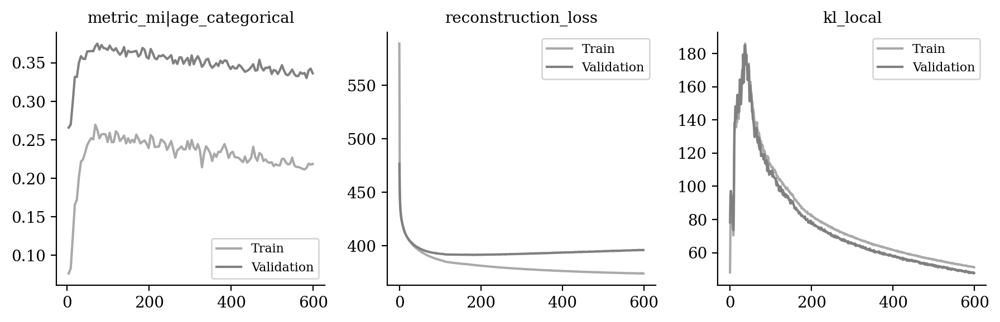

In [12]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|age_categorical", "reconstruction_loss", "kl_local"]
)

In [13]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [14]:
sublatent = DM.configurations.get_by_obs_key("age_training").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

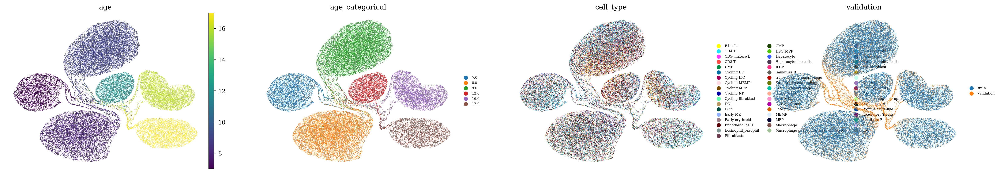

In [15]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

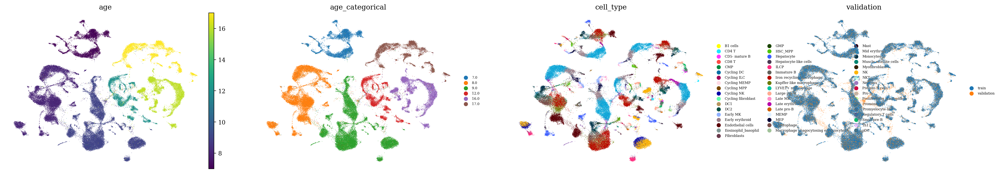

In [16]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

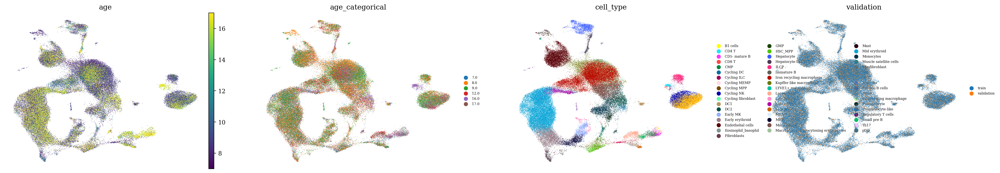

In [17]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )